In [ ]:
import zipfile
import os

zip_path = "../data/archive (7).zip"
extract_to = "../data/"

# Extract files
with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_to)

print("✅ Extraction complete! Files extracted to:", extract_to)
print("📁 Files now available:", os.listdir(extract_to))


In [1]:
import pandas as pd
import matplotlib.pyplot as plt 
import seaborn as sns 
import numpy as np 
df=pd.read_csv(r"../data/data.csv")
df.head()

,Unnamed: 0,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,time_signature,valence,target,song_title,artist
0,0,0.0102,0.833,204600,0.434,0.021900,2,0.1650,-8.795,1,0.4310,150.062,4.0,0.286,1,Mask Off,Future
1,1,0.1990,0.743,326933,0.359,0.006110,1,0.1370,-10.401,1,0.0794,160.083,4.0,0.588,1,Redbone,Childish Gambino
2,2,0.0344,0.838,185707,0.412,0.000234,2,0.1590,-7.148,1,0.2890,75.044,4.0,0.173,1,Xanny Family,Future
3,3,0.6040,0.494,199413,0.338,0.510000,5,0.0922,-15.236,1,0.0261,86.468,4.0,0.230,1,Master Of None,Beach House
4,4,0.1800,0.678,392893,0.561,0.512000,5,0.4390,-11.648,0,0.0694,174.004,4.0,0.904,1,Parallel Lines,Junior Boys


In [2]:
# Drop the column that is not useful (Unnamed: 0)
df.drop(['Unnamed: 0'], axis=1, inplace=True)  # This modifies df in place

# Now getting basic info of the data

In [3]:
df.shape


(2017, 16)

In [4]:
df.info()
# so here we can get a basic idea that this data mught not have any missing value and most of them are in number 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2017 entries, 0 to 2016
Data columns (total 16 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   acousticness      2017 non-null   float64
 1   danceability      2017 non-null   float64
 2   duration_ms       2017 non-null   int64  
 3   energy            2017 non-null   float64
 4   instrumentalness  2017 non-null   float64
 5   key               2017 non-null   int64  
 6   liveness          2017 non-null   float64
 7   loudness          2017 non-null   float64
 8   mode              2017 non-null   int64  
 9   speechiness       2017 non-null   float64
 10  tempo             2017 non-null   float64
 11  time_signature    2017 non-null   float64
 12  valence           2017 non-null   float64
 13  target            2017 non-null   int64  
 14  song_title        2017 non-null   object 
 15  artist            2017 non-null   object 
dtypes: float64(10), int64(4), object(2)
memory

In [5]:
df.describe()
# From df.describe(), most features have a small standard deviation (~0.16–3), but one column has an extremely large std (~81981), indicating it’s on a very different scale compared to the rest


,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,time_signature,valence,target
count,2017.000000,2017.000000,2.017000e+03,2017.000000,2017.000000,2017.000000,2017.000000,2017.000000,2017.000000,2017.000000,2017.000000,2017.000000,2017.000000,2017.000000
mean,0.187590,0.618422,2.463062e+05,0.681577,0.133286,5.342588,0.190844,-7.085624,0.612295,0.092664,121.603272,3.968270,0.496815,0.505702
std,0.259989,0.161029,8.198181e+04,0.210273,0.273162,3.648240,0.155453,3.761684,0.487347,0.089931,26.685604,0.255853,0.247195,0.500091
min,0.000003,0.122000,1.604200e+04,0.014800,0.000000,0.000000,0.018800,-33.097000,0.000000,0.023100,47.859000,1.000000,0.034800,0.000000
25%,0.009630,0.514000,2.000150e+05,0.563000,0.000000,2.000000,0.092300,-8.394000,0.000000,0.037500,100.189000,4.000000,0.295000,0.000000
50%,0.063300,0.631000,2.292610e+05,0.715000,0.000076,6.000000,0.127000,-6.248000,1.000000,0.054900,121.427000,4.000000,0.492000,1.000000
75%,0.265000,0.738000,2.703330e+05,0.846000,0.054000,9.000000,0.247000,-4.746000,1.000000,0.108000,137.849000,4.000000,0.691000,1.000000
max,0.995000,0.984000,1.004627e+06,0.998000,0.976000,11.000000,0.969000,-0.307000,1.000000,0.816000,219.331000,5.000000,0.992000,1.000000


In [6]:
df.isnull().sum()
# so here we can see that there are no such missing values which is quite great for us

acousticness        0
danceability        0
duration_ms         0
energy              0
instrumentalness    0
key                 0
liveness            0
loudness            0
mode                0
speechiness         0
tempo               0
time_signature      0
valence             0
target              0
song_title          0
artist              0
dtype: int64

# Now we are going to get the insight of the data 

In [7]:
# First we are going to check the distribuition of teh data 
num_cols=df.select_dtypes(include=['int64','float64'])

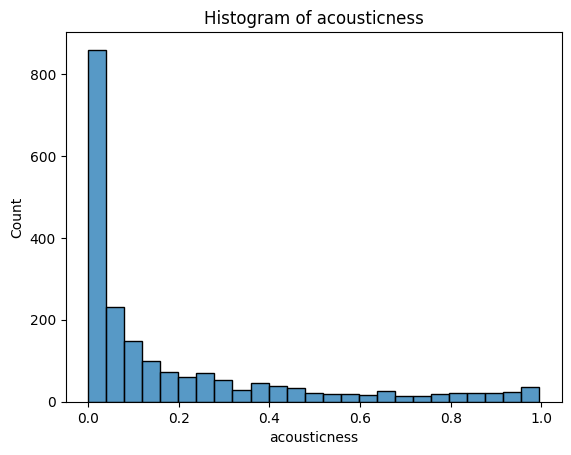

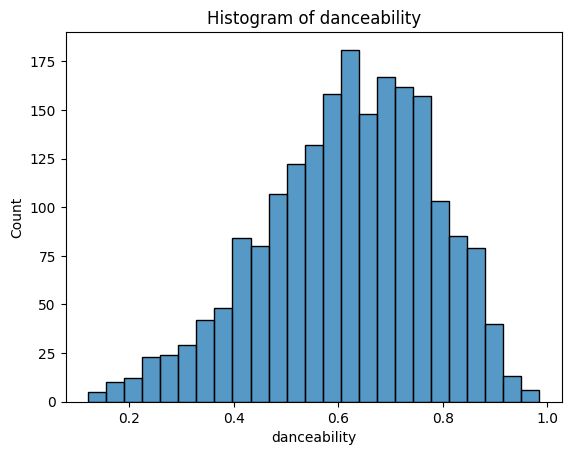

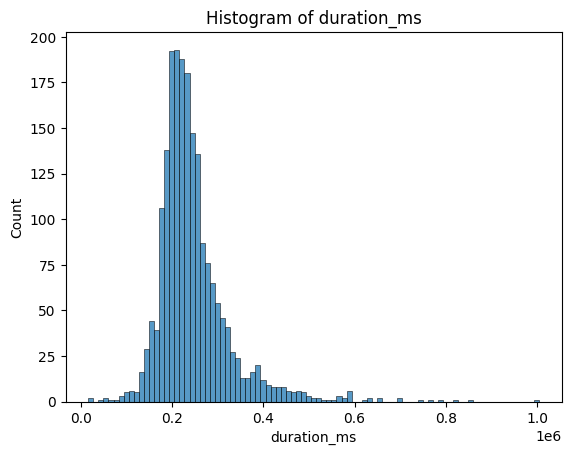

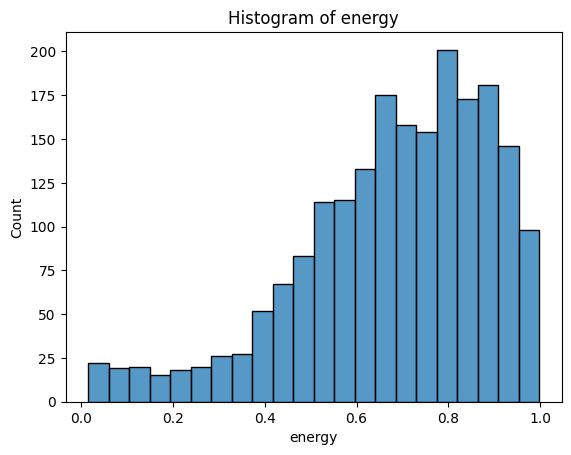

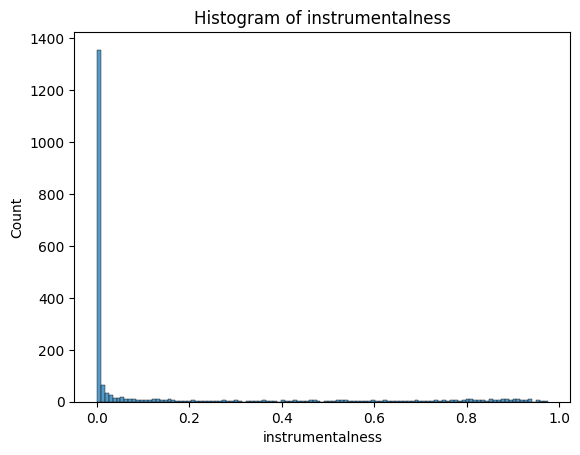

...

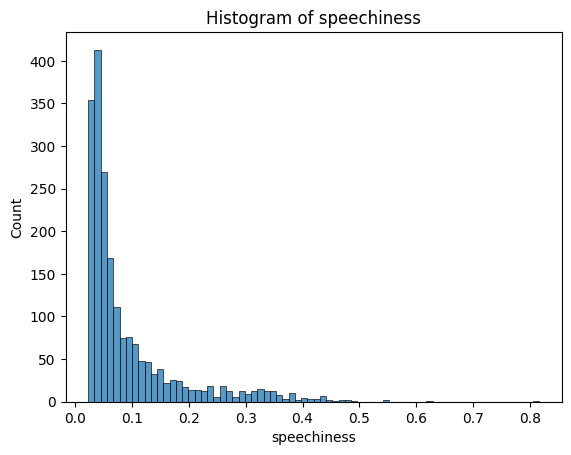

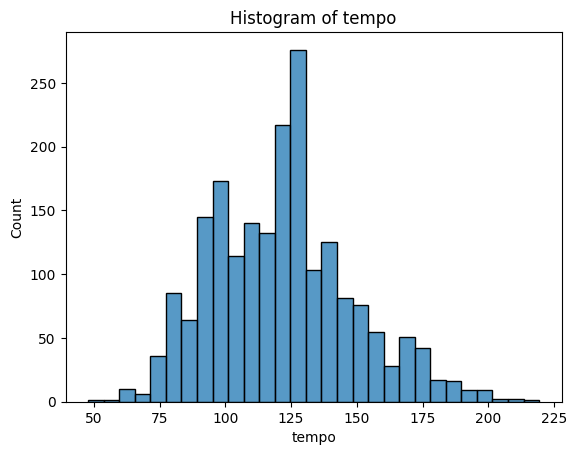

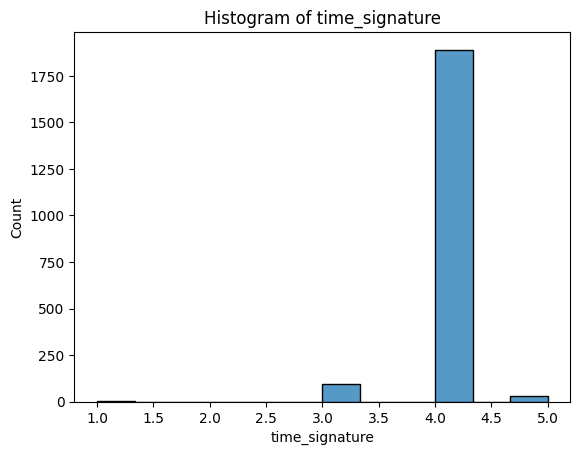

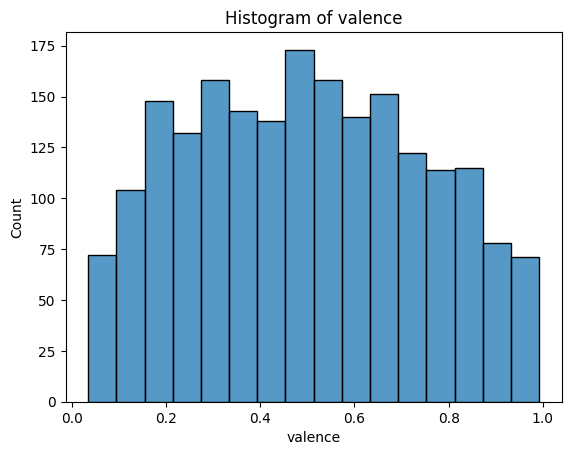

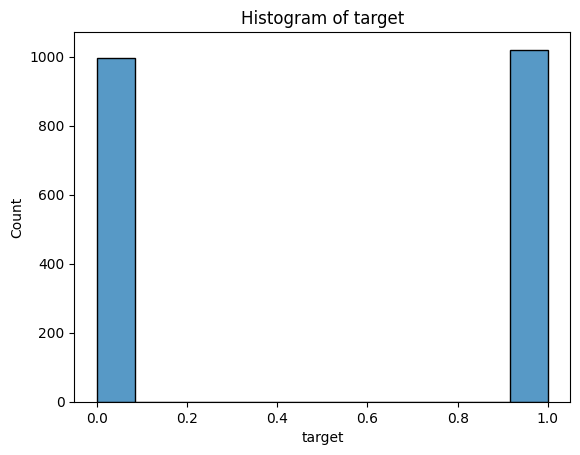

In [8]:
for col in num_cols.columns:
     sns.histplot(num_cols[col])
     plt.title(f'Histogram of {col}') 
     plt.show() 
     
# From the histograms we can see that:
# - acousticness, duration_ms, instrumentalness, liveliness, speechiness have positive (right) skew
#   (long tail extends to the right, bulk of data on left)
# - loudness, energy, danceability have negative (left) skew 
#   (long tail extends to the left, bulk of data on right)

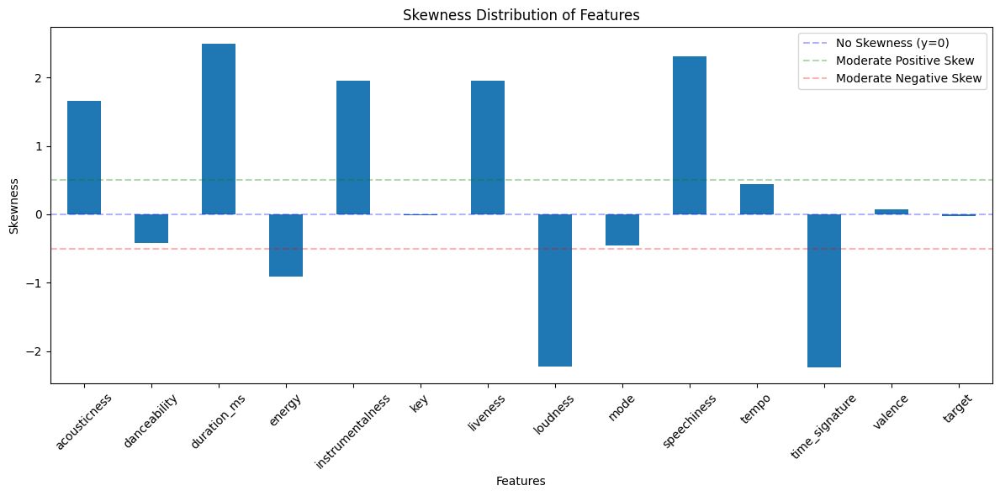


Detailed Skewness Analysis:
--------------------------------------------------
Column: acousticness
Skewness: 1.66
Status: Highly Positively (Right) Skewed
--------------------------------------------------
Column: danceability
Skewness: -0.42
Status: Slightly Negatively Skewed
--------------------------------------------------
Column: duration_ms
Skewness: 2.50
Status: Highly Positively (Right) Skewed
--------------------------------------------------
Column: energy
Skewness: -0.91
Status: Highly Negatively (Left) Skewed
--------------------------------------------------
Column: instrumentalness
Skewness: 1.95
Status: Highly Positively (Right) Skewed
--------------------------------------------------
Column: key
Skewness: -0.01
Status: Slightly Negatively Skewed
--------------------------------------------------
Column: liveness
Skewness: 1.95
Status: Highly Positively (Right) Skewed
--------------------------------------------------
Column: loudness
Skewness: -2.23
Status: Highly Ne

In [104]:
all_skews = num_cols.skew()

# Create visualization
plt.figure(figsize=(12, 6))
all_skews.plot(kind='bar')
plt.title('Skewness Distribution of Features')
plt.xlabel('Features')
plt.ylabel('Skewness')
plt.xticks(rotation=45)
plt.axhline(y=0, color='b', linestyle='--', alpha=0.3, label='No Skewness (y=0)')
plt.axhline(y=0.5, color='g', linestyle='--', alpha=0.3, label='Moderate Positive Skew')
plt.axhline(y=-0.5, color='r', linestyle='--', alpha=0.3, label='Moderate Negative Skew')
plt.legend()
plt.tight_layout()
plt.show()

# Print detailed analysis
print("\nDetailed Skewness Analysis:")
print("-" * 50)
for col, skew_value in all_skews.items():
    print(f"Column: {col}")
    print(f"Skewness: {skew_value:.2f}")
    if skew_value > 0.5:
        print("Status: Highly Positively (Right) Skewed")
    elif skew_value >= 0:
        print("Status: Slightly Positively Skewed")
    elif skew_value > -0.5:
        print("Status: Slightly Negatively Skewed")
    else:
        print("Status: Highly Negatively (Left) Skewed")
    print("-" * 50)

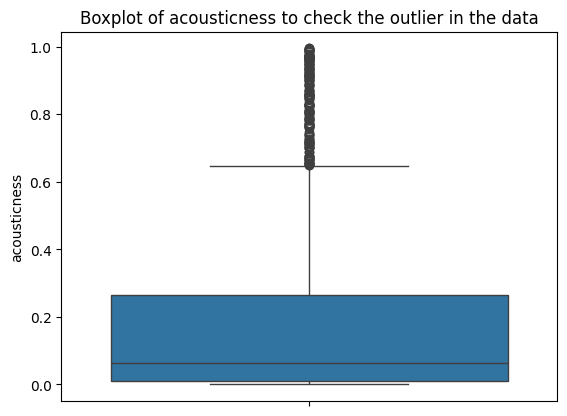

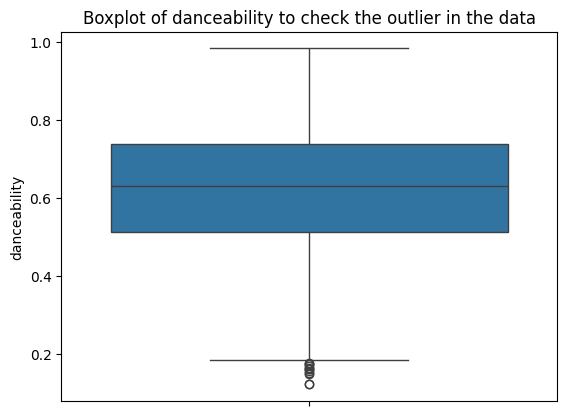

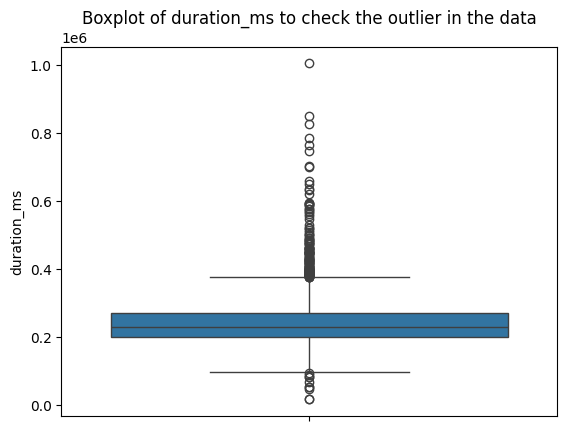

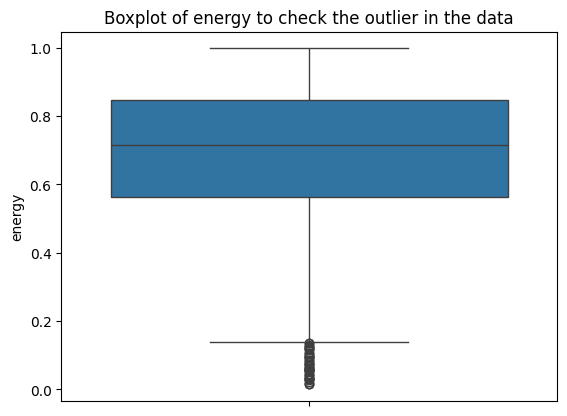

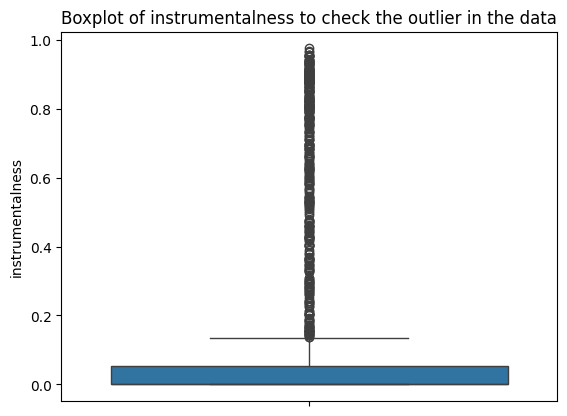

...

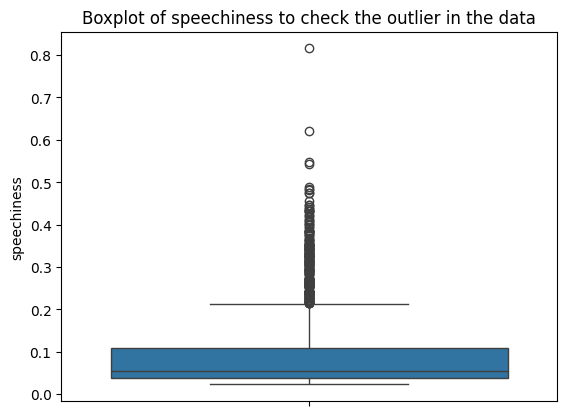

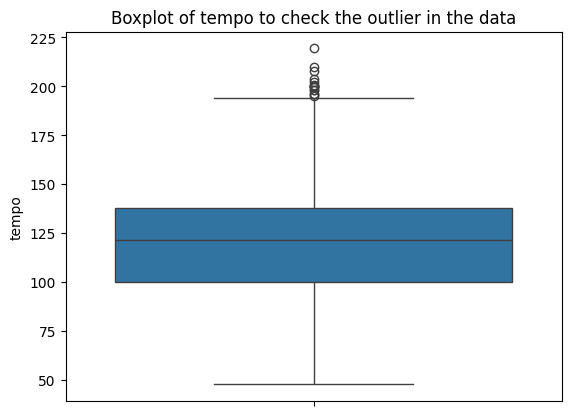

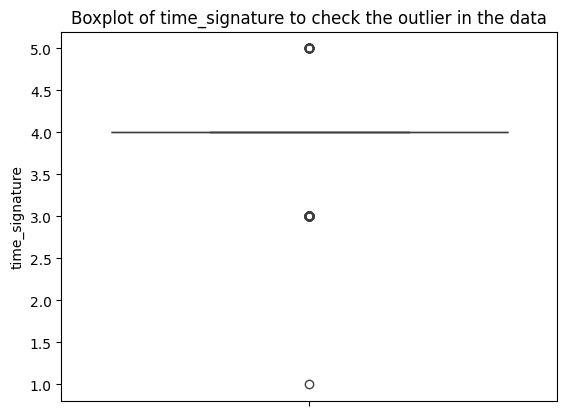

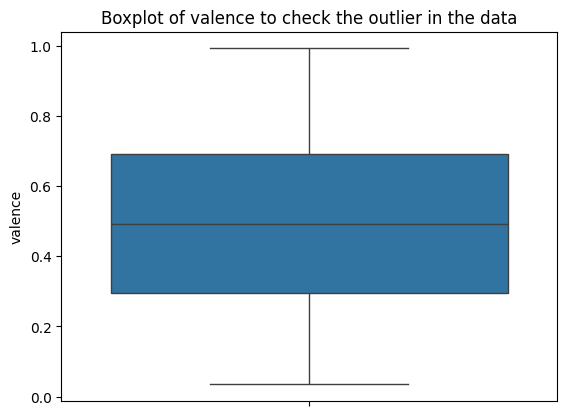

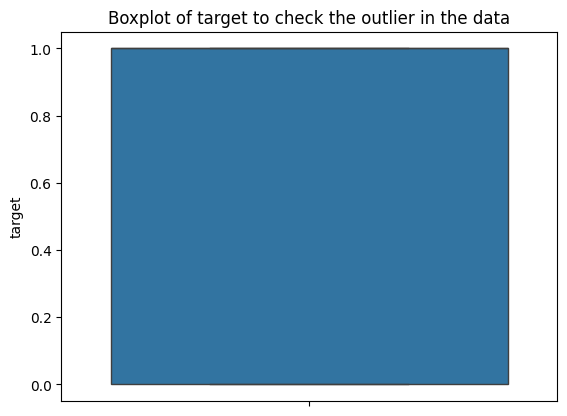

In [9]:
# Now we are going to check teh outlier of the data and all 

for col in num_cols.columns:
     sns.boxplot(num_cols[col])
     plt.title(f'Boxplot of {col} to check the outlier in the data') 
     plt.show() 

In [10]:
import pandas as pd
import numpy as np


df_capped = num_cols.copy()

print("Processing outliers for each column...")
print("-" * 50)

for col in df_capped.columns:
    # --- 1. Calculate the outlier boundaries ---
    Q1 = df_capped[col].quantile(0.25)
    Q3 = df_capped[col].quantile(0.75)
    IQR = Q3 - Q1
    
    lower_limit = Q1 - 1.5 * IQR
    upper_limit = Q3 + 1.5 * IQR
    
    outliers_before = df_capped[(df_capped[col] < lower_limit) | (df_capped[col] > upper_limit)].shape[0]
    
    if outliers_before > 0:
        # --- 3. Apply the capping ---
        df_capped[col] = df_capped[col].clip(lower=lower_limit, upper=upper_limit)
        
        print(f"Column '{col}':")
        print(f"  - Found and capped {outliers_before} outliers.")
        print(f"  - Data is now capped between {lower_limit:.2f} and {upper_limit:.2f}.")
    else:
        print(f"Column '{col}':")
        print("  - No outliers found.")
    
    print("-" * 50)

print("\nOutlier treatment complete. The capped data is in the 'df_capped' DataFrame.")

Processing outliers for each column...
--------------------------------------------------
Column 'acousticness':
  - Found and capped 194 outliers.
  - Data is now capped between -0.37 and 0.65.
--------------------------------------------------
Column 'danceability':
  - Found and capped 12 outliers.
  - Data is now capped between 0.18 and 1.07.
--------------------------------------------------
Column 'duration_ms':
  - Found and capped 141 outliers.
  - Data is now capped between 94538.00 and 375810.00.
--------------------------------------------------
Column 'energy':
  - Found and capped 54 outliers.
  - Data is now capped between 0.14 and 1.27.
--------------------------------------------------
Column 'instrumentalness':
  - Found and capped 416 outliers.
  - Data is now capped between -0.08 and 0.14.
--------------------------------------------------
Column 'key':
  - No outliers found.
--------------------------------------------------
Column 'liveness':
  - Found and capped 1

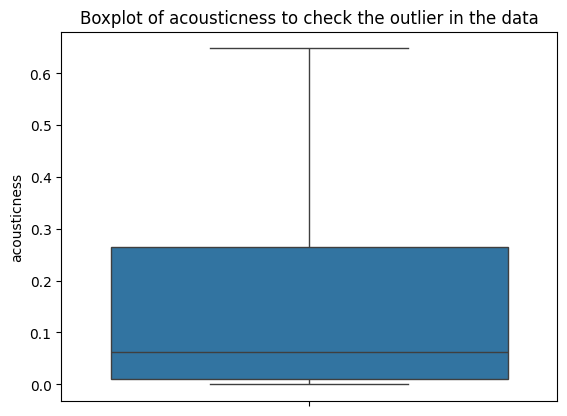

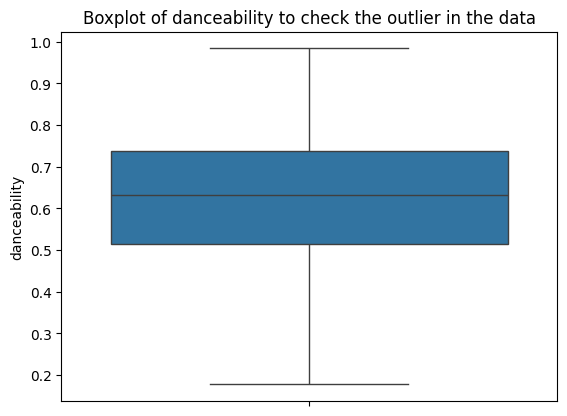

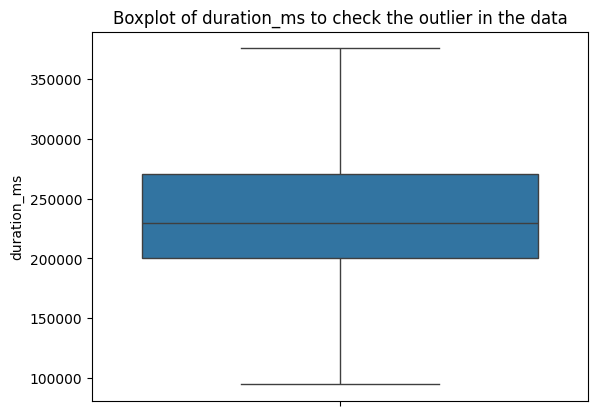

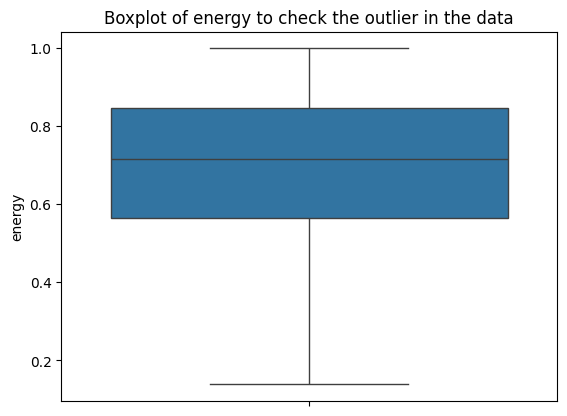

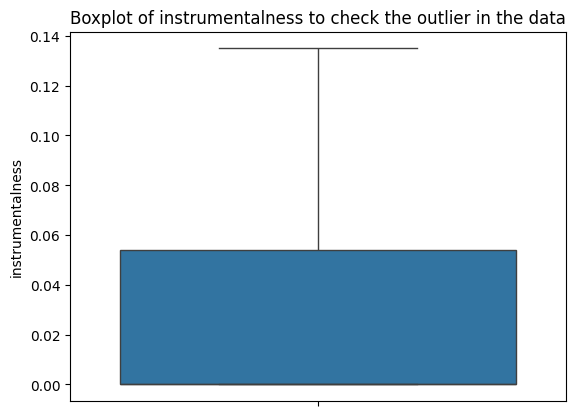

...

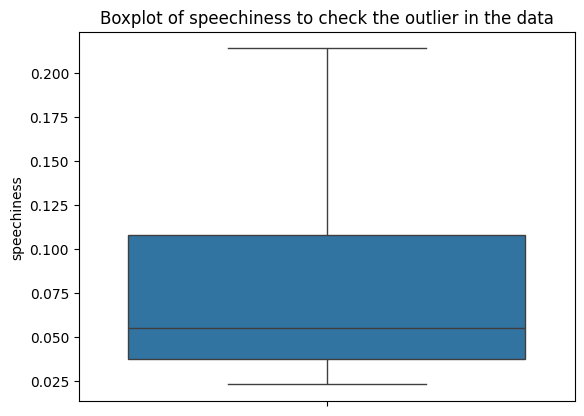

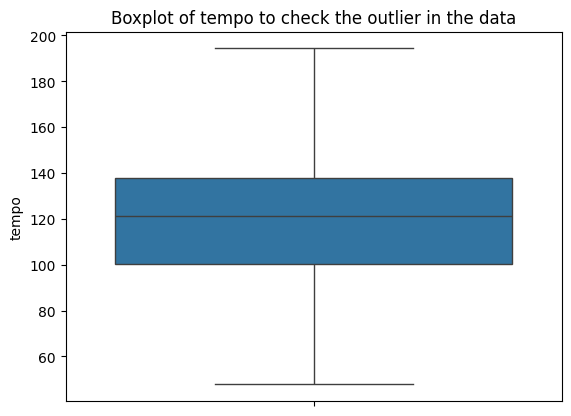

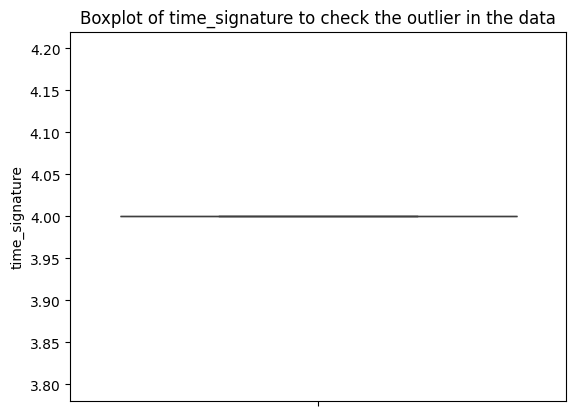

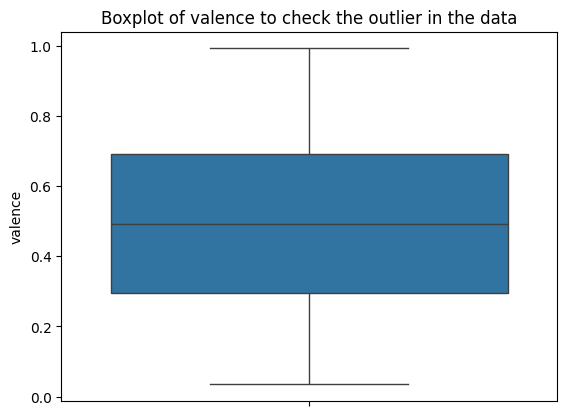

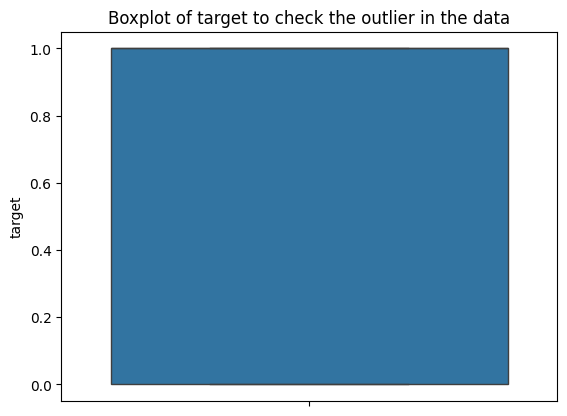

In [107]:
# Now we are going to check teh outlier of the data and all 

for col in df_capped.columns:
     sns.boxplot(df_capped[col])
     plt.title(f'Boxplot of {col} to check the outlier in the data') 
     plt.show() 

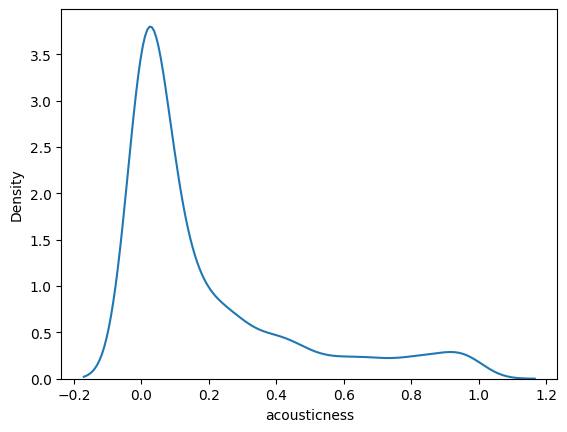

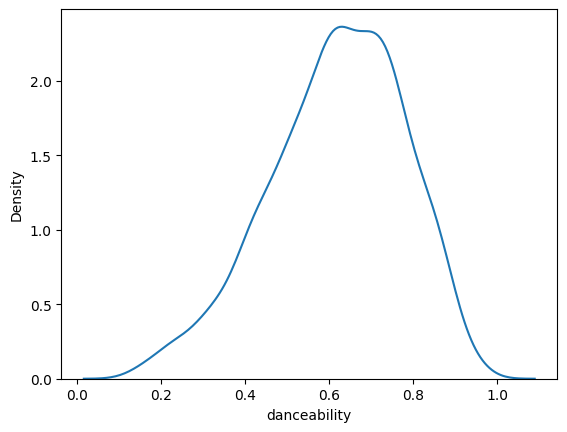

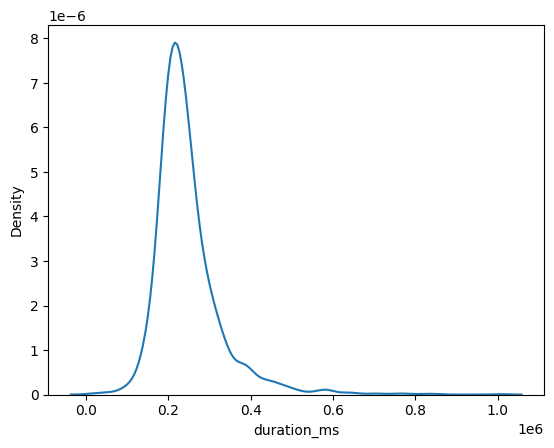

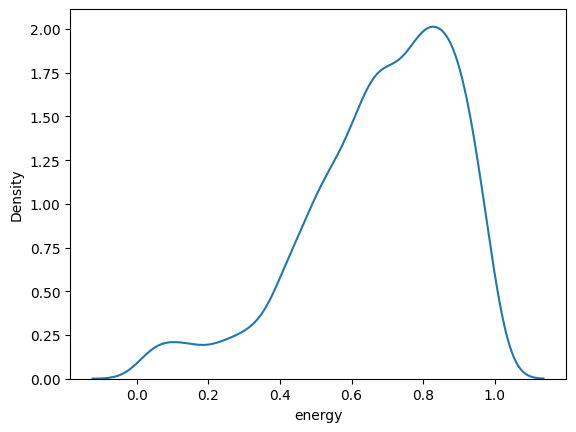

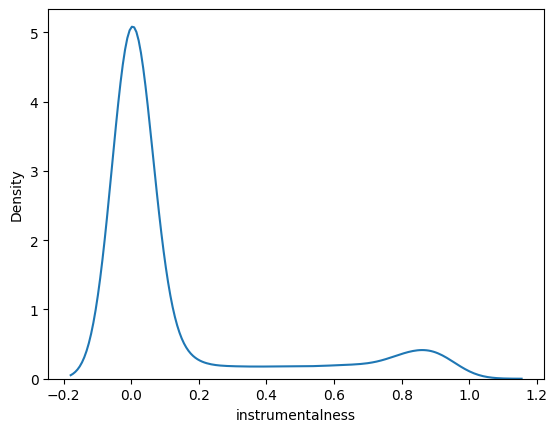

...

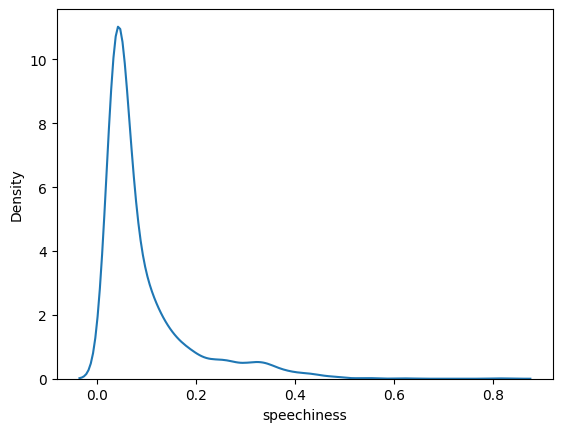

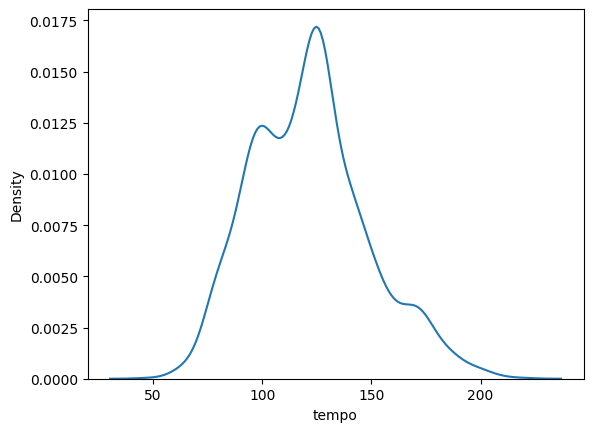

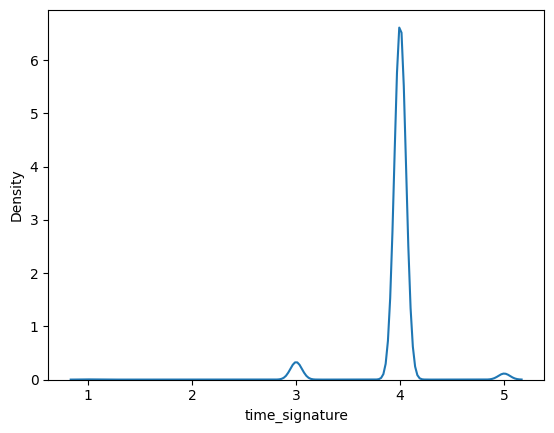

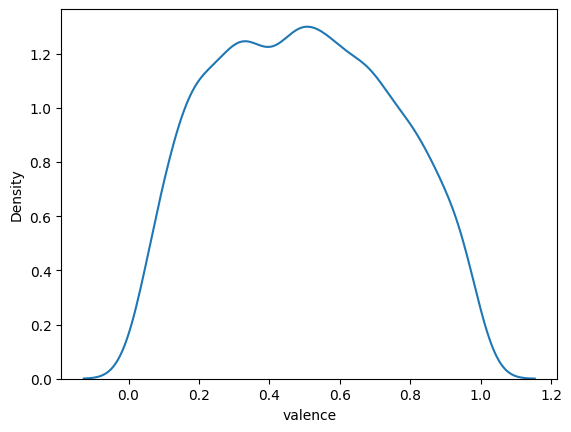

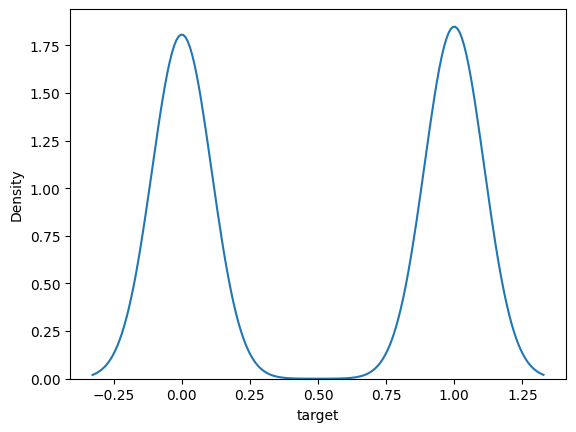

In [108]:
for col in num_cols.columns:
    sns.kdeplot(num_cols[col])
    plt.show()

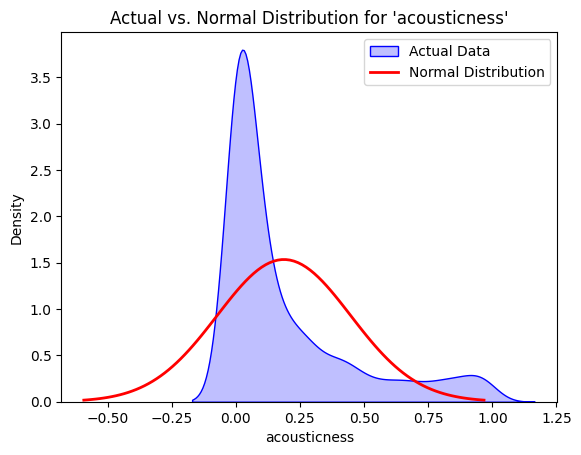

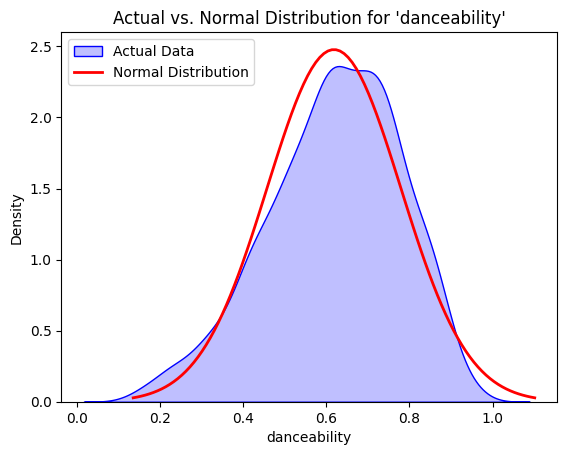

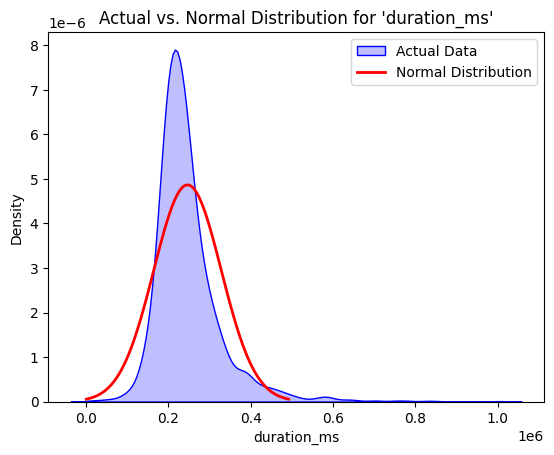

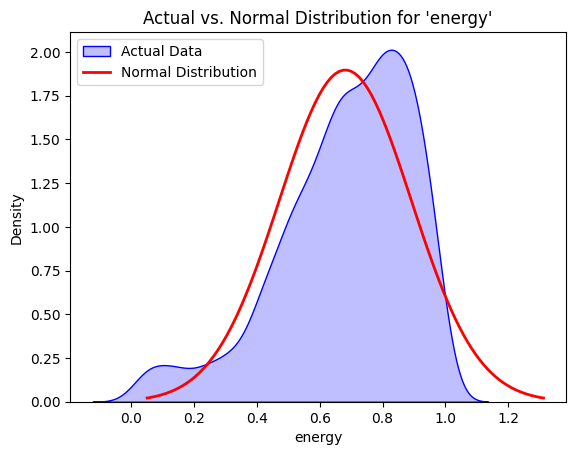

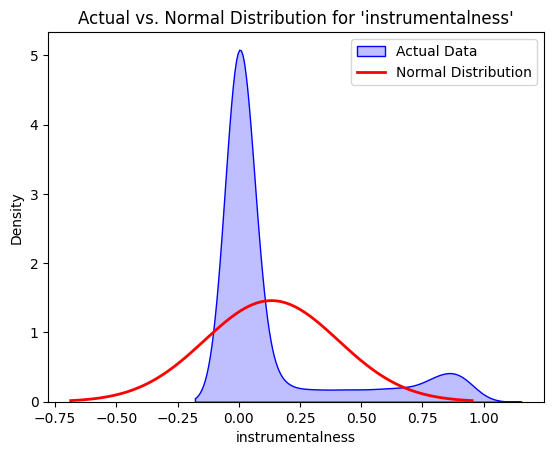

...

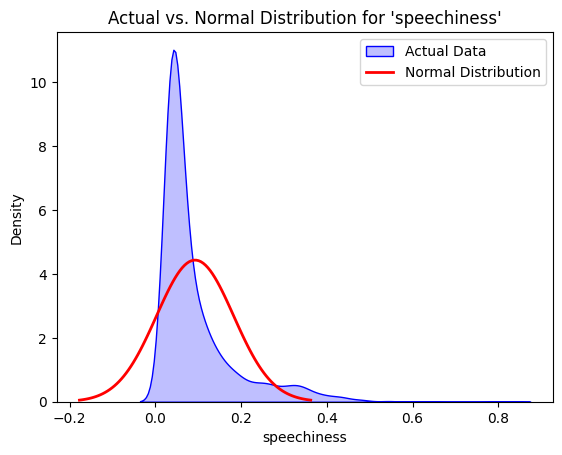

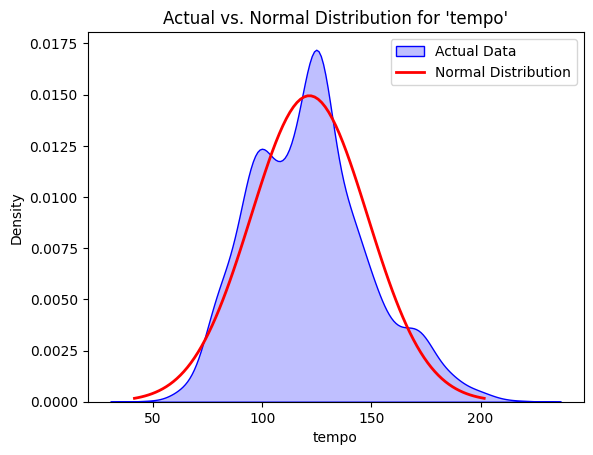

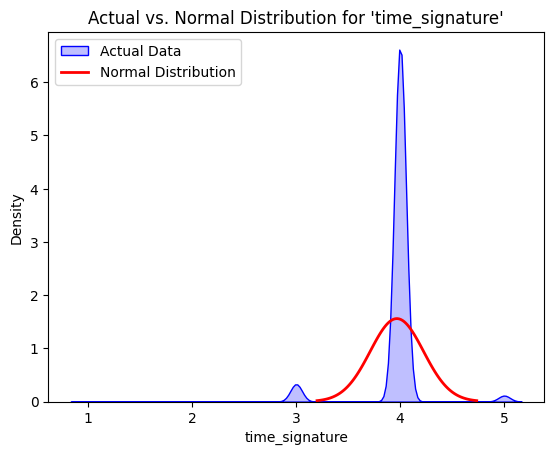

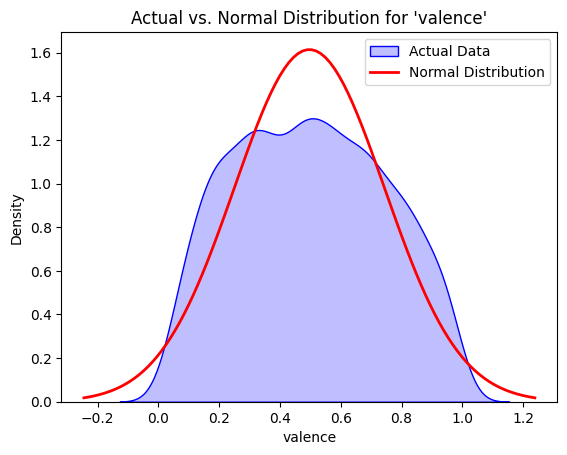

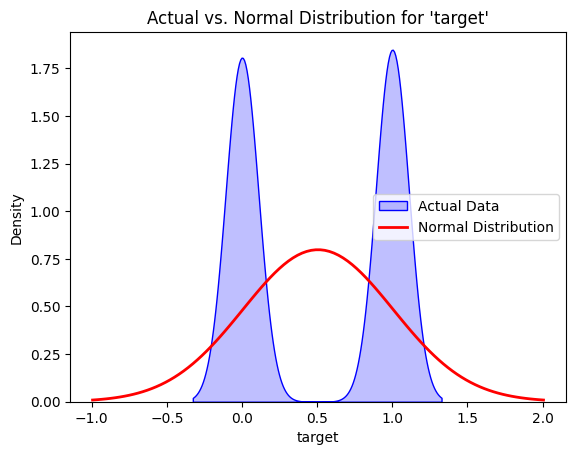

In [11]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from scipy.stats import norm 

for col in num_cols.columns:
    # 1. Plot the actual distribution of the column
    sns.kdeplot(num_cols[col], label='Actual Data', color='blue', fill=True)
    
    # 2. Calculate the mean and standard deviation of your data
    mu, std = num_cols[col].mean(), num_cols[col].std()
    
  
    x = np.linspace(mu - 3*std, mu + 3*std, 100)
    
  
    p = norm.pdf(x, mu, std)
    
   
    plt.plot(x, p, color='red', linewidth=2, label='Normal Distribution')
    
    plt.title(f"Actual vs. Normal Distribution for '{col}'")
    plt.legend()
    plt.show()

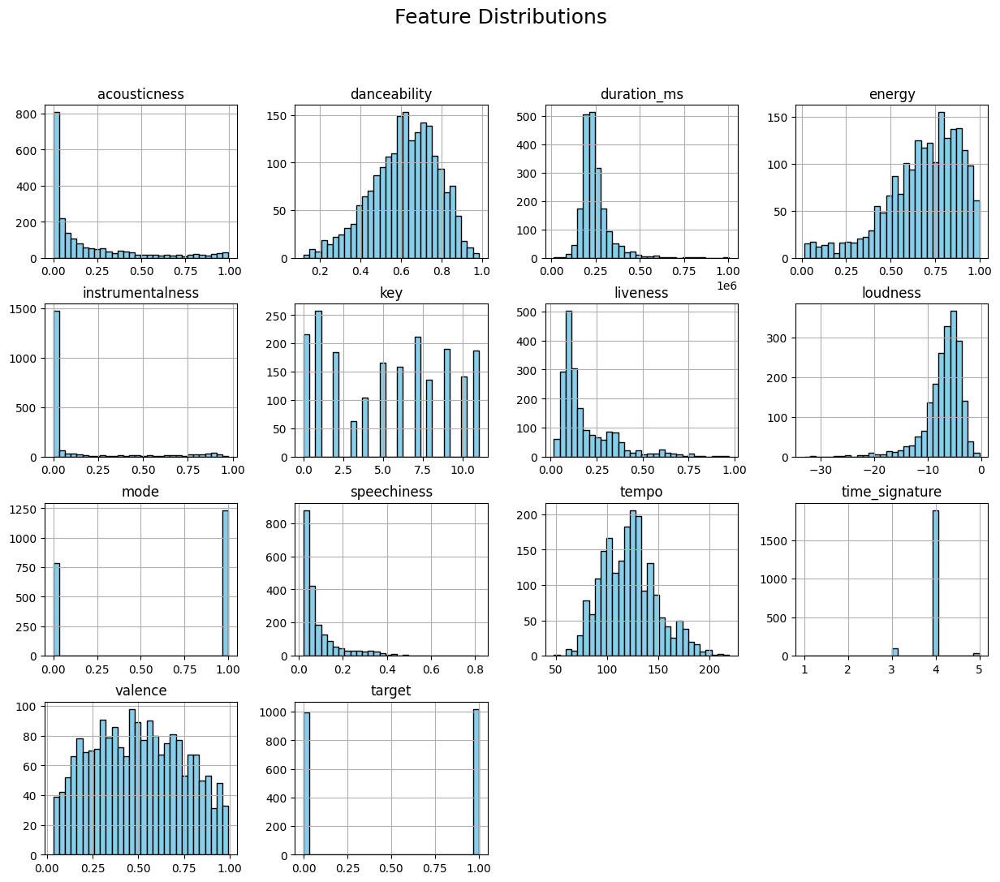

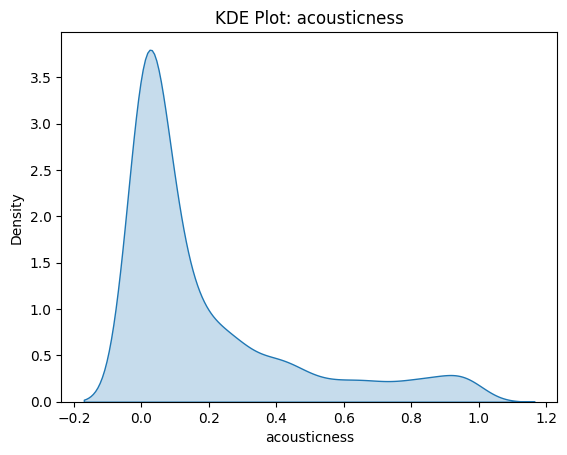

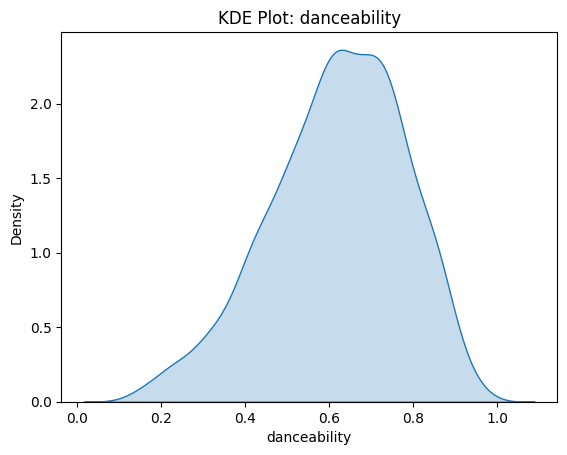

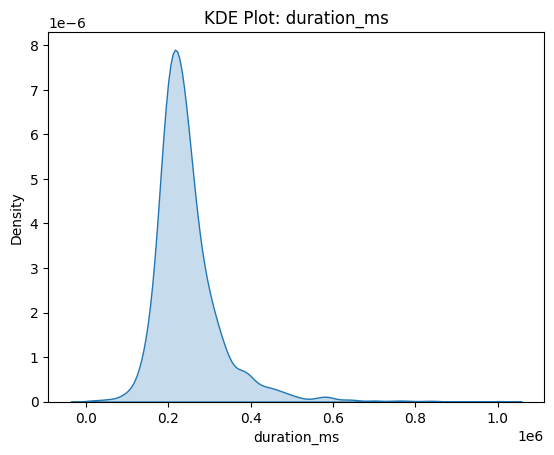

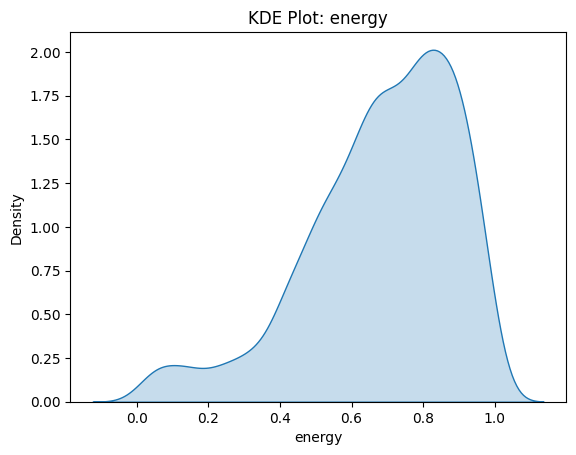

...

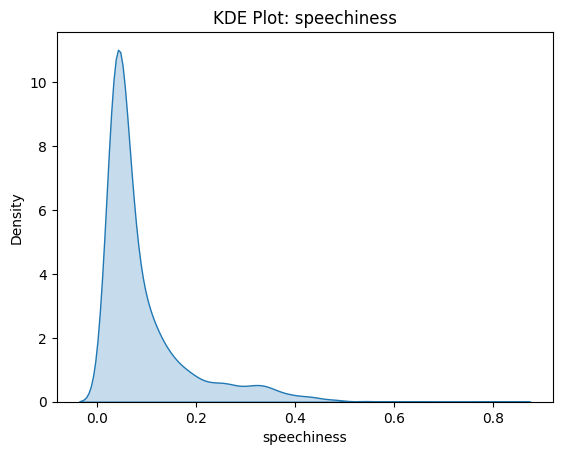

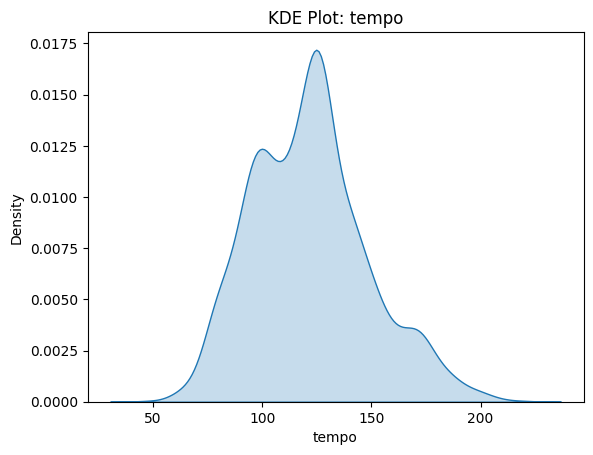

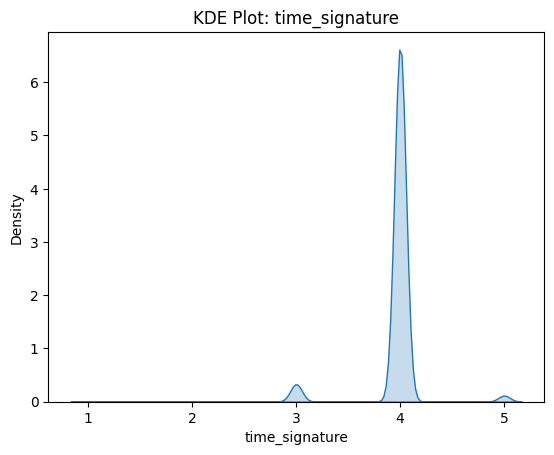

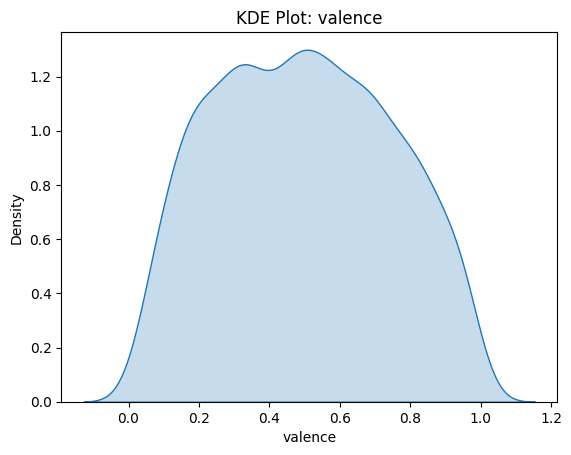

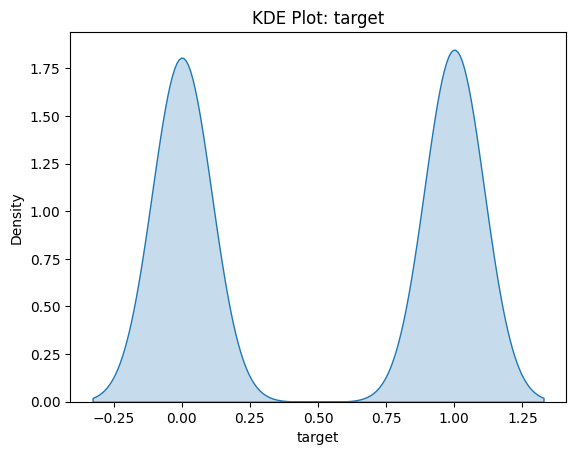

In [ ]:
df.hist(bins=30, figsize=(15, 12), color='skyblue', edgecolor='black')
plt.suptitle("Feature Distributions", fontsize=18)
plt.show()

for col in df.select_dtypes(include=['float', 'int']).columns:
    sns.kdeplot(df[col], fill=True)
    plt.title(f"KDE Plot: {col}")
    plt.show()


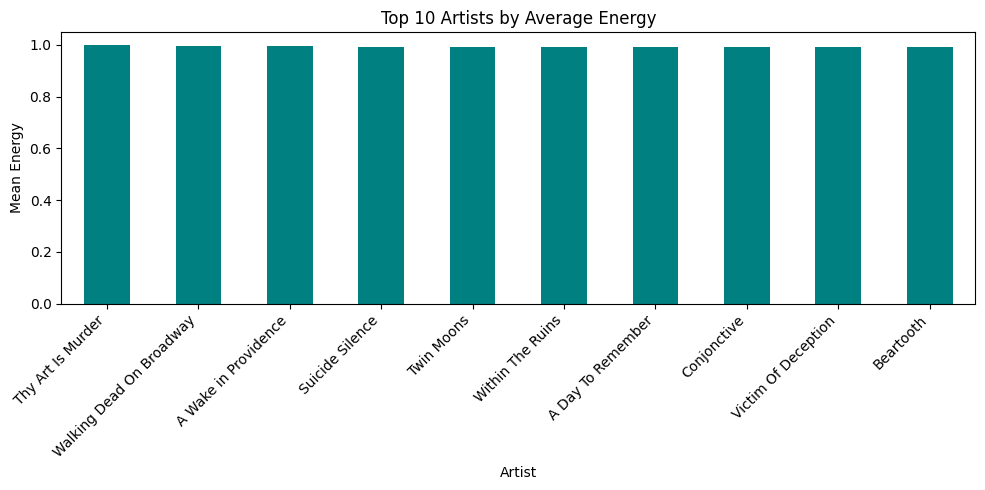

In [18]:
df.groupby('artist')['energy'].mean().sort_values(ascending=False).head(10).plot(
    kind='bar', figsize=(10,5), color='teal'
)
plt.title('Top 10 Artists by Average Energy')
plt.xlabel('Artist')
plt.ylabel('Mean Energy')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()


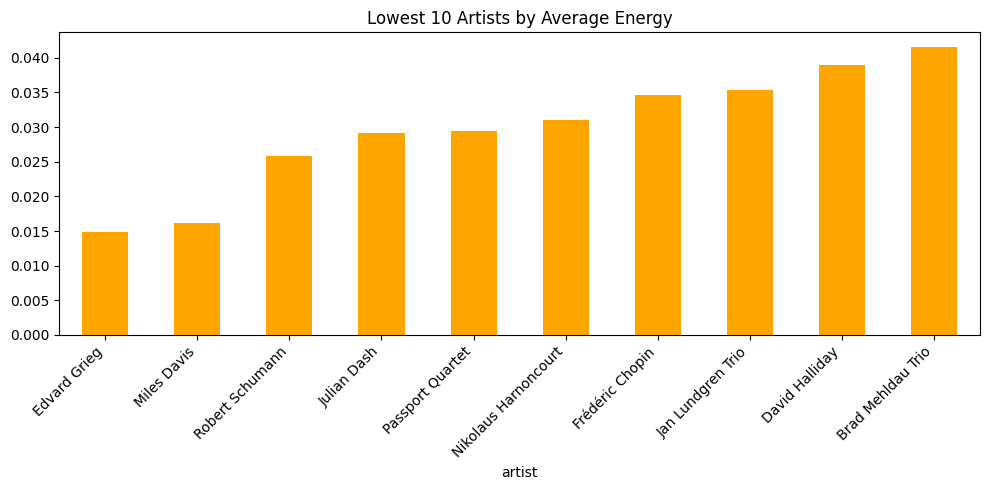

In [19]:
df.groupby('artist')['energy'].mean().sort_values().head(10).plot(
    kind='bar', figsize=(10,5), color='orange'
)
plt.title('Lowest 10 Artists by Average Energy')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()


C:\Users\91800\AppData\Local\Temp\ipykernel_14392\1714007341.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=top_tempo.values, y=top_tempo.index, palette='rocket')


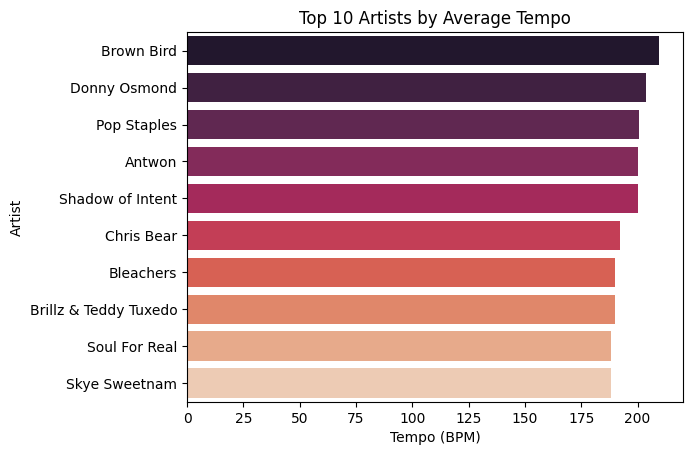

In [20]:
top_tempo = df.groupby('artist')['tempo'].mean().sort_values(ascending=False).head(10)
sns.barplot(x=top_tempo.values, y=top_tempo.index, palette='rocket')
plt.title("Top 10 Artists by Average Tempo")
plt.xlabel("Tempo (BPM)")
plt.ylabel("Artist")
plt.show()


C:\Users\91800\AppData\Local\Temp\ipykernel_14392\1889371403.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=top_valence.values, y=top_valence.index, palette='Spectral')


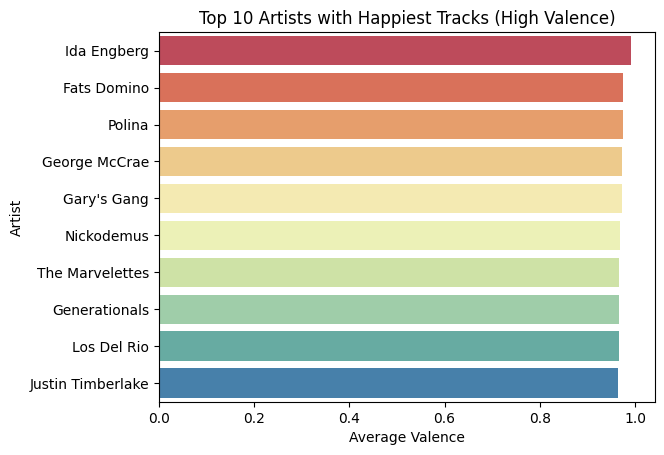

In [21]:
top_valence = df.groupby('artist')['valence'].mean().sort_values(ascending=False).head(10)
sns.barplot(x=top_valence.values, y=top_valence.index, palette='Spectral')
plt.title("Top 10 Artists with Happiest Tracks (High Valence)")
plt.xlabel("Average Valence")
plt.ylabel("Artist")
plt.show()


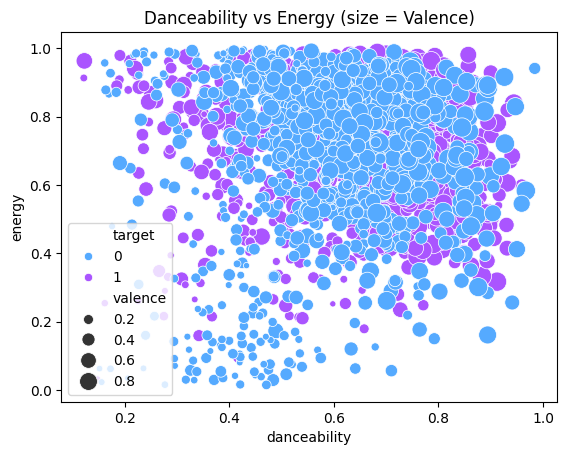

In [22]:
sns.scatterplot(x='danceability', y='energy', hue='target', size='valence',
                sizes=(20,200), data=df, palette='cool')
plt.title("Danceability vs Energy (size = Valence)")
plt.show()


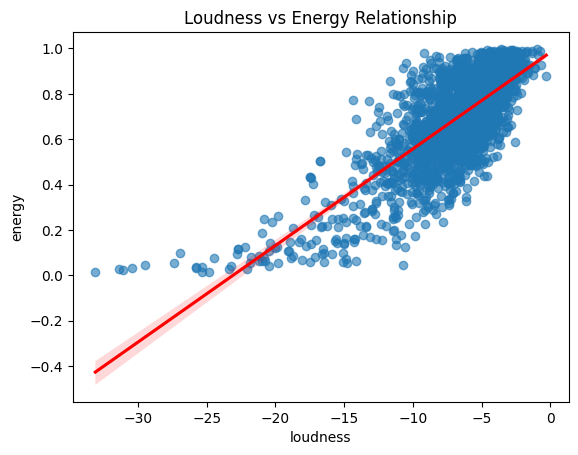

In [23]:
sns.regplot(x='loudness', y='energy', data=df, scatter_kws={'alpha':0.6}, line_kws={'color':'red'})
plt.title("Loudness vs Energy Relationship")
plt.show()


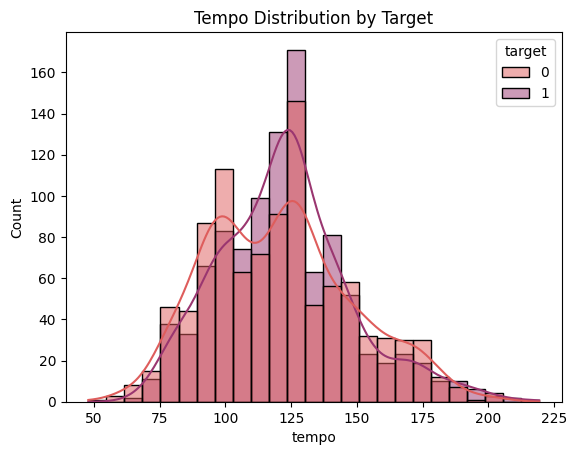

In [24]:
sns.histplot(data=df, x='tempo', hue='target', bins=25, kde=True, palette='flare')
plt.title("Tempo Distribution by Target")
plt.show()


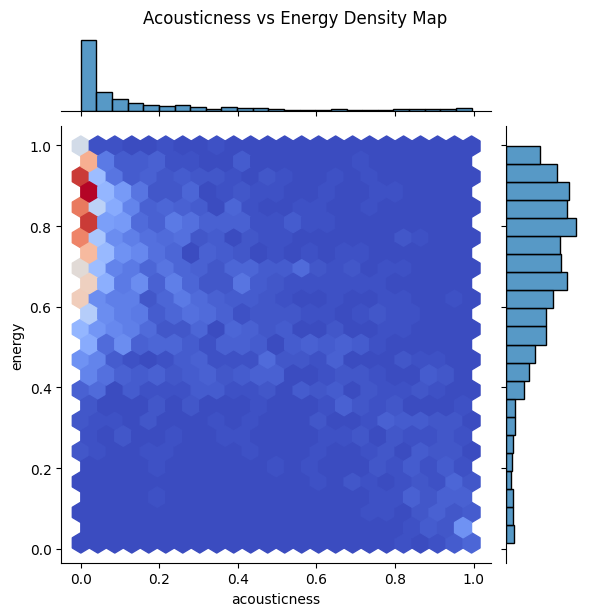

In [25]:
sns.jointplot(x='acousticness', y='energy', data=df, kind='hex', cmap='coolwarm')
plt.suptitle("Acousticness vs Energy Density Map", y=1.02)
plt.show()


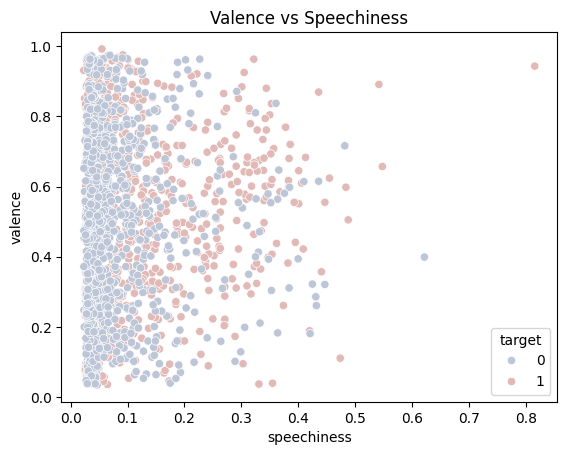

In [26]:
sns.scatterplot(x='speechiness', y='valence', data=df, hue='target', palette='vlag')
plt.title("Valence vs Speechiness")
plt.show()



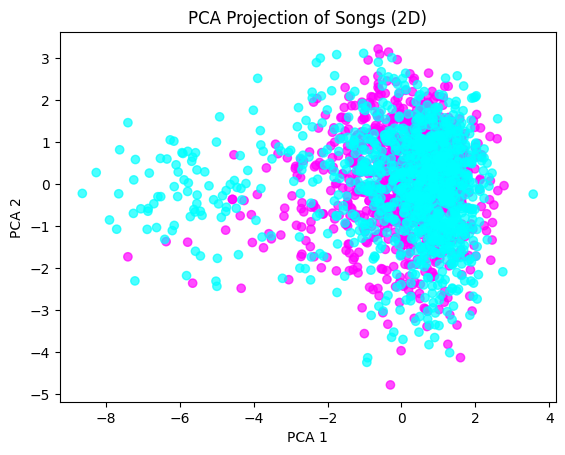

In [28]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

features = df.select_dtypes(include=['float','int']).drop(columns=['target'])
X_scaled = StandardScaler().fit_transform(features)

pca = PCA(n_components=2)
pca_result = pca.fit_transform(X_scaled)

plt.scatter(pca_result[:,0], pca_result[:,1], c=df['target'], cmap='cool', alpha=0.7)
plt.title("PCA Projection of Songs (2D)")
plt.xlabel("PCA 1")
plt.ylabel("PCA 2")
plt.show()


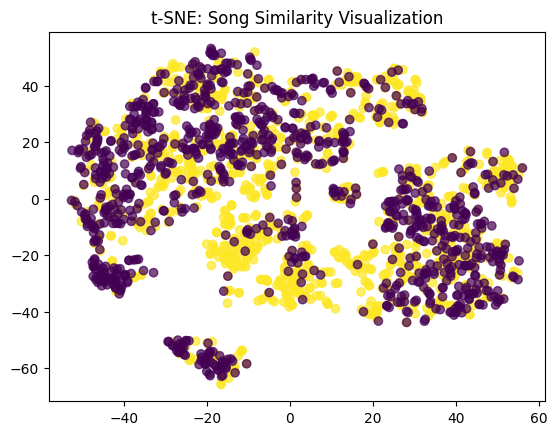

In [29]:
from sklearn.manifold import TSNE

tsne = TSNE(n_components=2, random_state=42, perplexity=20)
tsne_result = tsne.fit_transform(X_scaled)

plt.scatter(tsne_result[:,0], tsne_result[:,1], c=df['target'], cmap='viridis', alpha=0.7)
plt.title("t-SNE: Song Similarity Visualization")
plt.show()


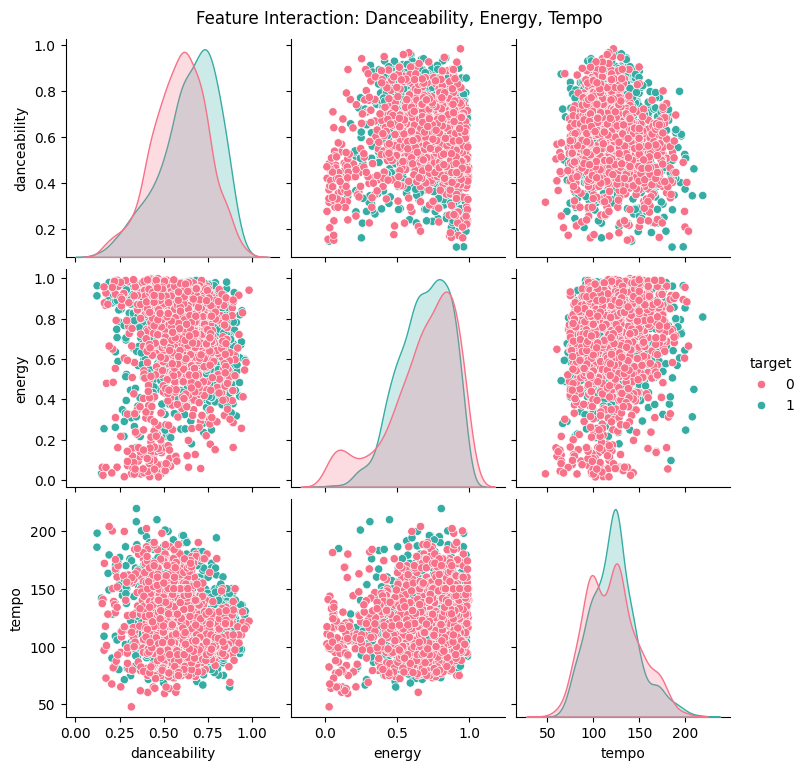

In [30]:
sns.pairplot(df[['danceability','energy','tempo','target']], hue='target', diag_kind='kde', palette='husl')
plt.suptitle("Feature Interaction: Danceability, Energy, Tempo", y=1.02)
plt.show()


C:\Users\91800\AppData\Local\Temp\ipykernel_14392\1650395988.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='key', y='energy', data=df, palette='crest')


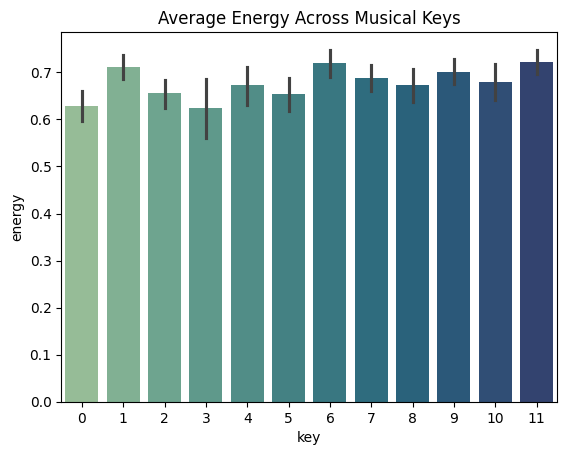

In [31]:
sns.barplot(x='key', y='energy', data=df, palette='crest')
plt.title("Average Energy Across Musical Keys")
plt.show()


C:\Users\91800\AppData\Local\Temp\ipykernel_14392\564399363.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='mode', y='valence', data=df, palette='coolwarm')


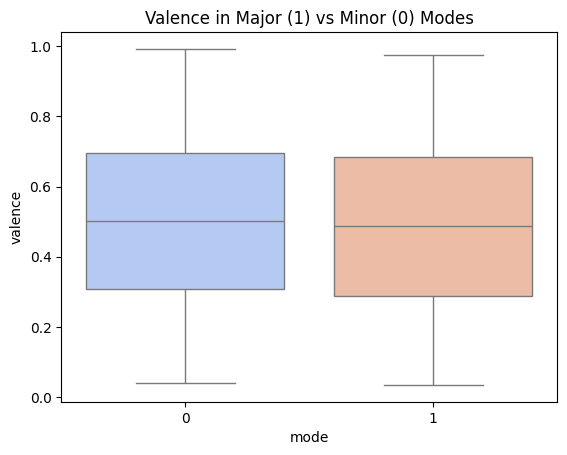

In [32]:
sns.boxplot(x='mode', y='valence', data=df, palette='coolwarm')
plt.title("Valence in Major (1) vs Minor (0) Modes")
plt.show()


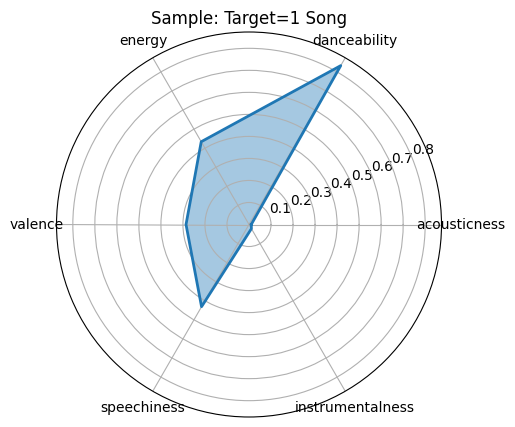

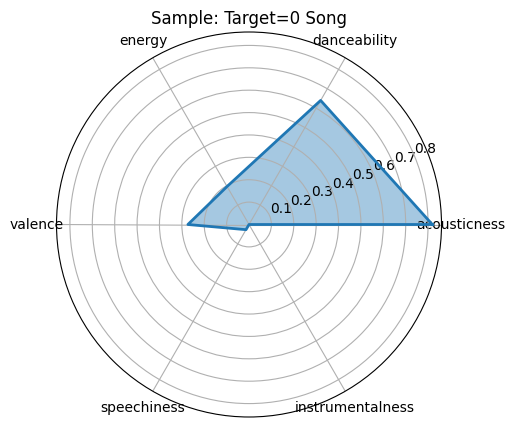

In [34]:
from math import pi

def radar_chart(song_data, title):
    categories = ['acousticness','danceability','energy','valence','speechiness','instrumentalness']
    values = [song_data[c] for c in categories]
    values += values[:1]
    angles = [n / float(len(categories)) * 2 * pi for n in range(len(categories))]
    angles += angles[:1]
    plt.figure(figsize=(5,5))
    plt.polar(angles, values, linewidth=2)
    plt.fill(angles, values, alpha=0.4)
    plt.xticks(angles[:-1], categories)
    plt.title(title)
    plt.show()

radar_chart(df[df['target']==1].iloc[0], "Sample: Target=1 Song")
radar_chart(df[df['target']==0].iloc[0], "Sample: Target=0 Song")


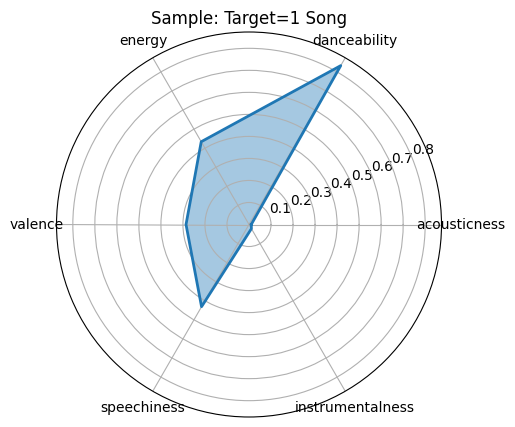

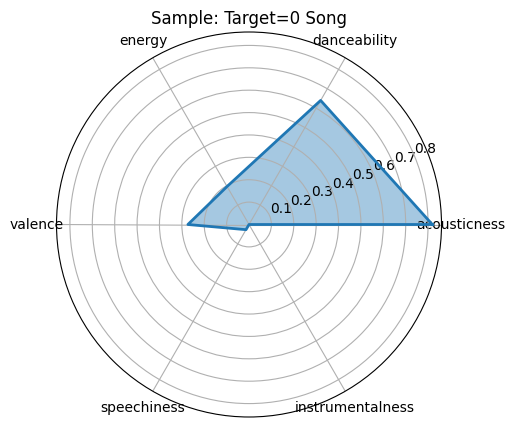

In [35]:
from math import pi

def radar_chart(song_data, title):
    categories = ['acousticness','danceability','energy','valence','speechiness','instrumentalness']
    values = [song_data[c] for c in categories]
    values += values[:1]
    angles = [n / float(len(categories)) * 2 * pi for n in range(len(categories))]
    angles += angles[:1]
    plt.figure(figsize=(5,5))
    plt.polar(angles, values, linewidth=2)
    plt.fill(angles, values, alpha=0.4)
    plt.xticks(angles[:-1], categories)
    plt.title(title)
    plt.show()

radar_chart(df[df['target']==1].iloc[0], "Sample: Target=1 Song")
radar_chart(df[df['target']==0].iloc[0], "Sample: Target=0 Song")


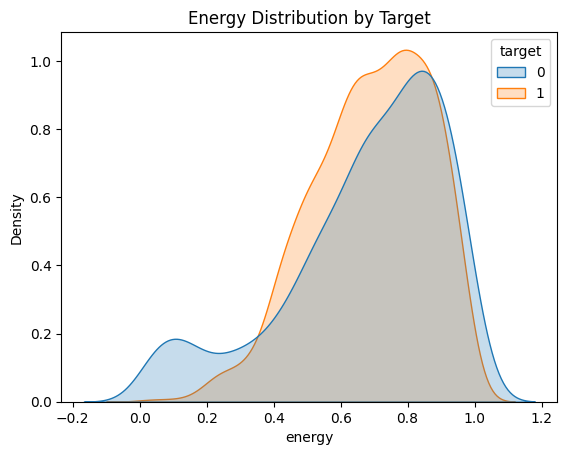

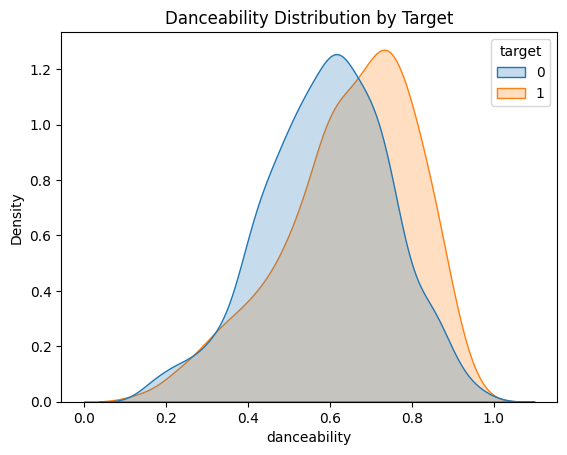

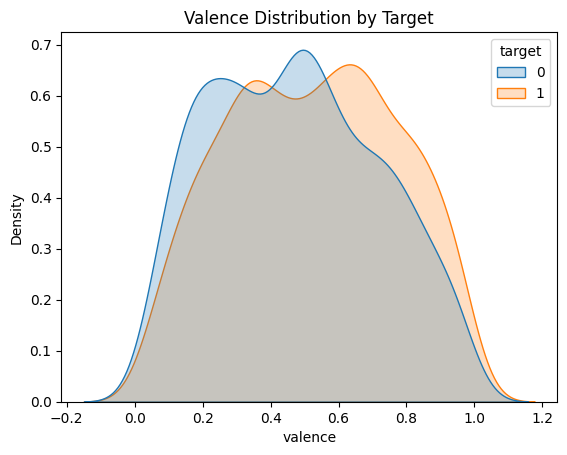

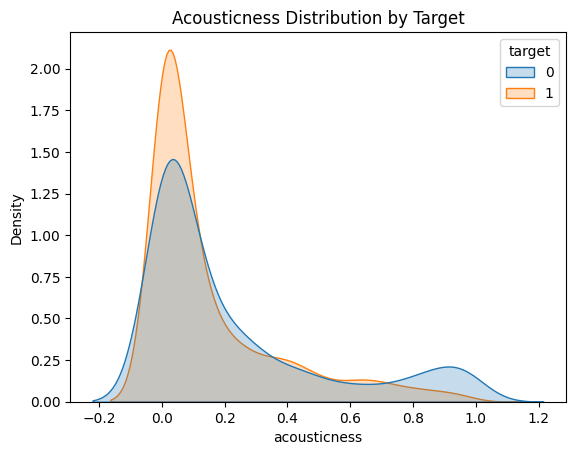

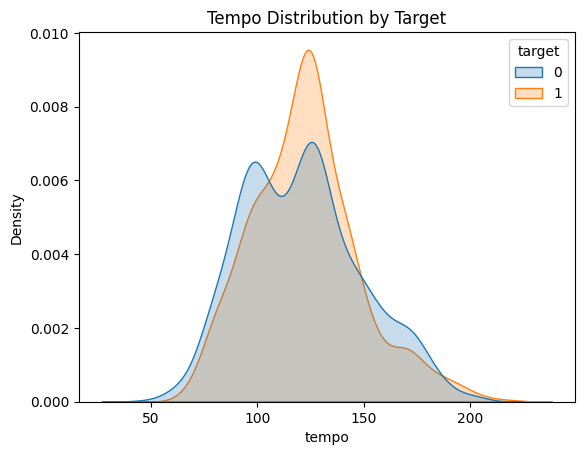

In [36]:
num_cols = ['energy','danceability','valence','acousticness','tempo']
for col in num_cols:
    sns.kdeplot(data=df, x=col, hue='target', fill=True)
    plt.title(f"{col.capitalize()} Distribution by Target")
    plt.show()


C:\Users\91800\AppData\Local\Temp\ipykernel_14392\3882413856.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='target', y=col, data=df, palette='Set2')


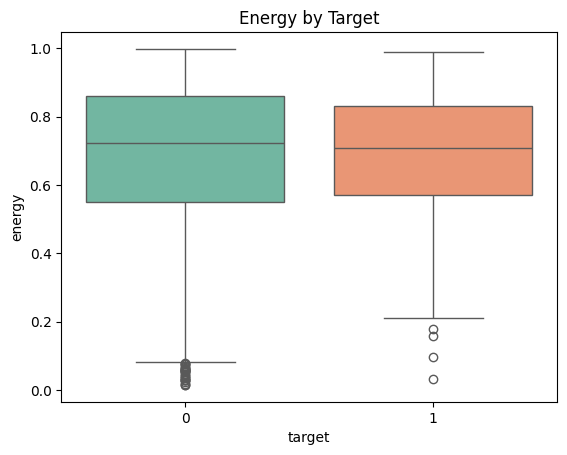

C:\Users\91800\AppData\Local\Temp\ipykernel_14392\3882413856.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='target', y=col, data=df, palette='Set2')


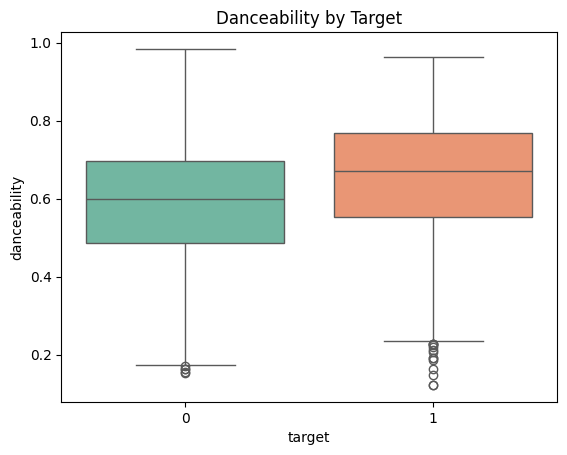

C:\Users\91800\AppData\Local\Temp\ipykernel_14392\3882413856.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='target', y=col, data=df, palette='Set2')


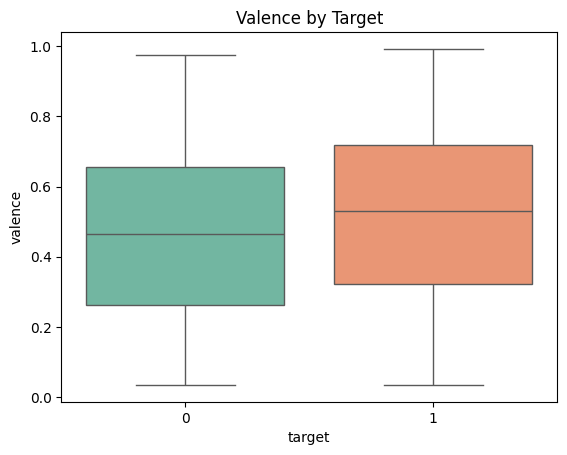

C:\Users\91800\AppData\Local\Temp\ipykernel_14392\3882413856.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='target', y=col, data=df, palette='Set2')


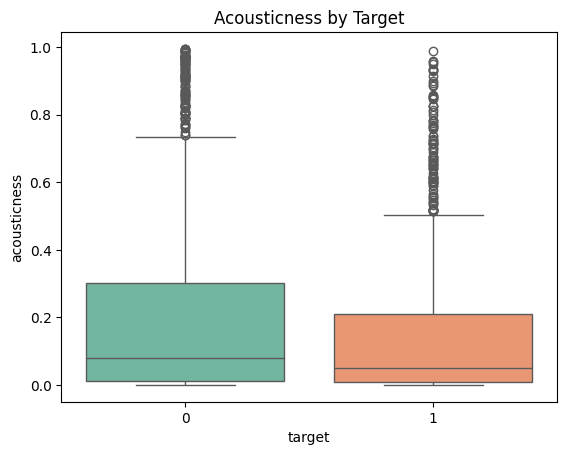

C:\Users\91800\AppData\Local\Temp\ipykernel_14392\3882413856.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='target', y=col, data=df, palette='Set2')


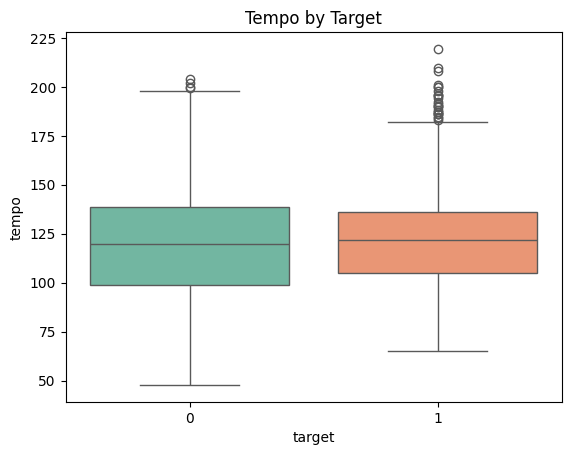

In [37]:
for col in num_cols:
    sns.boxplot(x='target', y=col, data=df, palette='Set2')
    plt.title(f"{col.capitalize()} by Target")
    plt.show()


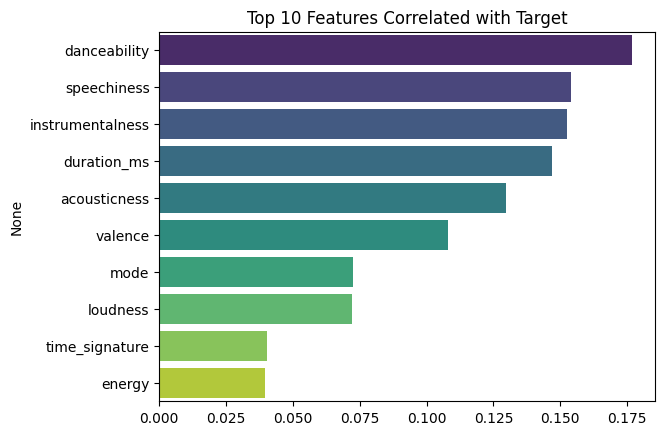

In [38]:
corr_target = df.corr(numeric_only=True)['target'].abs().sort_values(ascending=False)[1:11]
sns.barplot(x=corr_target.values, y=corr_target.index, hue=corr_target.index, legend=False, palette='viridis')
plt.title("Top 10 Features Correlated with Target")
plt.show()


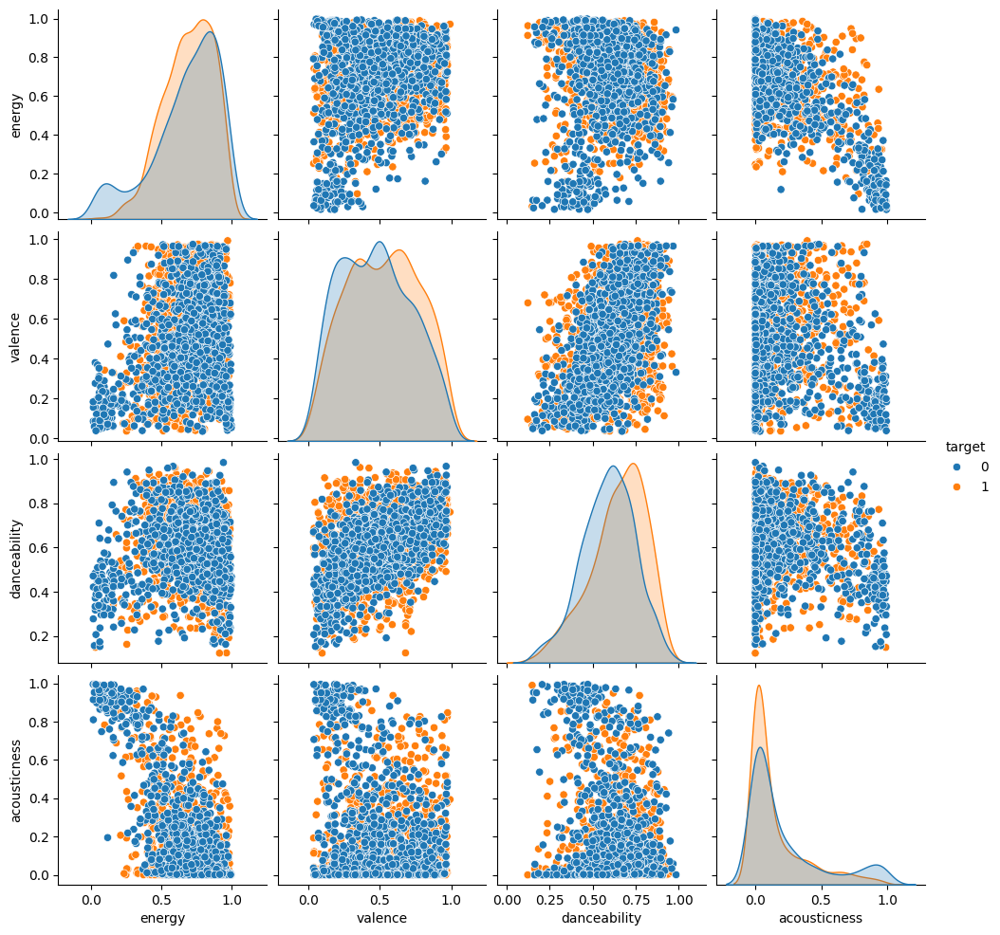

In [39]:
sns.pairplot(df[['energy','valence','danceability','acousticness','target']], hue='target', diag_kind='kde')
plt.show()


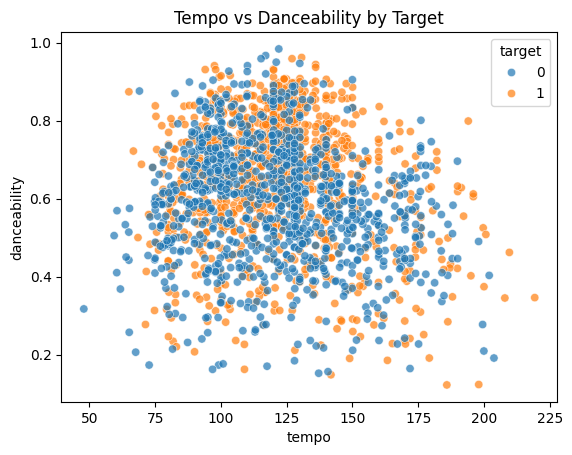

In [40]:
sns.scatterplot(x='tempo', y='danceability', hue='target', data=df, alpha=0.7)
plt.title("Tempo vs Danceability by Target")
plt.show()


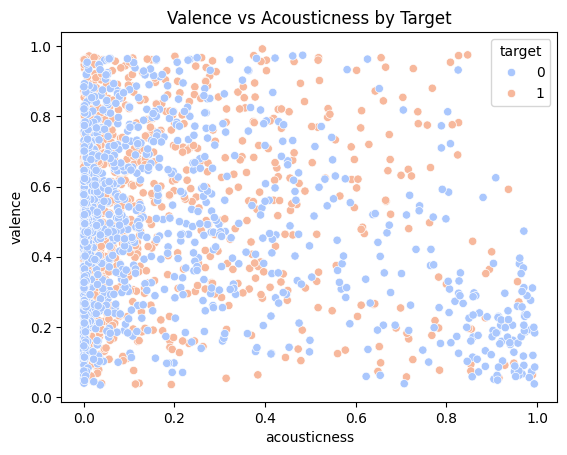

In [41]:
sns.scatterplot(x='acousticness', y='valence', hue='target', palette='coolwarm', data=df)
plt.title("Valence vs Acousticness by Target")
plt.show()


C:\Users\91800\AppData\Local\Temp\ipykernel_14392\1721165451.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x='mode', data=df, palette='muted')


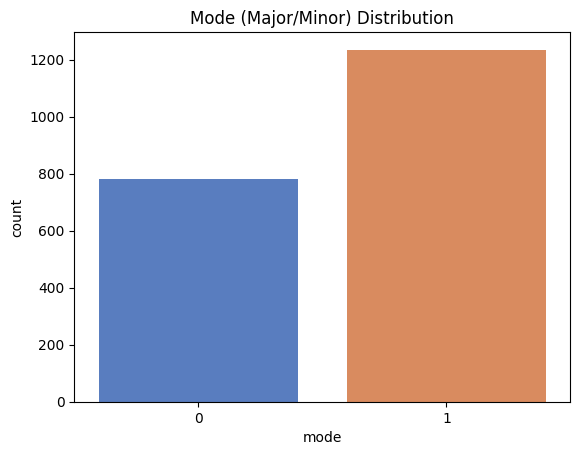

In [43]:
sns.countplot(x='mode', data=df, palette='muted')
plt.title("Mode (Major/Minor) Distribution")
plt.show()


C:\Users\91800\AppData\Local\Temp\ipykernel_14392\140420672.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x='key', data=df, palette='crest')


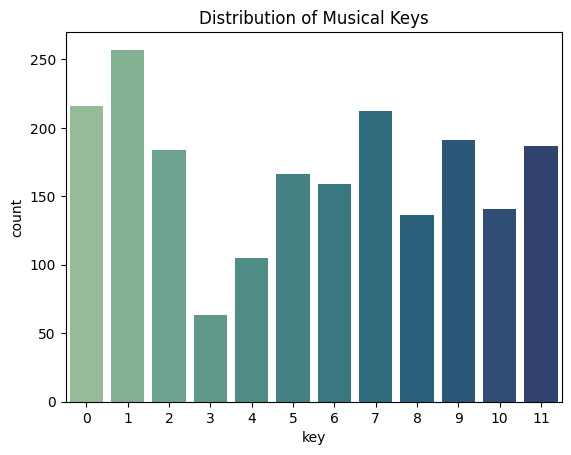

In [44]:
sns.countplot(x='key', data=df, palette='crest')
plt.title("Distribution of Musical Keys")
plt.show()


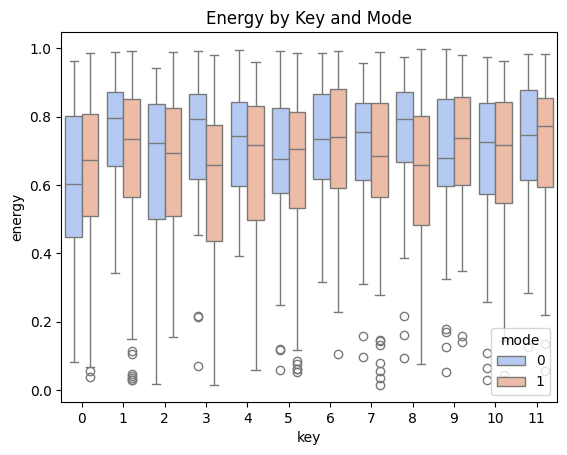

In [45]:
sns.boxplot(x='key', y='energy', hue='mode', data=df, palette='coolwarm')
plt.title("Energy by Key and Mode")
plt.show()


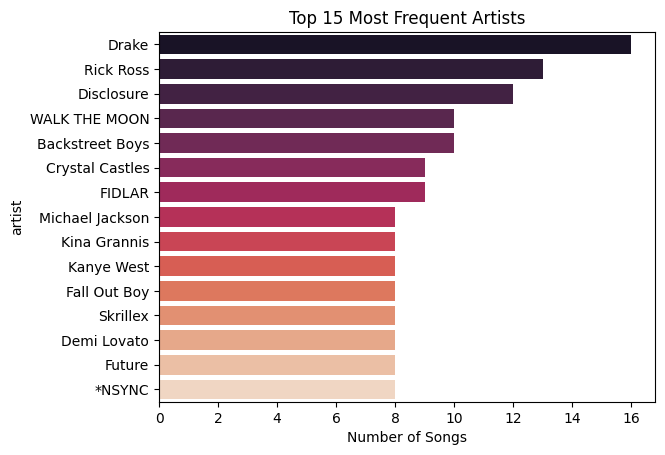

In [46]:
top_artists = df['artist'].value_counts().head(15)
sns.barplot(x=top_artists.values, y=top_artists.index, hue=top_artists.index, legend=False, palette='rocket')
plt.title("Top 15 Most Frequent Artists")
plt.xlabel("Number of Songs")
plt.show()


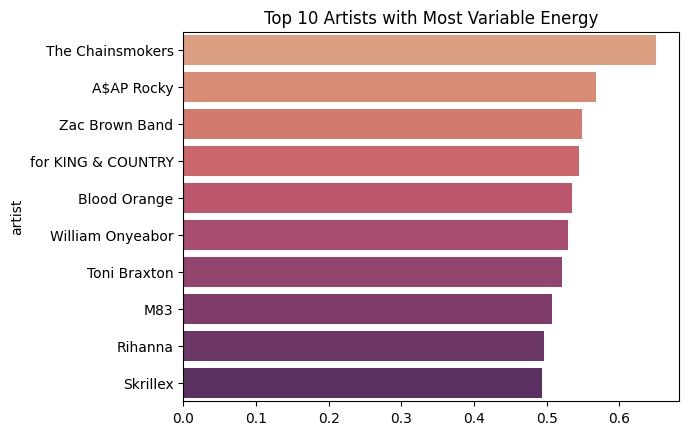

In [ ]:
artist_range = df.groupby('artist')['energy'].agg(lambda x: x.max()-x.min()).sort_values(ascending=False).head(10)
sns.barplot(x=artist_range.values, y=artist_range.index, hue=artist_range.index, legend=False, palette='flare')
plt.title("Top 10 Artists with Most Variable Energy")
plt.show()



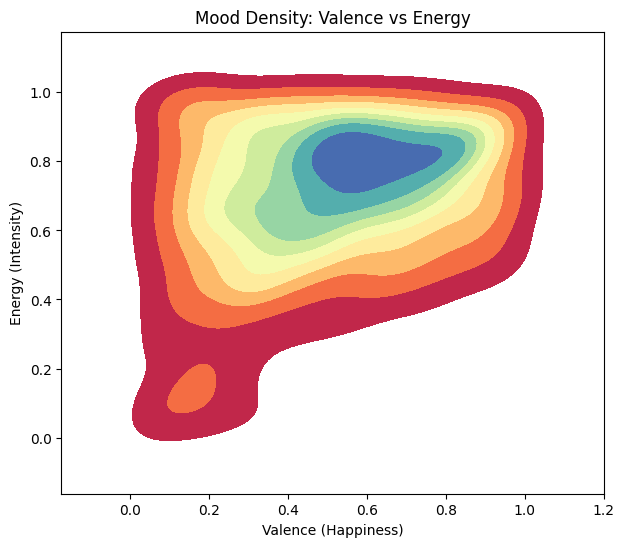

In [51]:
plt.figure(figsize=(7,6))
sns.kdeplot(x='valence', y='energy', data=df, fill=True, cmap='Spectral')
plt.title("Mood Density: Valence vs Energy")
plt.xlabel("Valence (Happiness)")
plt.ylabel("Energy (Intensity)")
plt.show()


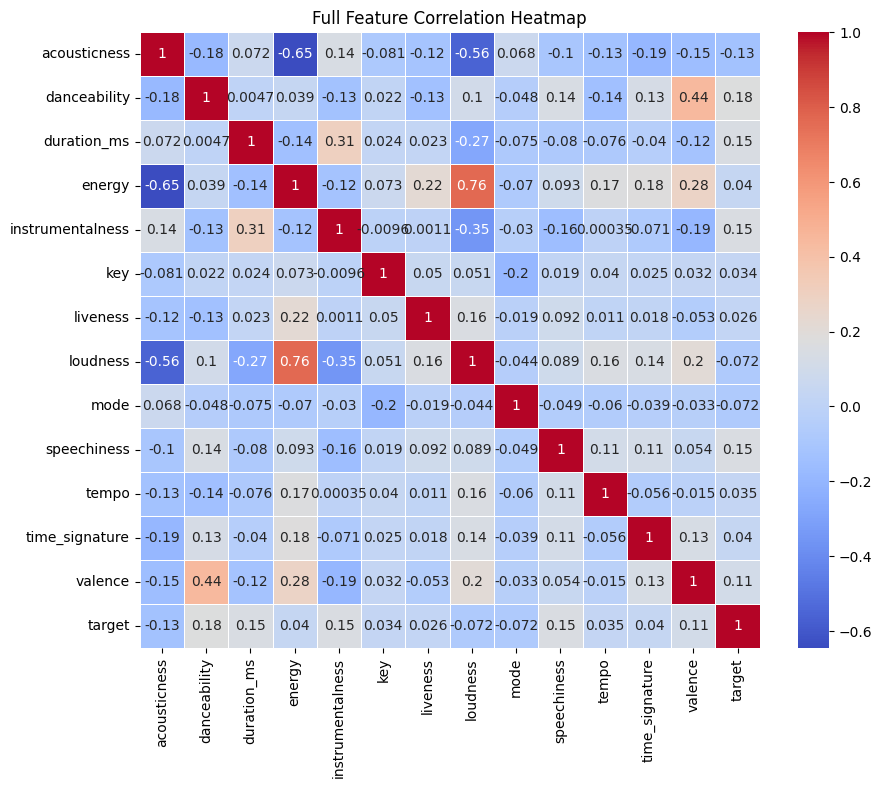

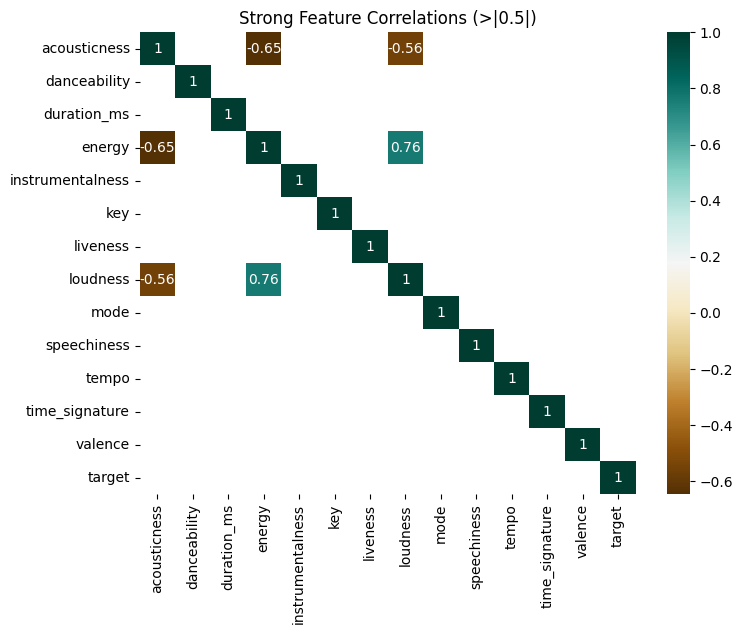

In [53]:
plt.figure(figsize=(10,8))
sns.heatmap(df.corr(numeric_only=True), cmap='coolwarm', annot=True, linewidths=0.5)
plt.title("Full Feature Correlation Heatmap")
plt.show()

plt.figure(figsize=(8,6))
corr = df.corr(numeric_only=True)
sns.heatmap(corr[(corr > 0.5) | (corr < -0.5)], cmap='BrBG', annot=True)
plt.title("Strong Feature Correlations (>|0.5|)")
plt.show()

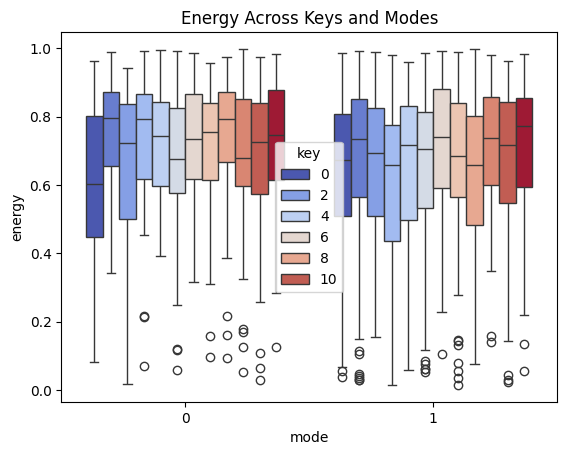

In [54]:
sns.boxplot(x='mode', y='energy', hue='key', data=df, palette='coolwarm')
plt.title("Energy Across Keys and Modes")
plt.show()


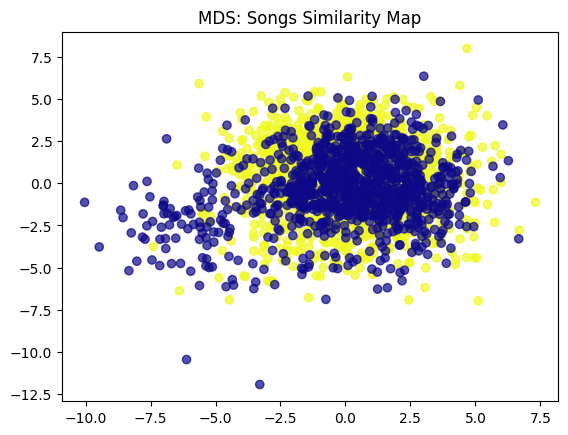

In [55]:
from sklearn.manifold import MDS
mds = MDS(n_components=2, random_state=42)
mds_result = mds.fit_transform(X_scaled)
plt.scatter(mds_result[:,0], mds_result[:,1], c=df['target'], cmap='plasma', alpha=0.7)
plt.title("MDS: Songs Similarity Map")
plt.show()


C:\Users\91800\AppData\Local\Temp\ipykernel_14392\3918839969.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='target', y=col, data=df, palette='Set3', inner='quartile')


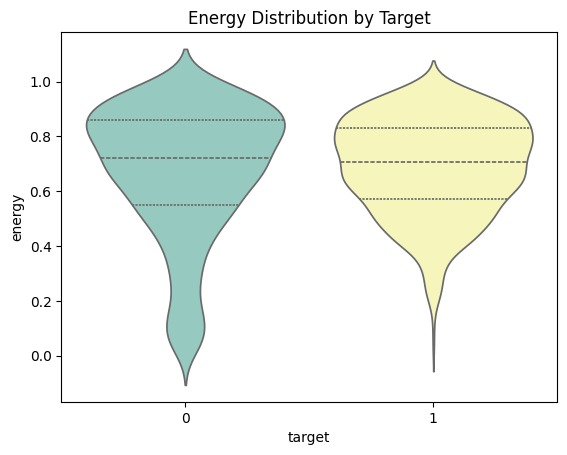

C:\Users\91800\AppData\Local\Temp\ipykernel_14392\3918839969.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='target', y=col, data=df, palette='Set3', inner='quartile')


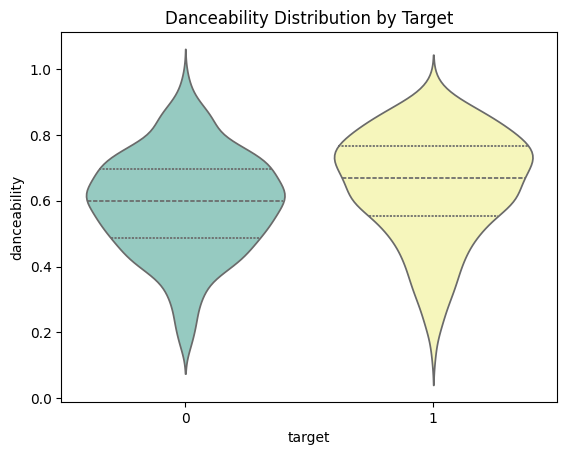

C:\Users\91800\AppData\Local\Temp\ipykernel_14392\3918839969.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='target', y=col, data=df, palette='Set3', inner='quartile')


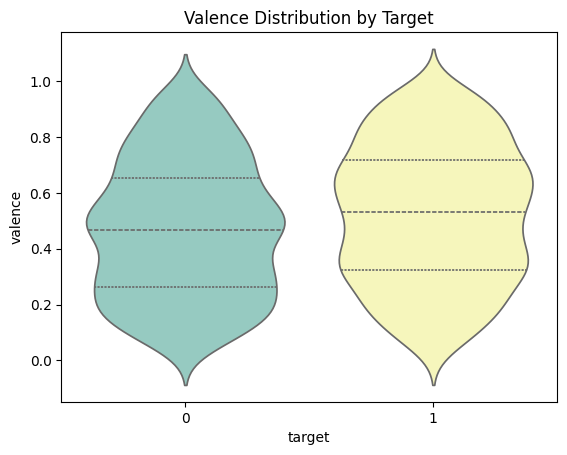

C:\Users\91800\AppData\Local\Temp\ipykernel_14392\3918839969.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='target', y=col, data=df, palette='Set3', inner='quartile')


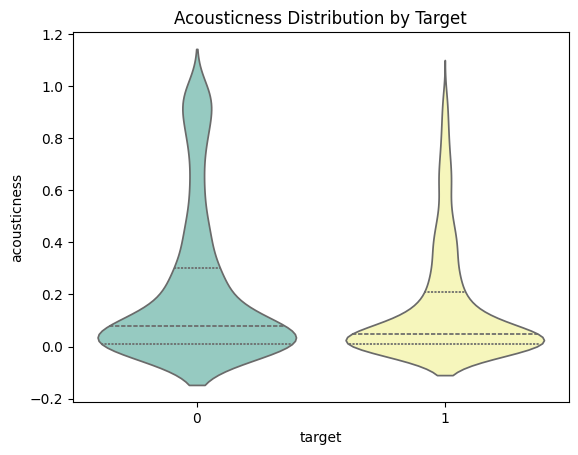

C:\Users\91800\AppData\Local\Temp\ipykernel_14392\3918839969.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='target', y=col, data=df, palette='Set3', inner='quartile')


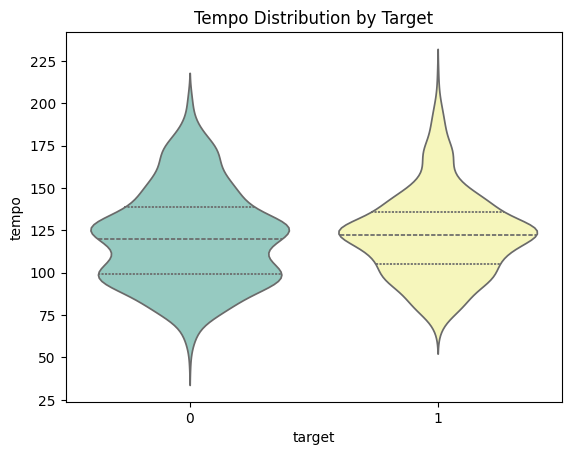

In [56]:
for col in ['energy','danceability','valence','acousticness','tempo']:
    sns.violinplot(x='target', y=col, data=df, palette='Set3', inner='quartile')
    plt.title(f"{col.capitalize()} Distribution by Target")
    plt.show()


Skewness of numerical features:
 duration_ms         2.497153
speechiness         2.307863
instrumentalness    1.951303
liveness            1.951251
acousticness        1.657159
tempo               0.438732
valence             0.078331
key                -0.009353
target             -0.022808
danceability       -0.419297
mode               -0.460958
energy             -0.912331
loudness           -2.224900
time_signature     -2.232859
dtype: float64

Kurtosis of numerical features:
 time_signature      19.657150
duration_ms         11.869965
loudness             7.885909
speechiness          6.241720
liveness             4.082525
instrumentalness     2.252605
acousticness         1.738323
energy               0.568227
tempo                0.038524
danceability        -0.209971
valence             -1.011058
key                 -1.338484
mode                -1.787518
target              -1.999480
dtype: float64


C:\Users\91800\AppData\Local\Temp\ipykernel_14392\2888628994.py:23: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=skew_data.index, y=skew_data.values, palette='coolwarm')


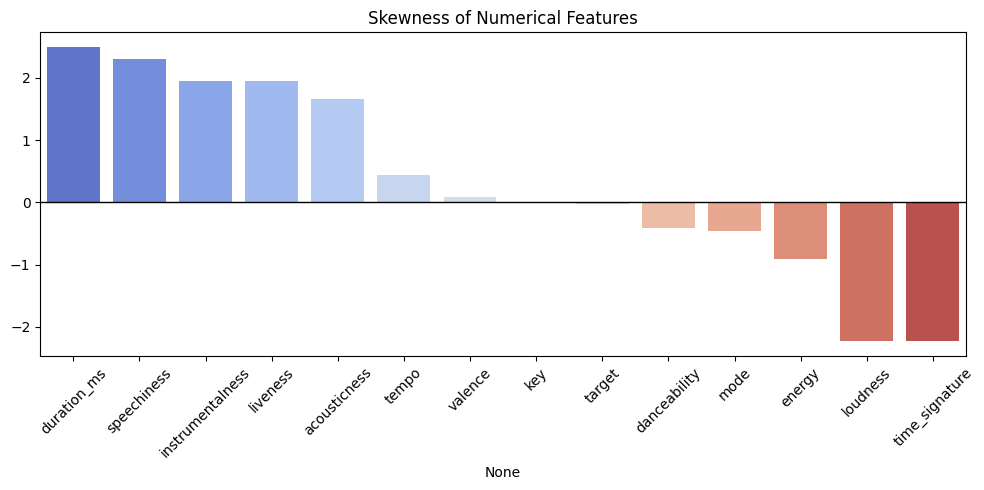

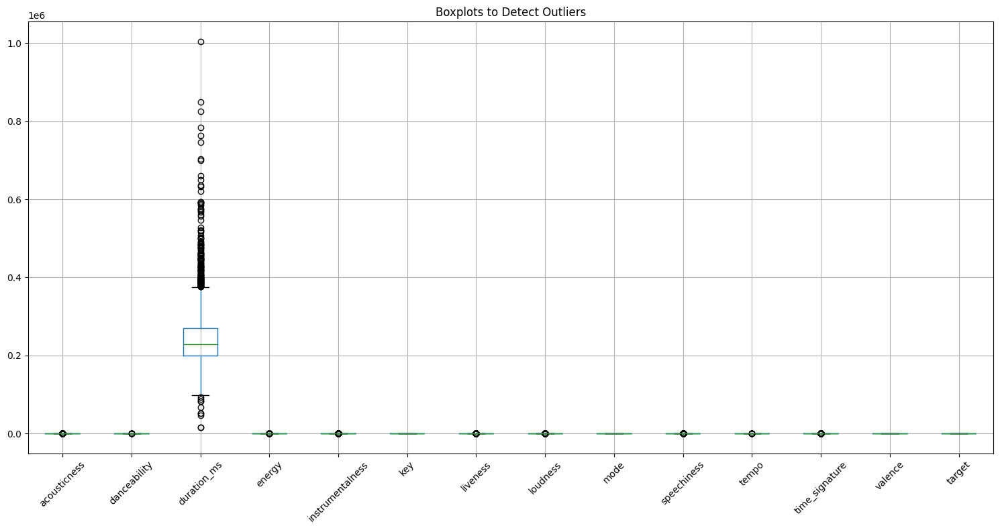

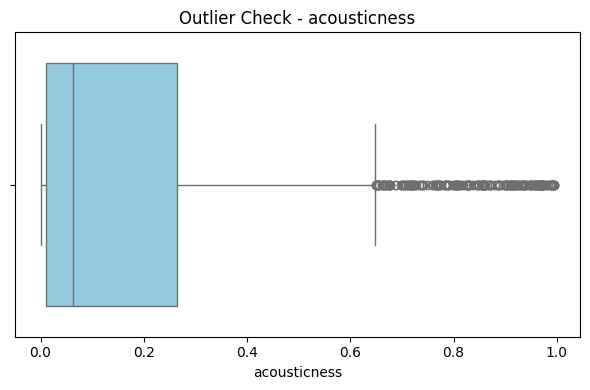

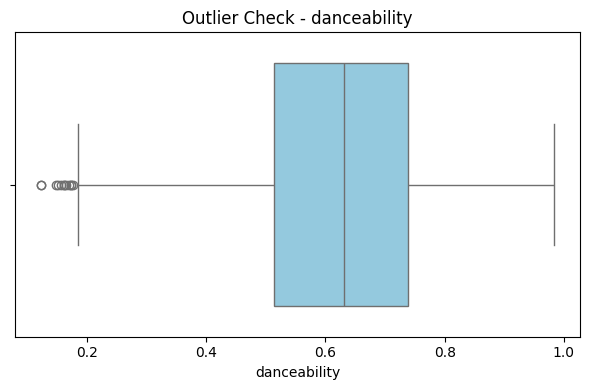

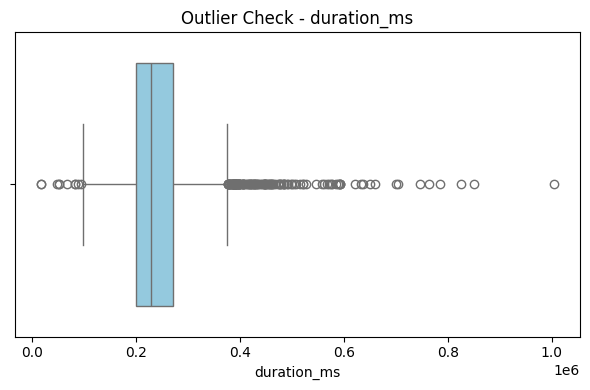

...

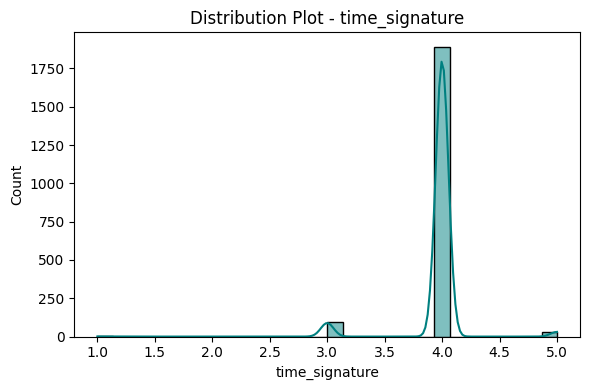

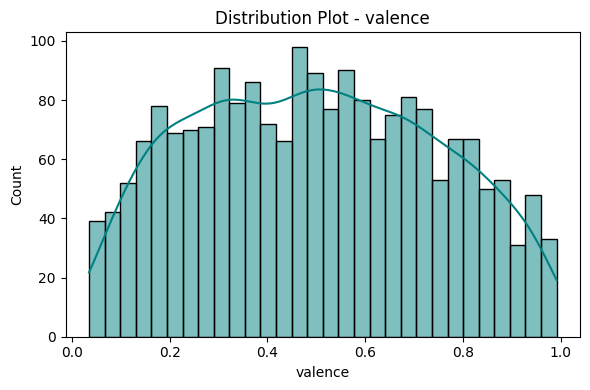

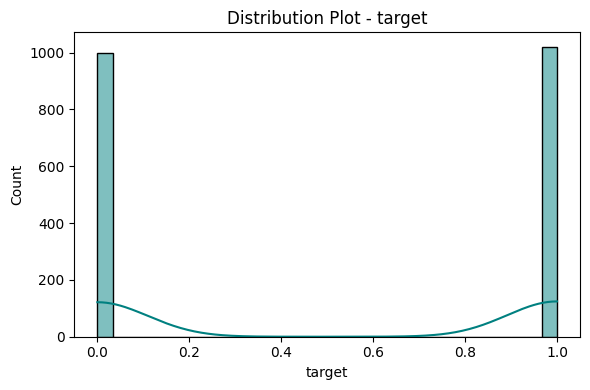

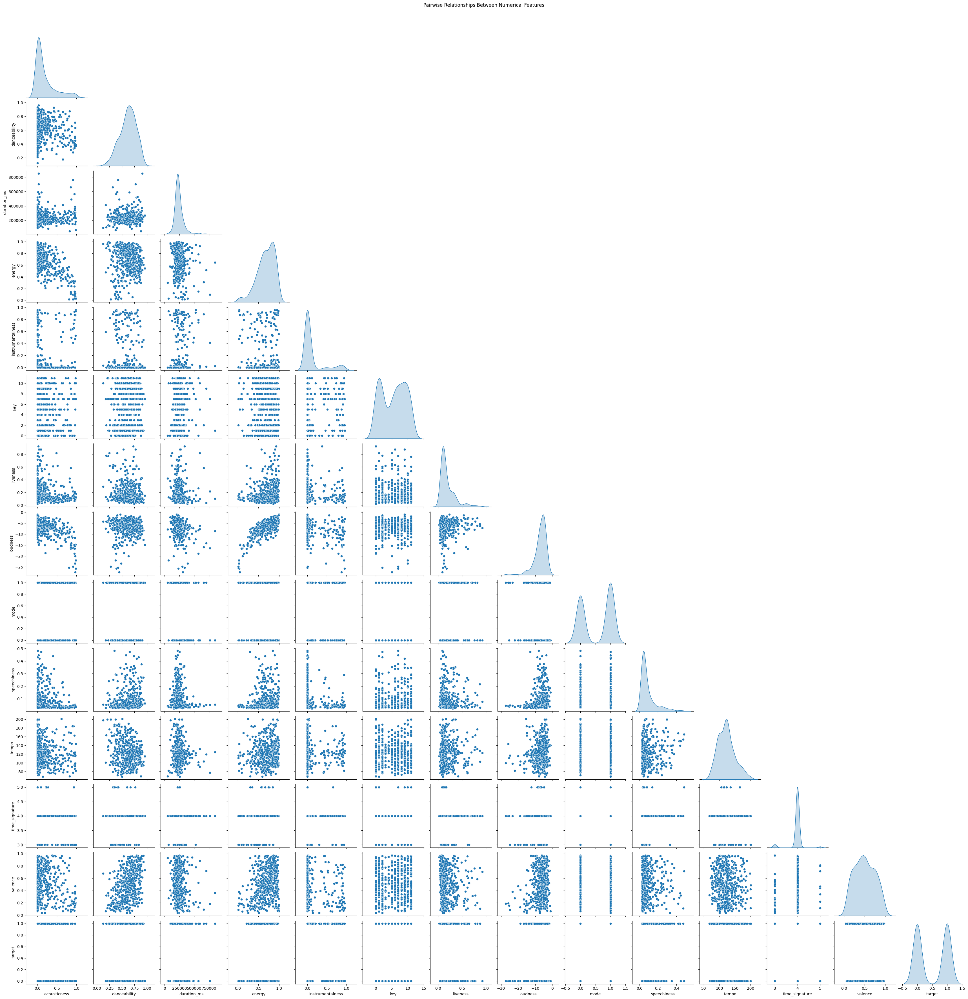

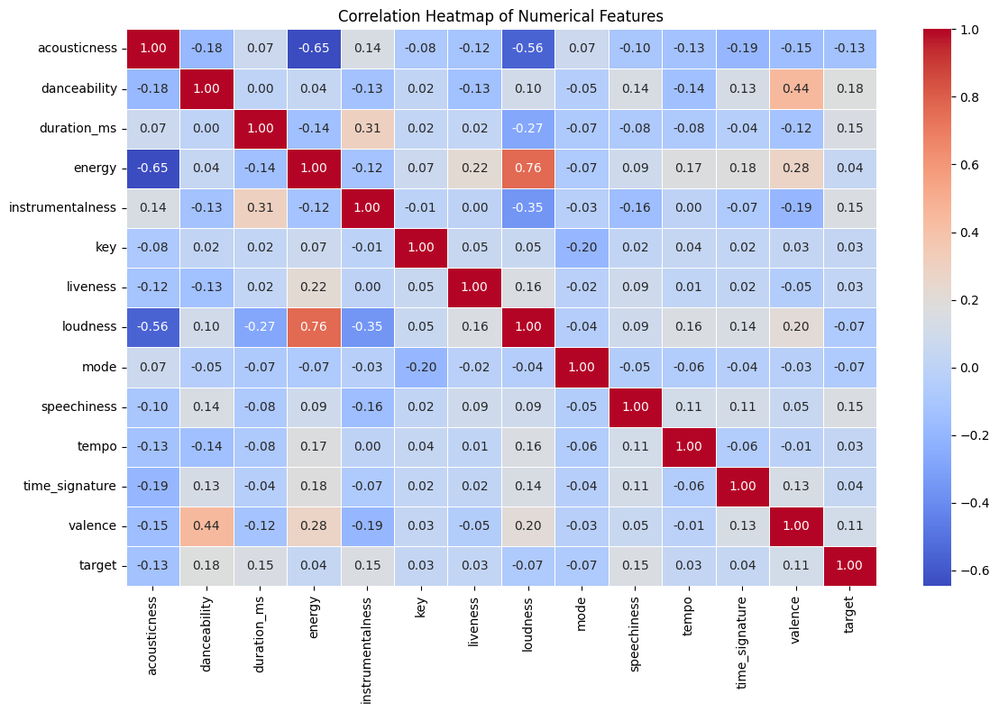

In [57]:
# ==============================
# 📊 Data Distribution, Skewness & Outlier Analysis
# ==============================

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import skew, kurtosis

# Select only numerical columns
num_cols = df.select_dtypes(include=['int64', 'float64']).columns

# ---- 1️⃣ Skewness and Kurtosis ----
skew_data = df[num_cols].apply(skew).sort_values(ascending=False)
kurt_data = df[num_cols].apply(kurtosis).sort_values(ascending=False)

print("Skewness of numerical features:\n", skew_data)
print("\nKurtosis of numerical features:\n", kurt_data)

# Plot skewness
plt.figure(figsize=(10,5))
sns.barplot(x=skew_data.index, y=skew_data.values, palette='coolwarm')
plt.title("Skewness of Numerical Features")
plt.xticks(rotation=45)
plt.axhline(0, color='black', linewidth=1)
plt.tight_layout()
plt.show()

# ---- 2️⃣ Boxplots for Outlier Detection ----
plt.figure(figsize=(15, 8))
df[num_cols].boxplot()
plt.title("Boxplots to Detect Outliers")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Individual boxplots (if the above is too congested)
for col in num_cols:
    plt.figure(figsize=(6,4))
    sns.boxplot(x=df[col], color='skyblue')
    plt.title(f"Outlier Check - {col}")
    plt.tight_layout()
    plt.show()

# ---- 3️⃣ Distribution Plots ----
for col in num_cols:
    plt.figure(figsize=(6,4))
    sns.histplot(df[col], kde=True, color='teal', bins=30)
    plt.title(f"Distribution Plot - {col}")
    plt.tight_layout()
    plt.show()

# ---- 4️⃣ Pairplot for Relationships ----
sns.pairplot(df[num_cols].sample(min(500, len(df))), diag_kind='kde', corner=True)
plt.suptitle("Pairwise Relationships Between Numerical Features", y=1.02)
plt.show()

# ---- 5️⃣ Correlation Heatmap ----
plt.figure(figsize=(12,8))
sns.heatmap(df[num_cols].corr(), annot=True, fmt=".2f", cmap='coolwarm', linewidths=0.5)
plt.title("Correlation Heatmap of Numerical Features")
plt.tight_layout()
plt.show()


# Data transformation and Outlier Treament

Skewness before transformation:
 acousticness        1.657159
danceability       -0.419297
duration_ms         2.497153
energy             -0.912331
instrumentalness    1.951303
key                -0.009353
liveness            1.951251
loudness           -2.224900
mode               -0.460958
speechiness         2.307863
tempo               0.438732
time_signature     -2.232859
valence             0.078331
target             -0.022808
dtype: float64

Highly skewed features: ['acousticness', 'duration_ms', 'energy', 'instrumentalness', 'liveness', 'loudness', 'speechiness', 'time_signature']

Skewness after transformation:
 acousticness        0.513274
duration_ms         0.062106
energy             -0.144933
instrumentalness    1.252105
liveness            0.327526
loudness            0.024309
speechiness         0.556905
time_signature      0.828660
dtype: float64

✅ Outliers capped using IQR method.

✅ Data standardized with StandardScaler.

Final skewness after all corrections:
 aco

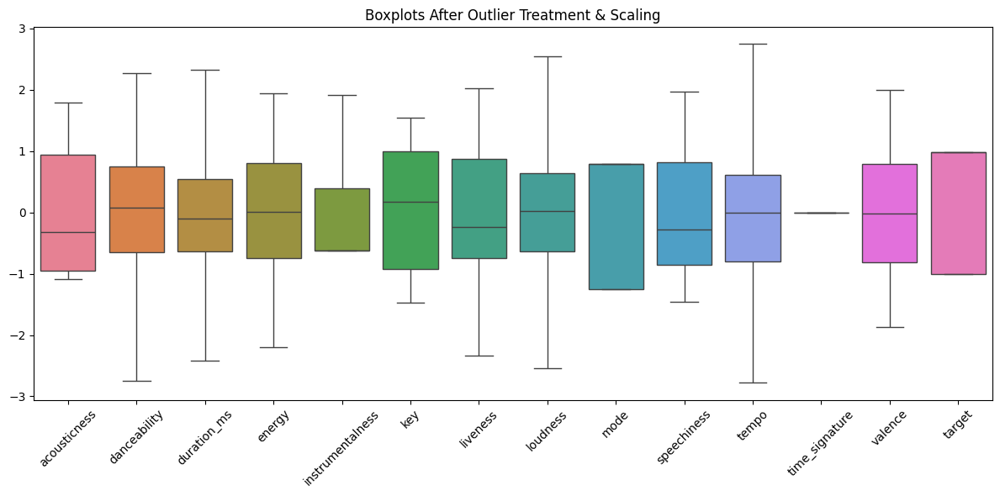

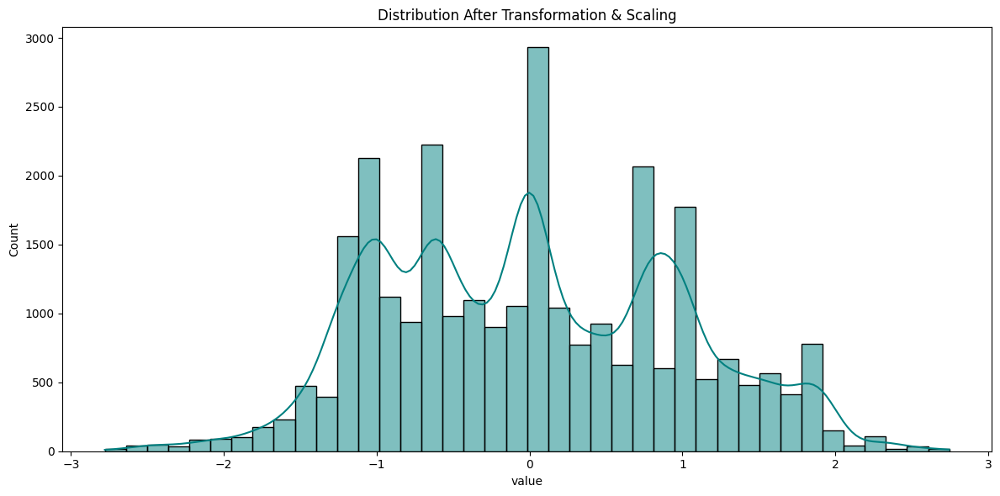

In [58]:
# ==============================================
# 🧮 Data Transformation & Outlier Treatment
# ==============================================

import pandas as pd
import numpy as np
from scipy.stats import skew
from sklearn.preprocessing import PowerTransformer, StandardScaler

# Select only numeric columns
num_cols = df.select_dtypes(include=['int64', 'float64']).columns

# ---- 1️⃣ Handle Skewness ----
# Calculate skewness
skew_values = df[num_cols].apply(lambda x: skew(x.dropna()))
print("Skewness before transformation:\n", skew_values)

# Identify highly skewed features
high_skew = skew_values[abs(skew_values) > 0.75].index
print("\nHighly skewed features:", list(high_skew))

# Apply PowerTransformer (auto Box-Cox or Yeo-Johnson based on data)
pt = PowerTransformer(method='yeo-johnson')  # works for both +ve/-ve
df[high_skew] = pt.fit_transform(df[high_skew])

# Recheck skewness after fix
new_skew = df[high_skew].apply(lambda x: skew(x.dropna()))
print("\nSkewness after transformation:\n", new_skew)

# ---- 2️⃣ Handle Outliers (IQR Method) ----
for col in num_cols:
    Q1 = df[col].quantile(0.25)
    Q3 = df[col].quantile(0.75)
    IQR = Q3 - Q1
    lower = Q1 - 1.5 * IQR
    upper = Q3 + 1.5 * IQR
    
    # Capping outliers instead of removing
    df[col] = np.where(df[col] < lower, lower, df[col])
    df[col] = np.where(df[col] > upper, upper, df[col])

print("\n✅ Outliers capped using IQR method.")

# ---- 3️⃣ Normalize / Scale Data ----
scaler = StandardScaler()
df[num_cols] = scaler.fit_transform(df[num_cols])

print("\n✅ Data standardized with StandardScaler.")

# ---- 4️⃣ Verify again ----
final_skew = df[num_cols].apply(lambda x: skew(x.dropna()))
print("\nFinal skewness after all corrections:\n", final_skew)

# ---- 5️⃣ Optional Visual Checks ----
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(12, 6))
sns.boxplot(data=df[num_cols])
plt.title("Boxplots After Outlier Treatment & Scaling")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

plt.figure(figsize=(12, 6))
sns.histplot(df[num_cols].melt()['value'], kde=True, bins=40, color='teal')
plt.title("Distribution After Transformation & Scaling")
plt.tight_layout()
plt.show()


# Now for the model training and selection 

In [84]:
df['target'] = df['target'].apply(lambda x: 1 if x > 0 else -1)

In [86]:
df

,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,time_signature,valence,target,song_title,artist
0,-1.033408,1.449132,-0.511512,-1.216448,1.256453,-0.917918,0.335645,-0.741728,0.795738,1.535189,1.072086,0.0,-0.848258,1,Mask Off,Future
1,0.858647,0.758547,1.274268,-1.433953,0.835022,-1.184974,0.022109,-1.098020,0.795738,0.578797,1.387655,0.0,0.392313,1,Redbone,Childish Gambino
2,-0.468844,1.488969,-0.932408,-1.283771,-0.681328,-0.917918,0.275665,-0.290748,0.795738,1.484458,-1.960143,0.0,-1.332147,1,Xanny Family,Future
3,1.335772,-0.818175,-0.621671,-1.489006,1.389225,-0.107261,-0.715361,-1.879845,0.795738,-1.761629,-1.417549,0.0,-1.087037,1,Master Of None,Beach House
4,0.795170,0.295142,1.898857,-0.763616,1.389225,-0.107261,1.465277,-1.334204,-1.256696,0.383620,1.807776,0.0,1.607130,1,Parallel Lines,Junior Boys
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2012,-1.301641,-0.308757,0.650765,1.468543,0.317503,-1.184974,-0.085624,1.332688,0.795738,1.509219,-1.963436,0.0,-1.168519,-1,Like A Bitch - Kill The Noise Remix,Kill The Noise
2013,0.265227,1.944708,-1.017232,1.143585,0.002622,-1.184974,-1.714432,1.956535,0.795738,1.108862,-0.376218,0.0,1.467738,-1,Candy,Dillon Francis
2014,-1.078763,0.021096,-0.457747,1.493849,0.583675,-1.450814,0.723044,2.128241,0.795738,0.927175,1.072728,0.0,-0.081189,-1,Habit - Dack Janiels & Wenzday Remix,Rain Man
2015,-1.283580,-0.467236,-0.934952,2.000268,1.389225,-1.184974,-0.733964,1.896282,0.795738,1.120864,1.070447,0.0,0.530122,-1,First Contact,Twin Moons


C:\Users\91800\AppData\Local\Temp\ipykernel_14392\638899730.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=skew_before.values, y=skew_before.index, palette='coolwarm')


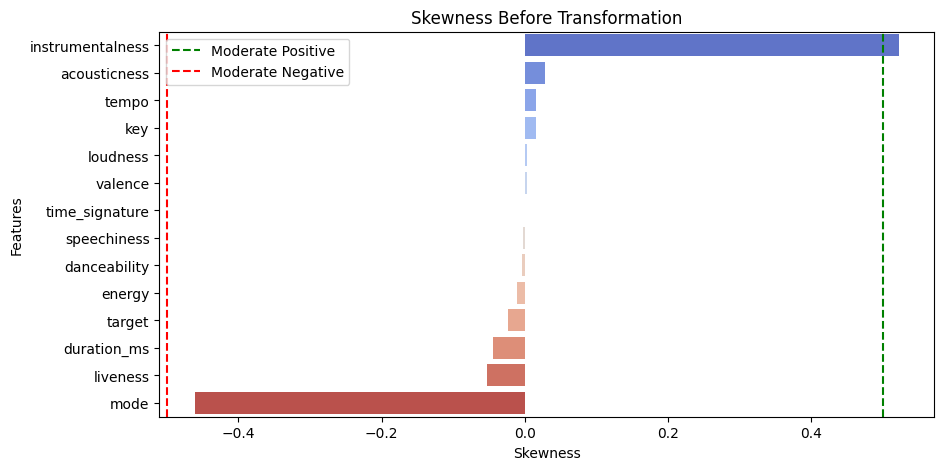

C:\Users\91800\AppData\Local\Temp\ipykernel_14392\638899730.py:25: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=skew_after.values, y=skew_after.index, palette='crest')


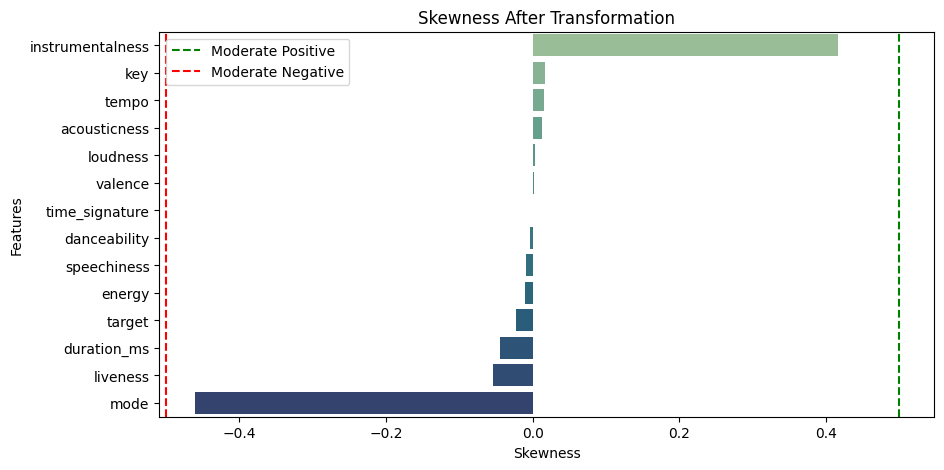


Skewness Reduction Summary:
                    Before     After        Change
instrumentalness  0.522985  0.417094  1.058909e-01
acousticness      0.029036  0.012803  1.623314e-02
valence           0.002518  0.002328  1.892013e-04
energy           -0.010831 -0.010705  1.261122e-04
danceability     -0.003872 -0.003838  3.421320e-05
duration_ms      -0.043930 -0.043911  1.896140e-05
tempo             0.016156  0.016154  1.969896e-06
loudness          0.003784  0.003782  1.139395e-06
mode             -0.461301 -0.461301  2.775558e-16
time_signature    0.000000  0.000000  0.000000e+00
target           -0.022825 -0.022825 -1.387779e-17
key               0.016021  0.016319 -2.977830e-04
liveness         -0.053175 -0.053713 -5.384509e-04
speechiness      -0.003054 -0.008998 -5.943706e-03


In [87]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import PowerTransformer


num_cols = df.select_dtypes(include=['float64','int64']).columns

skew_before = df[num_cols].skew().sort_values(ascending=False)
plt.figure(figsize=(10,5))
sns.barplot(x=skew_before.values, y=skew_before.index, palette='coolwarm')
plt.title("Skewness Before Transformation")
plt.xlabel("Skewness")
plt.ylabel("Features")
plt.axvline(0.5, color='green', linestyle='--', label='Moderate Positive')
plt.axvline(-0.5, color='red', linestyle='--', label='Moderate Negative')
plt.legend()
plt.show()

pt = PowerTransformer(method='yeo-johnson')
df[num_cols] = pt.fit_transform(df[num_cols])


skew_after = df[num_cols].skew().sort_values(ascending=False)
plt.figure(figsize=(10,5))
sns.barplot(x=skew_after.values, y=skew_after.index, palette='crest')
plt.title("Skewness After Transformation")
plt.xlabel("Skewness")
plt.ylabel("Features")
plt.axvline(0.5, color='green', linestyle='--', label='Moderate Positive')
plt.axvline(-0.5, color='red', linestyle='--', label='Moderate Negative')
plt.legend()
plt.show()


compare_skew = pd.DataFrame({
    'Before': skew_before,
    'After': skew_after,
    'Change': (abs(skew_before) - abs(skew_after))
}).sort_values(by='Change', ascending=False)

print("\nSkewness Reduction Summary:")
print(compare_skew)


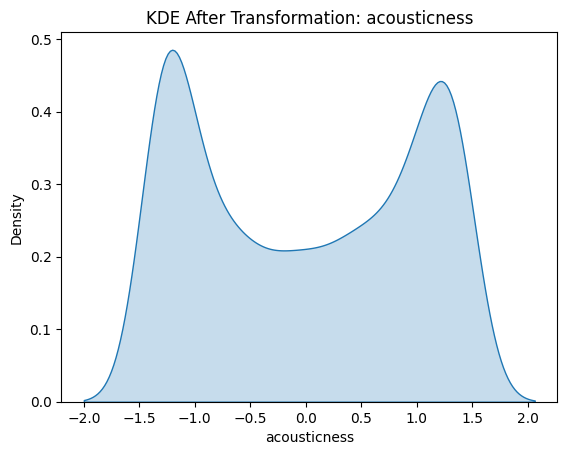

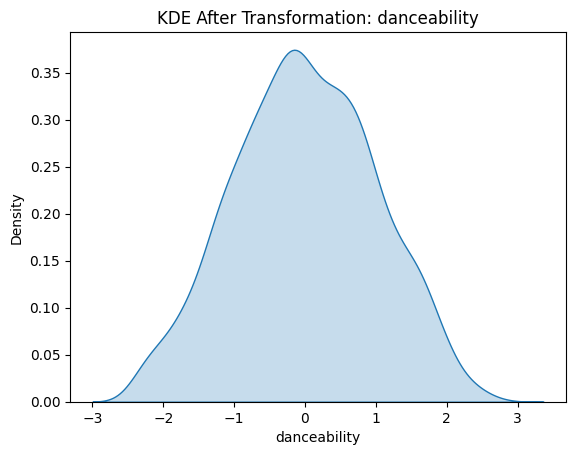

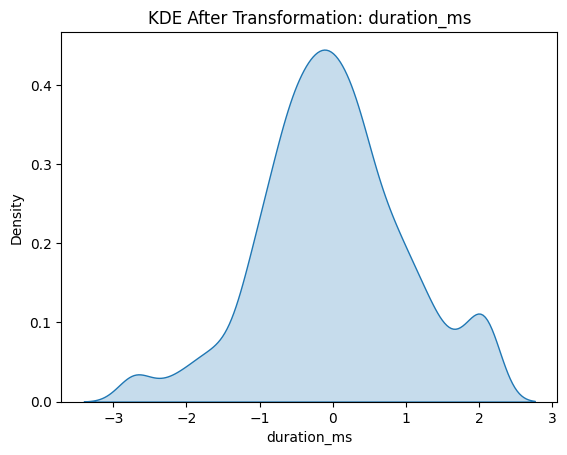

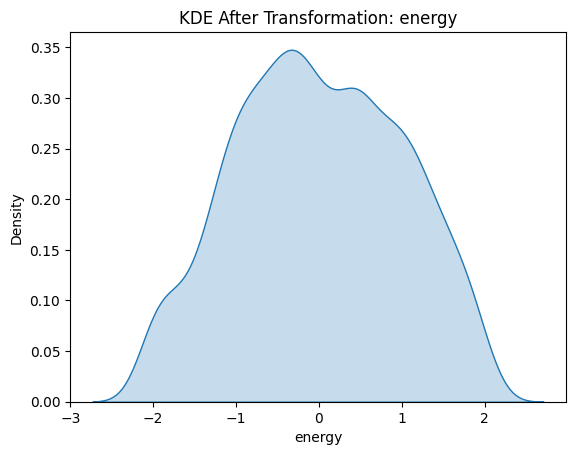

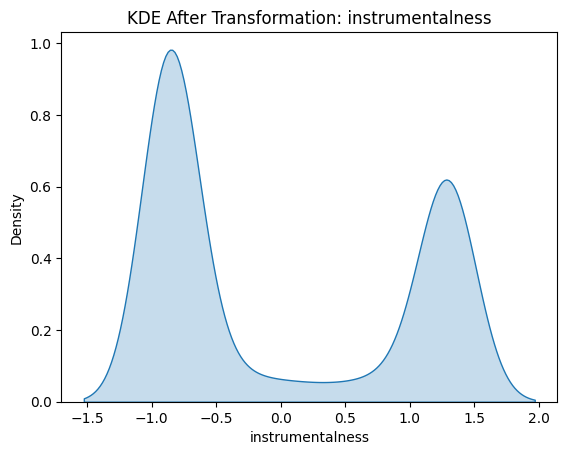

...

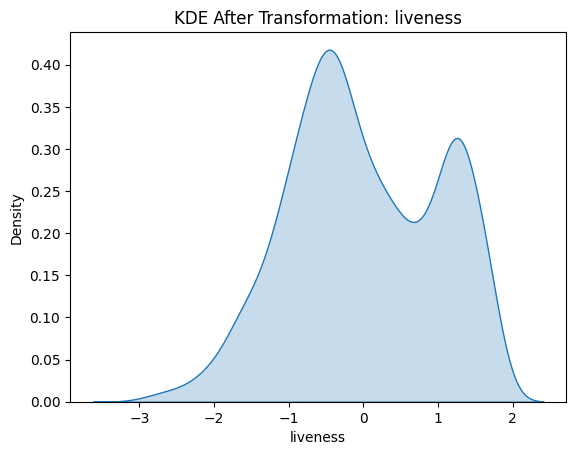

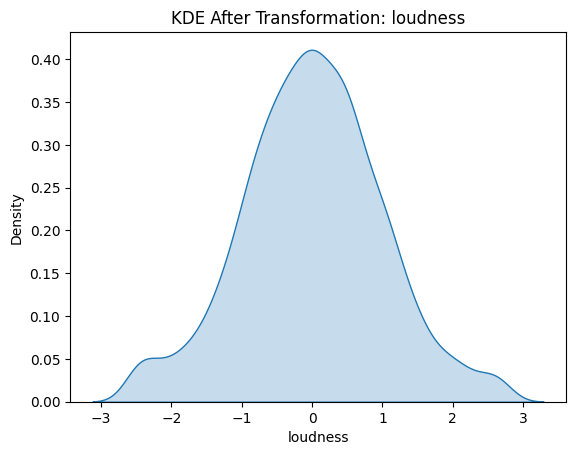

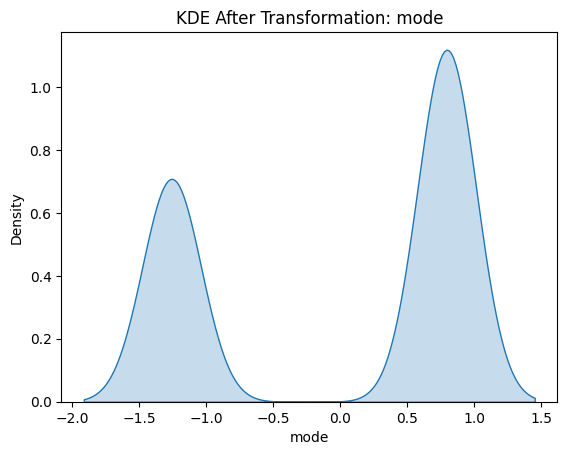

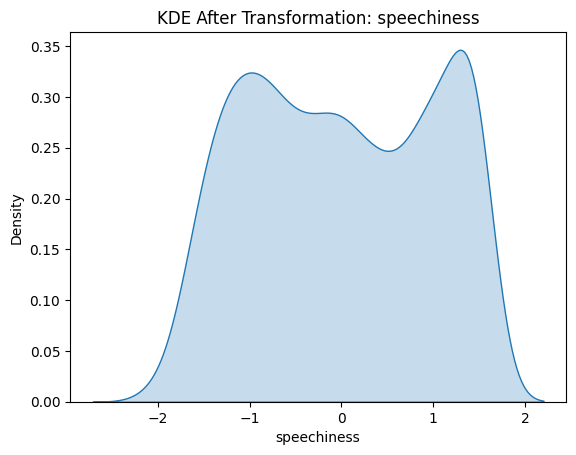

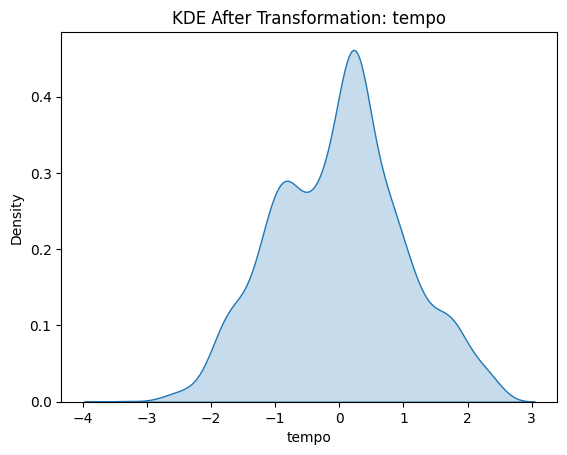

C:\Users\91800\AppData\Local\Temp\ipykernel_14392\3204539050.py:5: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(df[col], fill=True)


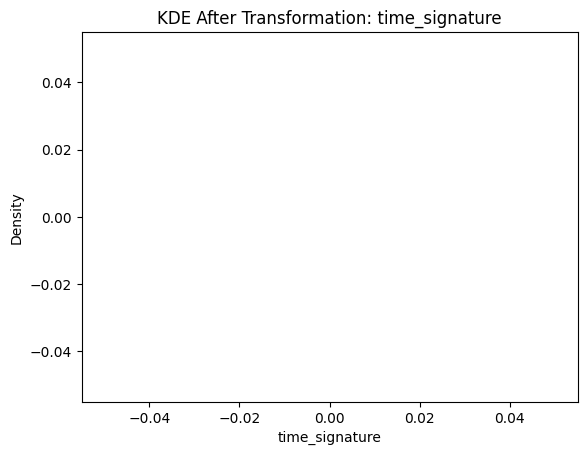

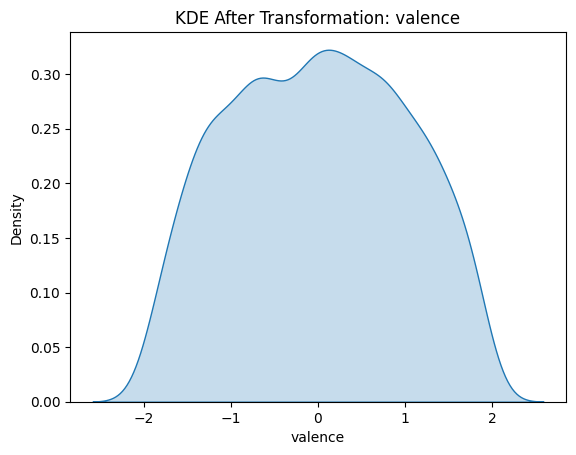

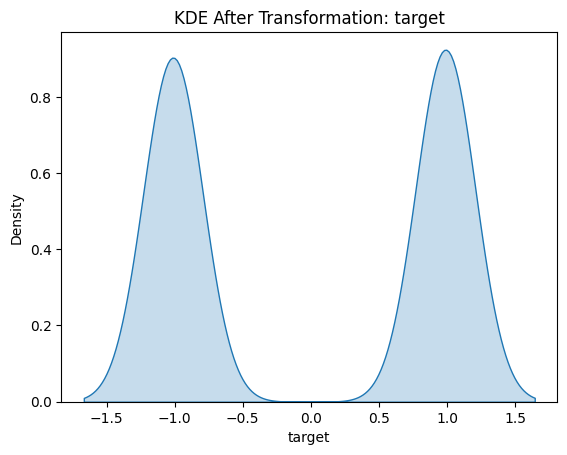

In [88]:
import seaborn as sns
import matplotlib.pyplot as plt

for col in num_cols:
    sns.kdeplot(df[col], fill=True)
    plt.title(f"KDE After Transformation: {col}")
    plt.show()


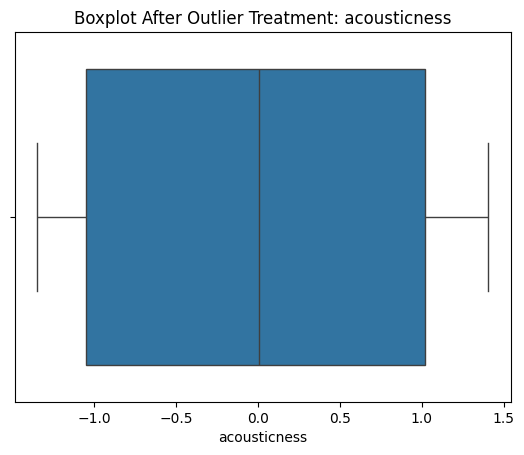

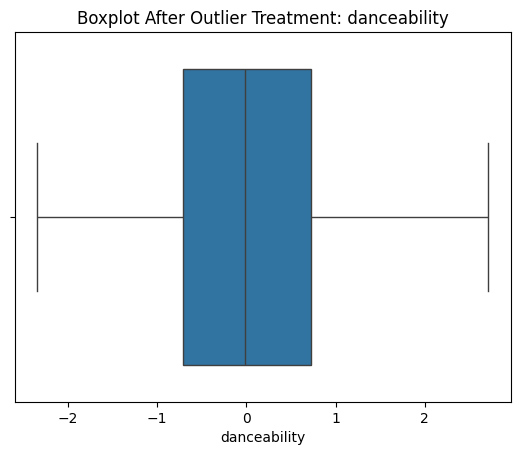

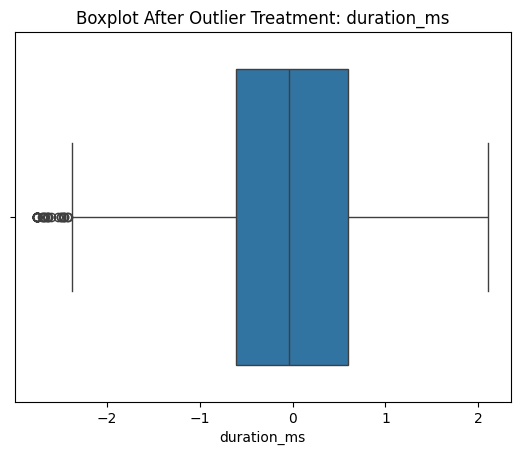

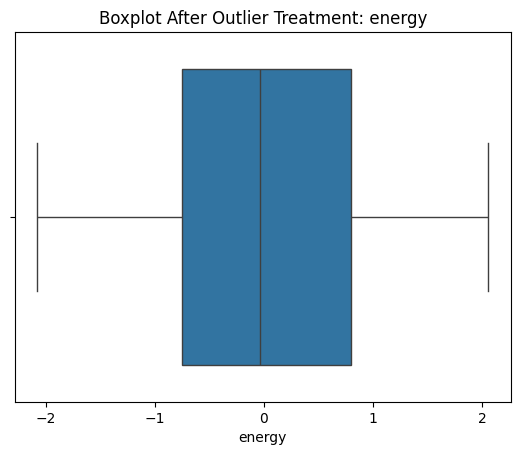

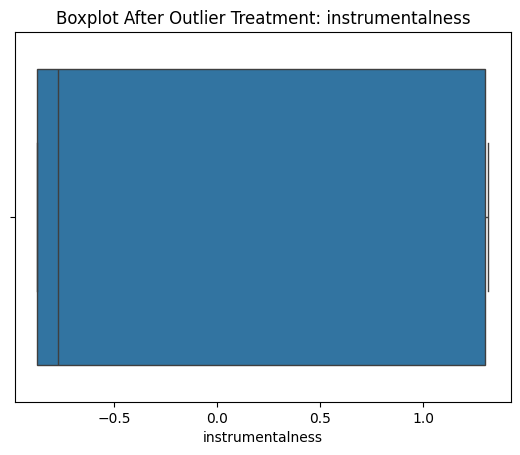

...

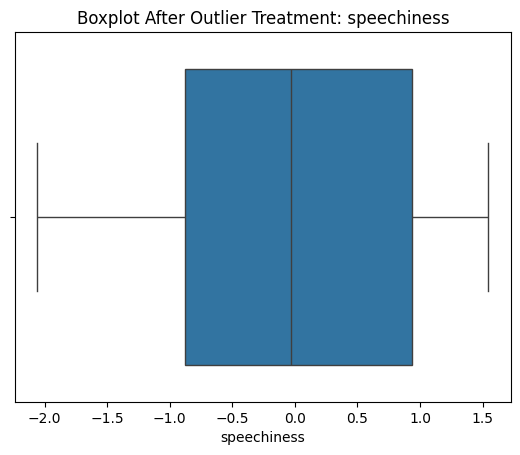

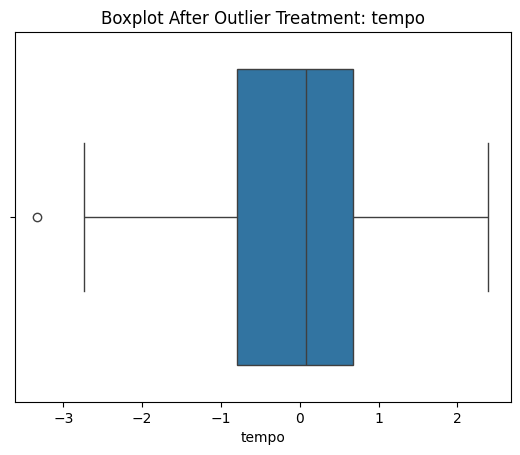

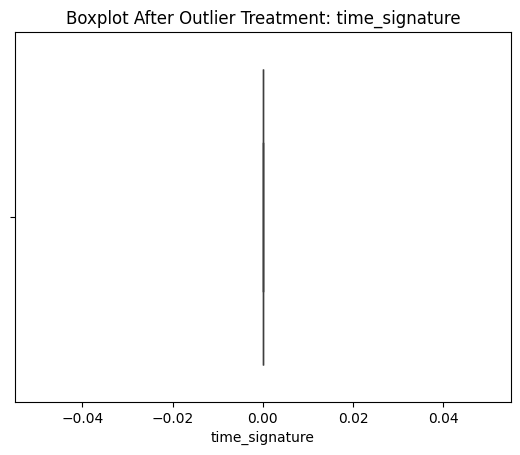

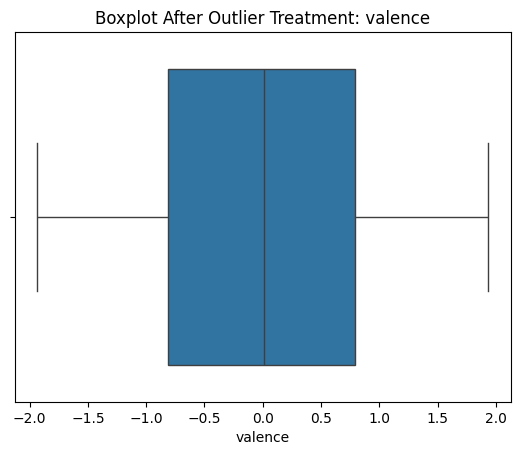

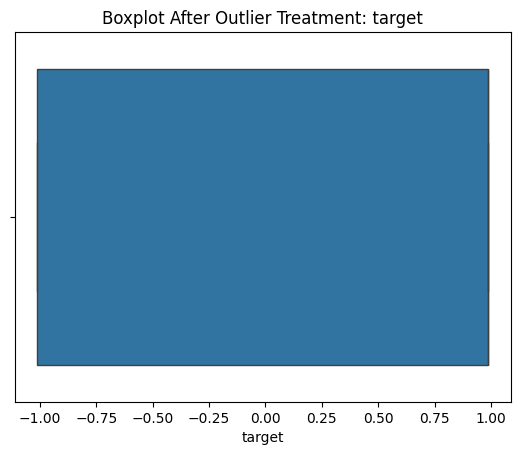

In [89]:
for col in num_cols:
    sns.boxplot(x=df[col])
    plt.title(f"Boxplot After Outlier Treatment: {col}")
    plt.show()


In [90]:
for col in num_cols:
    Q1 = df[col].quantile(0.25)
    Q3 = df[col].quantile(0.75)
    IQR = Q3 - Q1
    lower = Q1 - 1.5 * IQR
    upper = Q3 + 1.5 * IQR
    outliers = df[(df[col] < lower) | (df[col] > upper)]
    print(f"{col}: {len(outliers)} outliers remaining")



acousticness: 0 outliers remaining
danceability: 0 outliers remaining
duration_ms: 40 outliers remaining
energy: 0 outliers remaining
instrumentalness: 0 outliers remaining
key: 0 outliers remaining
liveness: 0 outliers remaining
loudness: 24 outliers remaining
mode: 0 outliers remaining
speechiness: 0 outliers remaining
tempo: 1 outliers remaining
time_signature: 0 outliers remaining
valence: 0 outliers remaining
target: 0 outliers remaining


# Now training the Model and spliting the data for the models

In [96]:
df['target'] = df['target'].apply(lambda x: 1 if x > 0 else -1)


In [102]:
print(df.head())

   acousticness  danceability  duration_ms    energy  instrumentalness  \
0     -1.034897      1.449141    -0.511514 -1.216428          1.256814   
1      0.861585      0.758544     1.274270 -1.433913          1.043194   
2     -0.459404      1.488979    -0.932408 -1.283745         -0.588304   
3      1.326858     -0.818177    -0.621673 -1.488961          1.315514   
4      0.799396      0.295135     1.898865 -0.763630          1.315514   

        key  liveness  loudness      mode  speechiness     tempo  \
0 -0.917933  0.335784 -0.741728  0.795738     1.531591  1.072086   
1 -1.184907  0.022272 -1.098020  0.795738     0.580586  1.387655   
2 -0.917933  0.275812 -0.290748  0.795738     1.481229 -1.960144   
3 -0.107416 -0.715291 -1.879845  0.795738    -1.767001 -1.417549   
4 -0.107416  1.465092 -1.334204 -1.256696     0.386016  1.807776   

   time_signature   valence  target      song_title            artist  
0             0.0 -0.848244       1        Mask Off            Future  
1 

In [103]:
new_df = df.drop(['song_title', 'artist'], axis=1)

target
 1    1020
-1     997
Name: count, dtype: int64


<Axes: xlabel='target', ylabel='count'>

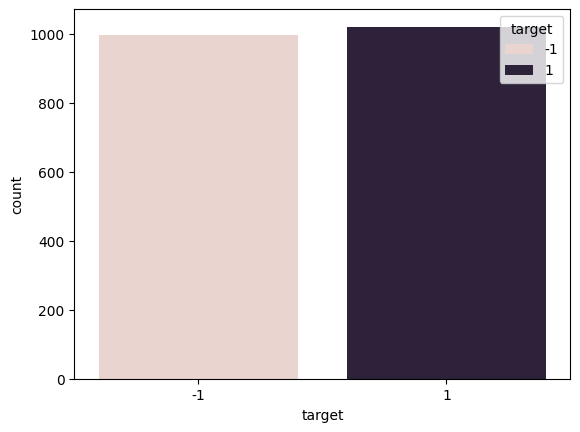

In [108]:
print(df['target'].value_counts())
sns.countplot(x=df['target'],hue=df['target'])

In [116]:
from sklearn.model_selection import train_test_split

X = df.drop(['target','song_title','artist'], axis=1)
y = df['target']


In [125]:
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.2,random_state=42)

In [126]:
X_train.columns

Index(['acousticness', 'danceability', 'duration_ms', 'energy',
       'instrumentalness', 'key', 'liveness', 'loudness', 'mode',
       'speechiness', 'tempo', 'time_signature', 'valence', 'artist_encoded',
       'song_title_encoded'],
      dtype='object')

In [124]:
from sklearn.preprocessing import LabelEncoder

df['artist_encoded'] = LabelEncoder().fit_transform(df['artist'])
df['song_title_encoded'] = LabelEncoder().fit_transform(df['song_title'])

X = df.drop(columns=['target', 'song_title', 'artist'])
y = df['target']


c:\Users\91800\Desktop\Lyrics_ML\venv\lib\site-packages\xgboost\core.py:158: UserWarning: [13:21:32] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-08cbc0333d8d4aae1-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[LightGBM] [Info] Number of positive: 816, number of negative: 797
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000251 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3075
[LightGBM] [Info] Number of data points in the train set: 1613, number of used features: 14
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.505890 -> initscore=0.023560
[LightGBM] [Info] Start training from score 0.023560


c:\Users\91800\Desktop\Lyrics_ML\venv\lib\site-packages\xgboost\core.py:158: UserWarning: [13:21:33] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-08cbc0333d8d4aae1-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[LightGBM] [Info] Number of positive: 816, number of negative: 797
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000216 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3075
[LightGBM] [Info] Number of data points in the train set: 1613, number of used features: 14
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.505890 -> initscore=0.023560
[LightGBM] [Info] Start training from score 0.023560


c:\Users\91800\Desktop\Lyrics_ML\venv\lib\site-packages\xgboost\core.py:158: UserWarning: [13:21:34] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-08cbc0333d8d4aae1-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[LightGBM] [Info] Number of positive: 816, number of negative: 797
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000203 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3075
[LightGBM] [Info] Number of data points in the train set: 1613, number of used features: 14
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.505890 -> initscore=0.023560
[LightGBM] [Info] Start training from score 0.023560


c:\Users\91800\Desktop\Lyrics_ML\venv\lib\site-packages\xgboost\core.py:158: UserWarning: [13:21:38] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-08cbc0333d8d4aae1-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
c:\Users\91800\Desktop\Lyrics_ML\venv\lib\site-packages\xgboost\core.py:158: UserWarning: [13:21:38] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-08cbc0333d8d4aae1-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
c:\Users\91800\Desktop\Lyrics_ML\venv\lib\site-packages\xgboost\core.py:158: UserWarning: [13:21:38] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-08cbc0333d8d4aae1-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
c:\U

[LightGBM] [Info] Number of positive: 652, number of negative: 638
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000187 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3074
[LightGBM] [Info] Number of data points in the train set: 1290, number of used features: 14
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.505426 -> initscore=0.021706
[LightGBM] [Info] Start training from score 0.021706
[LightGBM] [Info] Number of positive: 653, number of negative: 637
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000166 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3076
[LightGBM] [Info] Number of data points in the train set: 1290, number of used features: 14
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.506202 -> initscore=0.024807
[LightGBM] [Info] Start training from score 0.024807
[LightGBM] [Info] Number o

c:\Users\91800\Desktop\Lyrics_ML\venv\lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 127937 (\N{CHEQUERED FLAG}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


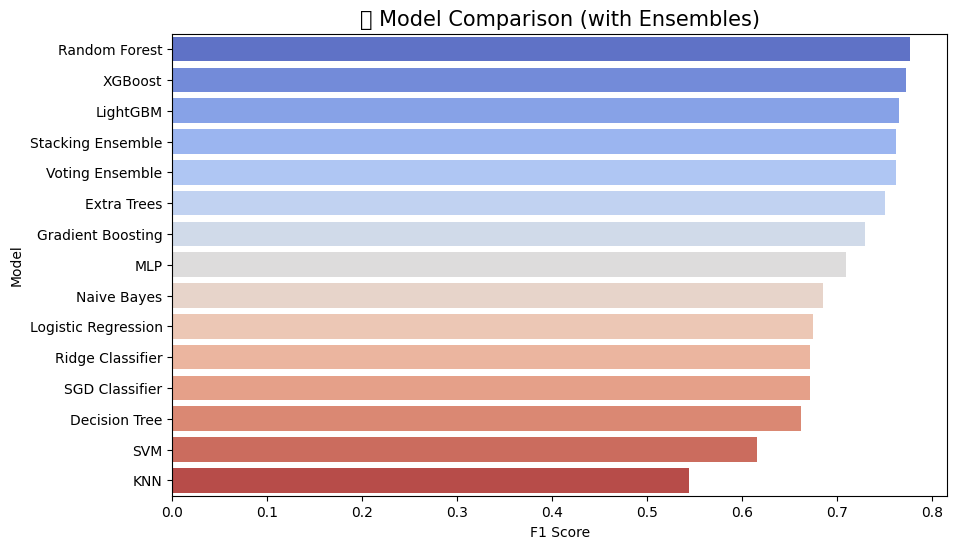

🏁 Model Comparison Results (Updated):
                  Model  Accuracy  Precision    Recall        F1   ROC_AUC
0         Random Forest  0.777228   0.785000  0.769608  0.777228  0.850441
1               XGBoost  0.772277   0.780000  0.764706  0.772277  0.833370
2              LightGBM  0.764851   0.771144  0.759804  0.765432  0.831581
3     Stacking Ensemble  0.762376   0.770000  0.754902  0.762376  0.848444
4       Voting Ensemble  0.762376   0.770000  0.754902  0.762376  0.845772
5           Extra Trees  0.754950   0.772021  0.730392  0.750630  0.845662
6     Gradient Boosting  0.737624   0.760638  0.700980  0.729592  0.836826
7                   MLP  0.638614   0.597315  0.872549  0.709163  0.734424
8           Naive Bayes  0.693069   0.710526  0.661765  0.685279  0.755797
9   Logistic Regression  0.665842   0.663507  0.686275  0.674699  0.732390
10     Ridge Classifier  0.663366   0.661905  0.681373  0.671498  0.663186
11       SGD Classifier  0.504950   0.504950  1.000000  0.6710

In [134]:
# -------------------------------
# ⚡ Import Libraries
# -------------------------------


from sklearn.ensemble import (
    RandomForestClassifier, ExtraTreesClassifier, GradientBoostingClassifier,
    VotingClassifier, StackingClassifier
)
from sklearn.linear_model import LogisticRegression, RidgeClassifier, SGDClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.svm import SVC
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier

from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score
from sklearn.model_selection import train_test_split
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

# -------------------------------
# ⚙️ Split Data
# -------------------------------
X  = df.drop('target', axis=1)
y = df['target'].replace(-1, 0)

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)

# 🧹 Drop text columns properly
X_train = X_train.drop(['artist', 'song_title'], axis=1)
X_test = X_test.drop(['artist', 'song_title'], axis=1)
# -------------------------------
# ⚔️ Define Models
# -------------------------------
base_models = {
    "Logistic Regression": LogisticRegression(max_iter=2000),
    "Ridge Classifier": RidgeClassifier(),
    "SGD Classifier": SGDClassifier(max_iter=1000, tol=1e-3),
    "Decision Tree": DecisionTreeClassifier(),
    "Random Forest": RandomForestClassifier(n_estimators=200, random_state=42),
    "Extra Trees": ExtraTreesClassifier(n_estimators=200, random_state=42),
    "Gradient Boosting": GradientBoostingClassifier(),
    "XGBoost": XGBClassifier(use_label_encoder=False, eval_metric='logloss', random_state=42),
    "LightGBM": LGBMClassifier(random_state=42),
    "SVM": SVC(probability=True),
    "KNN": KNeighborsClassifier(),
    "Naive Bayes": GaussianNB(),
    "MLP": MLPClassifier(max_iter=1000, random_state=42)
}

# -------------------------------
# 🧩 Ensemble Models
# -------------------------------
voting_clf = VotingClassifier(
    estimators=[
        ('rf', base_models['Random Forest']),
        ('xgb', base_models['XGBoost']),
        ('lgbm', base_models['LightGBM'])
    ],
    voting='soft'
)

stacking_clf = StackingClassifier(
    estimators=[
        ('rf', base_models['Random Forest']),
        ('xgb', base_models['XGBoost']),
        ('lgbm', base_models['LightGBM']),
        ('gb', base_models['Gradient Boosting'])
    ],
    final_estimator=LogisticRegression(max_iter=2000)
)

base_models["Voting Ensemble"] = voting_clf
base_models["Stacking Ensemble"] = stacking_clf

# -------------------------------
# 📊 Evaluate Models
# -------------------------------
results = []

for name, model in base_models.items():
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    y_proba = model.predict_proba(X_test)[:, 1] if hasattr(model, "predict_proba") else y_pred
    
    results.append({
        "Model": name,
        "Accuracy": accuracy_score(y_test, y_pred),
        "Precision": precision_score(y_test, y_pred),
        "Recall": recall_score(y_test, y_pred),
        "F1": f1_score(y_test, y_pred),
        "ROC_AUC": roc_auc_score(y_test, y_proba)
    })

results_df = pd.DataFrame(results).sort_values(by="F1", ascending=False).reset_index(drop=True)

# -------------------------------
# 🖼️ Plot Results
# -------------------------------
plt.figure(figsize=(10, 6))
sns.barplot(x='F1', y='Model', data=results_df, hue='Model', dodge=False, legend=False, palette='coolwarm')
plt.title('🏁 Model Comparison (with Ensembles)', fontsize=15)
plt.xlabel('F1 Score')
plt.ylabel('Model')
plt.show()

# -------------------------------
# 🧾 Display Results
# -------------------------------
print("🏁 Model Comparison Results (Updated):")
print(results_df)


In [141]:
# -----------------------------------
# ⚡ Import
# -----------------------------------
! pip install optuna
import optuna
from sklearn.model_selection import cross_val_score
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
import numpy as np
import pandas as pd

# -----------------------------------
#  Define Objective Functions
# -----------------------------------

#  Random Forest
def objective_rf(trial):
    n_estimators = trial.suggest_int("n_estimators", 100, 400)
    max_depth = trial.suggest_int("max_depth", 3, 20)
    min_samples_split = trial.suggest_int("min_samples_split", 2, 10)
    min_samples_leaf = trial.suggest_int("min_samples_leaf", 1, 5)
    max_features = trial.suggest_categorical("max_features", ["sqrt", "log2", None])
    
    model = RandomForestClassifier(
        n_estimators=n_estimators,
        max_depth=max_depth,
        min_samples_split=min_samples_split,
        min_samples_leaf=min_samples_leaf,
        max_features=max_features,
        random_state=42
    )
    scores = cross_val_score(model, X_train, y_train, cv=3, scoring="f1")
    return np.mean(scores)

#  XGBoost
def objective_xgb(trial):
    params = {
        "n_estimators": trial.suggest_int("n_estimators", 100, 500),
        "max_depth": trial.suggest_int("max_depth", 3, 15),
        "learning_rate": trial.suggest_float("learning_rate", 0.01, 0.3, log=True),
        "subsample": trial.suggest_float("subsample", 0.5, 1.0),
        "colsample_bytree": trial.suggest_float("colsample_bytree", 0.5, 1.0),
        "gamma": trial.suggest_float("gamma", 0, 5),
        "random_state": 42,
        "eval_metric": "logloss",
        "use_label_encoder": False
    }
    model = XGBClassifier(**params)
    scores = cross_val_score(model, X_train, y_train, cv=3, scoring="f1")
    return np.mean(scores)

#  LightGBM
def objective_lgbm(trial):
    params = {
        "n_estimators": trial.suggest_int("n_estimators", 100, 500),
        "max_depth": trial.suggest_int("max_depth", -1, 15),
        "learning_rate": trial.suggest_float("learning_rate", 0.01, 0.3, log=True),
        "num_leaves": trial.suggest_int("num_leaves", 20, 200),
        "subsample": trial.suggest_float("subsample", 0.5, 1.0),
        "colsample_bytree": trial.suggest_float("colsample_bytree", 0.5, 1.0),
        "random_state": 42
    }
    model = LGBMClassifier(**params)
    scores = cross_val_score(model, X_train, y_train, cv=3, scoring="f1")
    return np.mean(scores)

# -----------------------------------
#  Run Optuna
# -----------------------------------
study_rf = optuna.create_study(direction="maximize")
study_rf.optimize(objective_rf, n_trials=25, show_progress_bar=True)

study_xgb = optuna.create_study(direction="maximize")
study_xgb.optimize(objective_xgb, n_trials=25, show_progress_bar=True)

study_lgbm = optuna.create_study(direction="maximize")
study_lgbm.optimize(objective_lgbm, n_trials=25, show_progress_bar=True)

# -----------------------------------
#  Best Hyperparameters
# -----------------------------------
print("Best RandomForest params:", study_rf.best_params)
print("Best XGBoost params:", study_xgb.best_params)
print("Best LightGBM params:", study_lgbm.best_params)

# -----------------------------------
#  Retrain with Best Params
# -----------------------------------
best_rf = RandomForestClassifier(**study_rf.best_params, random_state=42)
best_xgb = XGBClassifier(**study_xgb.best_params, random_state=42, use_label_encoder=False, eval_metric="logloss")
best_lgbm = LGBMClassifier(**study_lgbm.best_params, random_state=42)

models = {
    "Random Forest (Optuna)": best_rf,
    "XGBoost (Optuna)": best_xgb,
    "LightGBM (Optuna)": best_lgbm
}

results_optuna = []

for name, model in models.items():
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    y_proba = model.predict_proba(X_test)[:, 1]
    
    results_optuna.append({
        "Model": name,
        "Accuracy": accuracy_score(y_test, y_pred),
        "Precision": precision_score(y_test, y_pred),
        "Recall": recall_score(y_test, y_pred),
        "F1": f1_score(y_test, y_pred),
        "ROC_AUC": roc_auc_score(y_test, y_proba)
    })

results_optuna_df = pd.DataFrame(results_optuna).sort_values(by="F1", ascending=False)
print("\n🚀 Optuna Tuned Model Results:\n")
print(results_optuna_df)


You should consider upgrading via the 'C:\Users\91800\Desktop\Lyrics_ML\venv\Scripts\python.exe -m pip install --upgrade pip' command.
[I 2025-10-28 13:27:48,715] A new study created in memory with name: no-name-83a53cd4-54a5-43ac-986f-3adb7fb8a3d2


     -------------------------------------- 400.9/400.9 KB 3.1 MB/s eta 0:00:00
     ---------------------------------------- 2.1/2.1 MB 4.0 MB/s eta 0:00:00
     -------------------------------------- 247.4/247.4 KB 7.6 MB/s eta 0:00:00
  Using cached tomli-2.3.0-py3-none-any.whl (14 kB)
     ---------------------------------------- 78.5/78.5 KB 4.3 MB/s eta 0:00:00
     -------------------------------------- 298.5/298.5 KB 6.3 MB/s eta 0:00:00


Best trial: 0. Best value: 0.745784:   4%|▍         | 1/25 [00:01<00:33,  1.41s/it]

[I 2025-10-28 13:27:50,122] Trial 0 finished with value: 0.7457836264337808 and parameters: {'n_estimators': 298, 'max_depth': 4, 'min_samples_split': 6, 'min_samples_leaf': 1, 'max_features': 'log2'}. Best is trial 0 with value: 0.7457836264337808.


Best trial: 1. Best value: 0.761768:   8%|▊         | 2/25 [00:06<01:27,  3.82s/it]

[I 2025-10-28 13:27:55,624] Trial 1 finished with value: 0.7617681532234268 and parameters: {'n_estimators': 252, 'max_depth': 17, 'min_samples_split': 7, 'min_samples_leaf': 2, 'max_features': None}. Best is trial 1 with value: 0.7617681532234268.


Best trial: 1. Best value: 0.761768:  12%|█▏        | 3/25 [00:08<01:04,  2.94s/it]

[I 2025-10-28 13:27:57,533] Trial 2 finished with value: 0.7450082363671272 and parameters: {'n_estimators': 137, 'max_depth': 5, 'min_samples_split': 7, 'min_samples_leaf': 2, 'max_features': None}. Best is trial 1 with value: 0.7617681532234268.


Best trial: 1. Best value: 0.761768:  16%|█▌        | 4/25 [00:09<00:46,  2.23s/it]

[I 2025-10-28 13:27:58,660] Trial 3 finished with value: 0.7617463361568677 and parameters: {'n_estimators': 173, 'max_depth': 18, 'min_samples_split': 6, 'min_samples_leaf': 2, 'max_features': 'sqrt'}. Best is trial 1 with value: 0.7617681532234268.


Best trial: 4. Best value: 0.762774:  20%|██        | 5/25 [00:18<01:27,  4.37s/it]

[I 2025-10-28 13:28:06,819] Trial 4 finished with value: 0.762774156802872 and parameters: {'n_estimators': 318, 'max_depth': 19, 'min_samples_split': 4, 'min_samples_leaf': 3, 'max_features': None}. Best is trial 4 with value: 0.762774156802872.


Best trial: 4. Best value: 0.762774:  24%|██▍       | 6/25 [00:19<01:06,  3.48s/it]

[I 2025-10-28 13:28:08,565] Trial 5 finished with value: 0.7532727747794903 and parameters: {'n_estimators': 267, 'max_depth': 5, 'min_samples_split': 2, 'min_samples_leaf': 5, 'max_features': 'log2'}. Best is trial 4 with value: 0.762774156802872.


Best trial: 4. Best value: 0.762774:  28%|██▊       | 7/25 [00:25<01:13,  4.06s/it]

[I 2025-10-28 13:28:13,827] Trial 6 finished with value: 0.7438047041827134 and parameters: {'n_estimators': 200, 'max_depth': 6, 'min_samples_split': 10, 'min_samples_leaf': 2, 'max_features': None}. Best is trial 4 with value: 0.762774156802872.


Best trial: 4. Best value: 0.762774:  32%|███▏      | 8/25 [00:27<01:00,  3.55s/it]

[I 2025-10-28 13:28:16,288] Trial 7 finished with value: 0.7619046711566129 and parameters: {'n_estimators': 226, 'max_depth': 11, 'min_samples_split': 6, 'min_samples_leaf': 3, 'max_features': 'log2'}. Best is trial 4 with value: 0.762774156802872.


Best trial: 4. Best value: 0.762774:  36%|███▌      | 9/25 [00:39<01:39,  6.19s/it]

[I 2025-10-28 13:28:28,284] Trial 8 finished with value: 0.7583958778546637 and parameters: {'n_estimators': 357, 'max_depth': 10, 'min_samples_split': 10, 'min_samples_leaf': 2, 'max_features': None}. Best is trial 4 with value: 0.762774156802872.


Best trial: 4. Best value: 0.762774:  40%|████      | 10/25 [00:42<01:15,  5.06s/it]

[I 2025-10-28 13:28:30,807] Trial 9 finished with value: 0.7487606492691238 and parameters: {'n_estimators': 381, 'max_depth': 5, 'min_samples_split': 2, 'min_samples_leaf': 5, 'max_features': 'sqrt'}. Best is trial 4 with value: 0.762774156802872.


Best trial: 4. Best value: 0.762774:  44%|████▍     | 11/25 [00:51<01:29,  6.36s/it]

[I 2025-10-28 13:28:40,115] Trial 10 finished with value: 0.7588741700349525 and parameters: {'n_estimators': 337, 'max_depth': 20, 'min_samples_split': 4, 'min_samples_leaf': 4, 'max_features': None}. Best is trial 4 with value: 0.762774156802872.


Best trial: 11. Best value: 0.763436:  48%|████▊     | 12/25 [00:53<01:05,  5.07s/it]

[I 2025-10-28 13:28:42,252] Trial 11 finished with value: 0.7634364885249383 and parameters: {'n_estimators': 211, 'max_depth': 13, 'min_samples_split': 4, 'min_samples_leaf': 3, 'max_features': 'log2'}. Best is trial 11 with value: 0.7634364885249383.


Best trial: 12. Best value: 0.769342:  52%|█████▏    | 13/25 [01:00<01:07,  5.63s/it]

[I 2025-10-28 13:28:49,166] Trial 12 finished with value: 0.7693416990382348 and parameters: {'n_estimators': 311, 'max_depth': 15, 'min_samples_split': 4, 'min_samples_leaf': 4, 'max_features': 'log2'}. Best is trial 12 with value: 0.7693416990382348.


Best trial: 12. Best value: 0.769342:  56%|█████▌    | 14/25 [01:04<00:56,  5.18s/it]

[I 2025-10-28 13:28:53,285] Trial 13 finished with value: 0.767255162569397 and parameters: {'n_estimators': 285, 'max_depth': 15, 'min_samples_split': 4, 'min_samples_leaf': 4, 'max_features': 'log2'}. Best is trial 12 with value: 0.7693416990382348.


Best trial: 12. Best value: 0.769342:  60%|██████    | 15/25 [01:08<00:48,  4.81s/it]

[I 2025-10-28 13:28:57,247] Trial 14 finished with value: 0.7664845498503053 and parameters: {'n_estimators': 283, 'max_depth': 15, 'min_samples_split': 3, 'min_samples_leaf': 4, 'max_features': 'log2'}. Best is trial 12 with value: 0.7693416990382348.


Best trial: 12. Best value: 0.769342:  64%|██████▍   | 16/25 [01:14<00:45,  5.03s/it]

[I 2025-10-28 13:29:02,779] Trial 15 finished with value: 0.7675402734846756 and parameters: {'n_estimators': 389, 'max_depth': 15, 'min_samples_split': 5, 'min_samples_leaf': 4, 'max_features': 'log2'}. Best is trial 12 with value: 0.7693416990382348.


Best trial: 12. Best value: 0.769342:  68%|██████▊   | 17/25 [01:19<00:42,  5.25s/it]

[I 2025-10-28 13:29:08,555] Trial 16 finished with value: 0.7649869657521039 and parameters: {'n_estimators': 393, 'max_depth': 9, 'min_samples_split': 5, 'min_samples_leaf': 4, 'max_features': 'log2'}. Best is trial 12 with value: 0.7693416990382348.


Best trial: 12. Best value: 0.769342:  72%|███████▏  | 18/25 [01:25<00:36,  5.25s/it]

[I 2025-10-28 13:29:13,811] Trial 17 finished with value: 0.7639653881320431 and parameters: {'n_estimators': 348, 'max_depth': 14, 'min_samples_split': 8, 'min_samples_leaf': 5, 'max_features': 'log2'}. Best is trial 12 with value: 0.7693416990382348.


Best trial: 12. Best value: 0.769342:  76%|███████▌  | 19/25 [01:30<00:31,  5.26s/it]

[I 2025-10-28 13:29:19,076] Trial 18 finished with value: 0.7692317292620289 and parameters: {'n_estimators': 369, 'max_depth': 17, 'min_samples_split': 5, 'min_samples_leaf': 4, 'max_features': 'sqrt'}. Best is trial 12 with value: 0.7693416990382348.


Best trial: 12. Best value: 0.769342:  80%|████████  | 20/25 [01:34<00:24,  4.93s/it]

[I 2025-10-28 13:29:23,233] Trial 19 finished with value: 0.764733143887122 and parameters: {'n_estimators': 330, 'max_depth': 16, 'min_samples_split': 3, 'min_samples_leaf': 5, 'max_features': 'sqrt'}. Best is trial 12 with value: 0.7693416990382348.


Best trial: 12. Best value: 0.769342:  84%|████████▍ | 21/25 [01:39<00:19,  4.88s/it]

[I 2025-10-28 13:29:27,989] Trial 20 finished with value: 0.7624181846827983 and parameters: {'n_estimators': 366, 'max_depth': 12, 'min_samples_split': 8, 'min_samples_leaf': 4, 'max_features': 'sqrt'}. Best is trial 12 with value: 0.7693416990382348.


Best trial: 12. Best value: 0.769342:  88%|████████▊ | 22/25 [01:44<00:15,  5.06s/it]

[I 2025-10-28 13:29:33,466] Trial 21 finished with value: 0.7679071024661267 and parameters: {'n_estimators': 399, 'max_depth': 17, 'min_samples_split': 5, 'min_samples_leaf': 4, 'max_features': 'sqrt'}. Best is trial 12 with value: 0.7693416990382348.


Best trial: 12. Best value: 0.769342:  92%|█████████▏| 23/25 [01:50<00:10,  5.14s/it]

[I 2025-10-28 13:29:38,811] Trial 22 finished with value: 0.7608829107287002 and parameters: {'n_estimators': 400, 'max_depth': 18, 'min_samples_split': 5, 'min_samples_leaf': 3, 'max_features': 'sqrt'}. Best is trial 12 with value: 0.7693416990382348.


Best trial: 23. Best value: 0.770755:  96%|█████████▌| 24/25 [01:54<00:04,  4.78s/it]

[I 2025-10-28 13:29:42,748] Trial 23 finished with value: 0.7707554468426148 and parameters: {'n_estimators': 309, 'max_depth': 20, 'min_samples_split': 3, 'min_samples_leaf': 4, 'max_features': 'sqrt'}. Best is trial 23 with value: 0.7707554468426148.


Best trial: 23. Best value: 0.770755: 100%|██████████| 25/25 [01:58<00:00,  4.74s/it]
[I 2025-10-28 13:29:47,178] A new study created in memory with name: no-name-600e39d0-7032-4f57-b6f2-1851f0dbf871
Best trial: 23. Best value: 0.770755: 100%|██████████| 25/25 [01:58<00:00,  4.74s/it]
[I 2025-10-28 13:29:47,178] A new study created in memory with name: no-name-600e39d0-7032-4f57-b6f2-1851f0dbf871


[I 2025-10-28 13:29:47,169] Trial 24 finished with value: 0.7635435137398757 and parameters: {'n_estimators': 312, 'max_depth': 20, 'min_samples_split': 3, 'min_samples_leaf': 3, 'max_features': 'sqrt'}. Best is trial 23 with value: 0.7707554468426148.


  0%|          | 0/25 [00:00<?, ?it/s]c:\Users\91800\Desktop\Lyrics_ML\venv\lib\site-packages\xgboost\core.py:158: UserWarning: [13:29:47] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-08cbc0333d8d4aae1-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
c:\Users\91800\Desktop\Lyrics_ML\venv\lib\site-packages\xgboost\core.py:158: UserWarning: [13:29:47] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-08cbc0333d8d4aae1-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
c:\Users\91800\Desktop\Lyrics_ML\venv\lib\site-packages\xgboost\core.py:158: UserWarning: [13:29:47] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-08cbc0333d8d4aae1-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

 

[I 2025-10-28 13:29:47,779] Trial 0 finished with value: 0.7629984655646695 and parameters: {'n_estimators': 271, 'max_depth': 6, 'learning_rate': 0.02111662190747044, 'subsample': 0.8816712900035811, 'colsample_bytree': 0.5330750443107418, 'gamma': 3.3523592590302878}. Best is trial 0 with value: 0.7629984655646695.


c:\Users\91800\Desktop\Lyrics_ML\venv\lib\site-packages\xgboost\core.py:158: UserWarning: [13:29:48] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-08cbc0333d8d4aae1-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
c:\Users\91800\Desktop\Lyrics_ML\venv\lib\site-packages\xgboost\core.py:158: UserWarning: [13:29:48] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-08cbc0333d8d4aae1-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
                                                                                   c:\Users\91800\Desktop\Lyrics_ML\venv\lib\site-packages\xgboost\core.py:158: UserWarning: [13:29:48] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-08cbc0333d8d4aae1-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Paramet

[I 2025-10-28 13:29:48,519] Trial 1 finished with value: 0.7603549529515875 and parameters: {'n_estimators': 498, 'max_depth': 5, 'learning_rate': 0.01447605279651613, 'subsample': 0.985583816109272, 'colsample_bytree': 0.9130261517623899, 'gamma': 3.5892762926996657}. Best is trial 0 with value: 0.7629984655646695.


c:\Users\91800\Desktop\Lyrics_ML\venv\lib\site-packages\xgboost\core.py:158: UserWarning: [13:29:48] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-08cbc0333d8d4aae1-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
Best trial: 0. Best value: 0.762998:  12%|█▏        | 3/25 [00:01<00:13,  1.60it/s]c:\Users\91800\Desktop\Lyrics_ML\venv\lib\site-packages\xgboost\core.py:158: UserWarning: [13:29:49] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-08cbc0333d8d4aae1-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
c:\Users\91800\Desktop\Lyrics_ML\venv\lib\site-packages\xgboost\core.py:158: UserWarning: [13:29:49] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-08cbc0333d8d4aae1-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Paramet

[I 2025-10-28 13:29:49,073] Trial 2 finished with value: 0.757950849552418 and parameters: {'n_estimators': 382, 'max_depth': 5, 'learning_rate': 0.02322608253372457, 'subsample': 0.7733066457153532, 'colsample_bytree': 0.9651322985000668, 'gamma': 4.714009546826942}. Best is trial 0 with value: 0.7629984655646695.


c:\Users\91800\Desktop\Lyrics_ML\venv\lib\site-packages\xgboost\core.py:158: UserWarning: [13:29:49] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-08cbc0333d8d4aae1-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
c:\Users\91800\Desktop\Lyrics_ML\venv\lib\site-packages\xgboost\core.py:158: UserWarning: [13:29:49] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-08cbc0333d8d4aae1-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
Best trial: 3. Best value: 0.763096:  16%|█▌        | 4/25 [00:02<00:12,  1.69it/s]c:\Users\91800\Desktop\Lyrics_ML\venv\lib\site-packages\xgboost\core.py:158: UserWarning: [13:29:49] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-08cbc0333d8d4aae1-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Paramet

[I 2025-10-28 13:29:49,620] Trial 3 finished with value: 0.7630963750515912 and parameters: {'n_estimators': 468, 'max_depth': 5, 'learning_rate': 0.13461753999920437, 'subsample': 0.5500378601208419, 'colsample_bytree': 0.9074631099950219, 'gamma': 4.677714733276793}. Best is trial 3 with value: 0.7630963750515912.


c:\Users\91800\Desktop\Lyrics_ML\venv\lib\site-packages\xgboost\core.py:158: UserWarning: [13:29:50] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-08cbc0333d8d4aae1-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
c:\Users\91800\Desktop\Lyrics_ML\venv\lib\site-packages\xgboost\core.py:158: UserWarning: [13:29:50] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-08cbc0333d8d4aae1-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
c:\Users\91800\Desktop\Lyrics_ML\venv\lib\site-packages\xgboost\core.py:158: UserWarning: [13:29:50] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-08cbc0333d8d4aae1-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
Best

[I 2025-10-28 13:29:50,718] Trial 4 finished with value: 0.7622538803003677 and parameters: {'n_estimators': 428, 'max_depth': 14, 'learning_rate': 0.1329783844098997, 'subsample': 0.9568573227738568, 'colsample_bytree': 0.9576681584924631, 'gamma': 0.05836079719411913}. Best is trial 3 with value: 0.7630963750515912.


c:\Users\91800\Desktop\Lyrics_ML\venv\lib\site-packages\xgboost\core.py:158: UserWarning: [13:29:50] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-08cbc0333d8d4aae1-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
c:\Users\91800\Desktop\Lyrics_ML\venv\lib\site-packages\xgboost\core.py:158: UserWarning: [13:29:51] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-08cbc0333d8d4aae1-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
Best trial: 3. Best value: 0.763096:  24%|██▍       | 6/25 [00:04<00:14,  1.34it/s]c:\Users\91800\Desktop\Lyrics_ML\venv\lib\site-packages\xgboost\core.py:158: UserWarning: [13:29:51] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-08cbc0333d8d4aae1-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Paramet

[I 2025-10-28 13:29:51,412] Trial 5 finished with value: 0.7608889305640208 and parameters: {'n_estimators': 496, 'max_depth': 11, 'learning_rate': 0.11592535348677961, 'subsample': 0.6990811341611569, 'colsample_bytree': 0.6688949624724696, 'gamma': 2.104295280135484}. Best is trial 3 with value: 0.7630963750515912.


c:\Users\91800\Desktop\Lyrics_ML\venv\lib\site-packages\xgboost\core.py:158: UserWarning: [13:29:51] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-08cbc0333d8d4aae1-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
Best trial: 6. Best value: 0.767915:  28%|██▊       | 7/25 [00:04<00:11,  1.54it/s]c:\Users\91800\Desktop\Lyrics_ML\venv\lib\site-packages\xgboost\core.py:158: UserWarning: [13:29:51] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-08cbc0333d8d4aae1-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
c:\Users\91800\Desktop\Lyrics_ML\venv\lib\site-packages\xgboost\core.py:158: UserWarning: [13:29:51] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-08cbc0333d8d4aae1-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Paramet

[I 2025-10-28 13:29:51,864] Trial 6 finished with value: 0.7679153786773583 and parameters: {'n_estimators': 329, 'max_depth': 9, 'learning_rate': 0.05129826011557757, 'subsample': 0.5920146674296478, 'colsample_bytree': 0.6483662151176475, 'gamma': 4.860115897400629}. Best is trial 6 with value: 0.7679153786773583.


c:\Users\91800\Desktop\Lyrics_ML\venv\lib\site-packages\xgboost\core.py:158: UserWarning: [13:29:52] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-08cbc0333d8d4aae1-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
Best trial: 6. Best value: 0.767915:  32%|███▏      | 8/25 [00:05<00:11,  1.51it/s]c:\Users\91800\Desktop\Lyrics_ML\venv\lib\site-packages\xgboost\core.py:158: UserWarning: [13:29:52] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-08cbc0333d8d4aae1-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
c:\Users\91800\Desktop\Lyrics_ML\venv\lib\site-packages\xgboost\core.py:158: UserWarning: [13:29:52] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-08cbc0333d8d4aae1-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Paramet

[I 2025-10-28 13:29:52,550] Trial 7 finished with value: 0.7605452139863683 and parameters: {'n_estimators': 288, 'max_depth': 9, 'learning_rate': 0.21353595305453138, 'subsample': 0.8632081607743451, 'colsample_bytree': 0.9978948223730277, 'gamma': 0.44135363701058306}. Best is trial 6 with value: 0.7679153786773583.


c:\Users\91800\Desktop\Lyrics_ML\venv\lib\site-packages\xgboost\core.py:158: UserWarning: [13:29:52] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-08cbc0333d8d4aae1-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
c:\Users\91800\Desktop\Lyrics_ML\venv\lib\site-packages\xgboost\core.py:158: UserWarning: [13:29:52] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-08cbc0333d8d4aae1-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
c:\Users\91800\Desktop\Lyrics_ML\venv\lib\site-packages\xgboost\core.py:158: UserWarning: [13:29:52] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-08cbc0333d8d4aae1-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
Best

[I 2025-10-28 13:29:53,085] Trial 8 finished with value: 0.763469469169593 and parameters: {'n_estimators': 142, 'max_depth': 6, 'learning_rate': 0.12880155165205373, 'subsample': 0.5959538082829773, 'colsample_bytree': 0.6432189817820555, 'gamma': 3.7226572400439246}. Best is trial 6 with value: 0.7679153786773583.


c:\Users\91800\Desktop\Lyrics_ML\venv\lib\site-packages\xgboost\core.py:158: UserWarning: [13:29:53] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-08cbc0333d8d4aae1-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
c:\Users\91800\Desktop\Lyrics_ML\venv\lib\site-packages\xgboost\core.py:158: UserWarning: [13:29:53] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-08cbc0333d8d4aae1-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
c:\Users\91800\Desktop\Lyrics_ML\venv\lib\site-packages\xgboost\core.py:158: UserWarning: [13:29:53] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-08cbc0333d8d4aae1-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
Best

[I 2025-10-28 13:29:54,075] Trial 9 finished with value: 0.7614603246674078 and parameters: {'n_estimators': 474, 'max_depth': 13, 'learning_rate': 0.05880390038379856, 'subsample': 0.8060665909005651, 'colsample_bytree': 0.5045421946777688, 'gamma': 3.6026694521381586}. Best is trial 6 with value: 0.7679153786773583.


c:\Users\91800\Desktop\Lyrics_ML\venv\lib\site-packages\xgboost\core.py:158: UserWarning: [13:29:54] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-08cbc0333d8d4aae1-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
c:\Users\91800\Desktop\Lyrics_ML\venv\lib\site-packages\xgboost\core.py:158: UserWarning: [13:29:54] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-08cbc0333d8d4aae1-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
c:\Users\91800\Desktop\Lyrics_ML\venv\lib\site-packages\xgboost\core.py:158: UserWarning: [13:29:54] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-08cbc0333d8d4aae1-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
Best

[I 2025-10-28 13:29:55,030] Trial 10 finished with value: 0.7698696007780527 and parameters: {'n_estimators': 193, 'max_depth': 9, 'learning_rate': 0.04374909630212286, 'subsample': 0.6524230641626214, 'colsample_bytree': 0.7897222522362873, 'gamma': 1.877929819374974}. Best is trial 10 with value: 0.7698696007780527.


c:\Users\91800\Desktop\Lyrics_ML\venv\lib\site-packages\xgboost\core.py:158: UserWarning: [13:29:55] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-08cbc0333d8d4aae1-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
c:\Users\91800\Desktop\Lyrics_ML\venv\lib\site-packages\xgboost\core.py:158: UserWarning: [13:29:55] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-08cbc0333d8d4aae1-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
c:\Users\91800\Desktop\Lyrics_ML\venv\lib\site-packages\xgboost\core.py:158: UserWarning: [13:29:55] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-08cbc0333d8d4aae1-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
Best

[I 2025-10-28 13:29:56,059] Trial 11 finished with value: 0.7731370906514731 and parameters: {'n_estimators': 195, 'max_depth': 9, 'learning_rate': 0.040838665977851345, 'subsample': 0.6546472449772739, 'colsample_bytree': 0.7974655738466927, 'gamma': 1.9041985154721865}. Best is trial 11 with value: 0.7731370906514731.


c:\Users\91800\Desktop\Lyrics_ML\venv\lib\site-packages\xgboost\core.py:158: UserWarning: [13:29:56] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-08cbc0333d8d4aae1-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
c:\Users\91800\Desktop\Lyrics_ML\venv\lib\site-packages\xgboost\core.py:158: UserWarning: [13:29:56] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-08cbc0333d8d4aae1-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
c:\Users\91800\Desktop\Lyrics_ML\venv\lib\site-packages\xgboost\core.py:158: UserWarning: [13:29:56] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-08cbc0333d8d4aae1-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
Best

[I 2025-10-28 13:29:57,001] Trial 12 finished with value: 0.7630849467893611 and parameters: {'n_estimators': 169, 'max_depth': 9, 'learning_rate': 0.05113897472526431, 'subsample': 0.6785266097991575, 'colsample_bytree': 0.8057563656202672, 'gamma': 1.4999664304513995}. Best is trial 11 with value: 0.7731370906514731.


c:\Users\91800\Desktop\Lyrics_ML\venv\lib\site-packages\xgboost\core.py:158: UserWarning: [13:29:57] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-08cbc0333d8d4aae1-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
c:\Users\91800\Desktop\Lyrics_ML\venv\lib\site-packages\xgboost\core.py:158: UserWarning: [13:29:57] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-08cbc0333d8d4aae1-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
c:\Users\91800\Desktop\Lyrics_ML\venv\lib\site-packages\xgboost\core.py:158: UserWarning: [13:29:57] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-08cbc0333d8d4aae1-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
Best

[I 2025-10-28 13:29:58,361] Trial 13 finished with value: 0.7698073866847016 and parameters: {'n_estimators': 205, 'max_depth': 11, 'learning_rate': 0.03295389286137424, 'subsample': 0.6405465460384001, 'colsample_bytree': 0.7873977755711916, 'gamma': 1.4867032057023952}. Best is trial 11 with value: 0.7731370906514731.


c:\Users\91800\Desktop\Lyrics_ML\venv\lib\site-packages\xgboost\core.py:158: UserWarning: [13:29:58] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-08cbc0333d8d4aae1-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
c:\Users\91800\Desktop\Lyrics_ML\venv\lib\site-packages\xgboost\core.py:158: UserWarning: [13:29:58] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-08cbc0333d8d4aae1-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
Best trial: 11. Best value: 0.773137:  56%|█████▌    | 14/25 [00:11<00:11,  1.03s/it]c:\Users\91800\Desktop\Lyrics_ML\venv\lib\site-packages\xgboost\core.py:158: UserWarning: [13:29:58] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-08cbc0333d8d4aae1-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Param

[I 2025-10-28 13:29:59,089] Trial 14 finished with value: 0.7580699778130312 and parameters: {'n_estimators': 217, 'max_depth': 11, 'learning_rate': 0.07873953166401951, 'subsample': 0.7196436139112489, 'colsample_bytree': 0.8279080486078225, 'gamma': 2.6307015382793835}. Best is trial 11 with value: 0.7731370906514731.


c:\Users\91800\Desktop\Lyrics_ML\venv\lib\site-packages\xgboost\core.py:158: UserWarning: [13:29:59] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-08cbc0333d8d4aae1-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
c:\Users\91800\Desktop\Lyrics_ML\venv\lib\site-packages\xgboost\core.py:158: UserWarning: [13:29:59] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-08cbc0333d8d4aae1-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
c:\Users\91800\Desktop\Lyrics_ML\venv\lib\site-packages\xgboost\core.py:158: UserWarning: [13:29:59] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-08cbc0333d8d4aae1-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
Best

[I 2025-10-28 13:29:59,993] Trial 15 finished with value: 0.76890225701939 and parameters: {'n_estimators': 116, 'max_depth': 7, 'learning_rate': 0.031054666289353303, 'subsample': 0.5324243196172933, 'colsample_bytree': 0.7195624536313434, 'gamma': 1.1091299090425493}. Best is trial 11 with value: 0.7731370906514731.


c:\Users\91800\Desktop\Lyrics_ML\venv\lib\site-packages\xgboost\core.py:158: UserWarning: [13:30:00] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-08cbc0333d8d4aae1-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
c:\Users\91800\Desktop\Lyrics_ML\venv\lib\site-packages\xgboost\core.py:158: UserWarning: [13:30:01] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-08cbc0333d8d4aae1-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
c:\Users\91800\Desktop\Lyrics_ML\venv\lib\site-packages\xgboost\core.py:158: UserWarning: [13:30:01] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-08cbc0333d8d4aae1-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
Best

[I 2025-10-28 13:30:01,434] Trial 16 finished with value: 0.7701809448307979 and parameters: {'n_estimators': 232, 'max_depth': 8, 'learning_rate': 0.01455935403741681, 'subsample': 0.6288191844439581, 'colsample_bytree': 0.8585239695640364, 'gamma': 2.346822892805302}. Best is trial 11 with value: 0.7731370906514731.


c:\Users\91800\Desktop\Lyrics_ML\venv\lib\site-packages\xgboost\core.py:158: UserWarning: [13:30:01] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-08cbc0333d8d4aae1-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
c:\Users\91800\Desktop\Lyrics_ML\venv\lib\site-packages\xgboost\core.py:158: UserWarning: [13:30:01] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-08cbc0333d8d4aae1-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
Best trial: 11. Best value: 0.773137:  72%|███████▏  | 18/25 [00:15<00:06,  1.02it/s]c:\Users\91800\Desktop\Lyrics_ML\venv\lib\site-packages\xgboost\core.py:158: UserWarning: [13:30:02] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-08cbc0333d8d4aae1-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Param

[I 2025-10-28 13:30:02,186] Trial 17 finished with value: 0.7395643347409465 and parameters: {'n_estimators': 246, 'max_depth': 3, 'learning_rate': 0.010459301929789201, 'subsample': 0.6034275455531258, 'colsample_bytree': 0.8903694563288006, 'gamma': 2.9218783208099666}. Best is trial 11 with value: 0.7731370906514731.


c:\Users\91800\Desktop\Lyrics_ML\venv\lib\site-packages\xgboost\core.py:158: UserWarning: [13:30:02] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-08cbc0333d8d4aae1-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
c:\Users\91800\Desktop\Lyrics_ML\venv\lib\site-packages\xgboost\core.py:158: UserWarning: [13:30:03] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-08cbc0333d8d4aae1-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
c:\Users\91800\Desktop\Lyrics_ML\venv\lib\site-packages\xgboost\core.py:158: UserWarning: [13:30:03] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-08cbc0333d8d4aae1-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
Best

[I 2025-10-28 13:30:03,992] Trial 18 finished with value: 0.7678837565982723 and parameters: {'n_estimators': 326, 'max_depth': 7, 'learning_rate': 0.014767090647181305, 'subsample': 0.5014325817909256, 'colsample_bytree': 0.8504999036616276, 'gamma': 0.923637364503068}. Best is trial 11 with value: 0.7731370906514731.


c:\Users\91800\Desktop\Lyrics_ML\venv\lib\site-packages\xgboost\core.py:158: UserWarning: [13:30:04] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-08cbc0333d8d4aae1-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
c:\Users\91800\Desktop\Lyrics_ML\venv\lib\site-packages\xgboost\core.py:158: UserWarning: [13:30:04] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-08cbc0333d8d4aae1-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
c:\Users\91800\Desktop\Lyrics_ML\venv\lib\site-packages\xgboost\core.py:158: UserWarning: [13:30:04] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-08cbc0333d8d4aae1-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
Best

[I 2025-10-28 13:30:04,927] Trial 19 finished with value: 0.75587214817697 and parameters: {'n_estimators': 106, 'max_depth': 12, 'learning_rate': 0.010090585500070165, 'subsample': 0.7493241610315027, 'colsample_bytree': 0.7067435786501549, 'gamma': 2.2536867850540396}. Best is trial 11 with value: 0.7731370906514731.


c:\Users\91800\Desktop\Lyrics_ML\venv\lib\site-packages\xgboost\core.py:158: UserWarning: [13:30:05] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-08cbc0333d8d4aae1-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
c:\Users\91800\Desktop\Lyrics_ML\venv\lib\site-packages\xgboost\core.py:158: UserWarning: [13:30:05] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-08cbc0333d8d4aae1-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
c:\Users\91800\Desktop\Lyrics_ML\venv\lib\site-packages\xgboost\core.py:158: UserWarning: [13:30:05] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-08cbc0333d8d4aae1-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
Best

[I 2025-10-28 13:30:06,324] Trial 20 finished with value: 0.7710876687334179 and parameters: {'n_estimators': 245, 'max_depth': 15, 'learning_rate': 0.01985430721076941, 'subsample': 0.6272647928198254, 'colsample_bytree': 0.5799330620627896, 'gamma': 2.9941069299547944}. Best is trial 11 with value: 0.7731370906514731.


c:\Users\91800\Desktop\Lyrics_ML\venv\lib\site-packages\xgboost\core.py:158: UserWarning: [13:30:06] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-08cbc0333d8d4aae1-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
c:\Users\91800\Desktop\Lyrics_ML\venv\lib\site-packages\xgboost\core.py:158: UserWarning: [13:30:07] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-08cbc0333d8d4aae1-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
c:\Users\91800\Desktop\Lyrics_ML\venv\lib\site-packages\xgboost\core.py:158: UserWarning: [13:30:07] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-08cbc0333d8d4aae1-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
Best

[I 2025-10-28 13:30:07,460] Trial 21 finished with value: 0.7635778325206029 and parameters: {'n_estimators': 244, 'max_depth': 8, 'learning_rate': 0.018277372817881308, 'subsample': 0.6353491414310068, 'colsample_bytree': 0.5859975555699447, 'gamma': 2.9506127191520877}. Best is trial 11 with value: 0.7731370906514731.


c:\Users\91800\Desktop\Lyrics_ML\venv\lib\site-packages\xgboost\core.py:158: UserWarning: [13:30:07] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-08cbc0333d8d4aae1-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
c:\Users\91800\Desktop\Lyrics_ML\venv\lib\site-packages\xgboost\core.py:158: UserWarning: [13:30:08] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-08cbc0333d8d4aae1-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
c:\Users\91800\Desktop\Lyrics_ML\venv\lib\site-packages\xgboost\core.py:158: UserWarning: [13:30:08] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-08cbc0333d8d4aae1-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
Best

[I 2025-10-28 13:30:08,672] Trial 22 finished with value: 0.7668568097934353 and parameters: {'n_estimators': 161, 'max_depth': 15, 'learning_rate': 0.0306455044369981, 'subsample': 0.5676804338571168, 'colsample_bytree': 0.8618890928325483, 'gamma': 4.117816169907558}. Best is trial 11 with value: 0.7731370906514731.


c:\Users\91800\Desktop\Lyrics_ML\venv\lib\site-packages\xgboost\core.py:158: UserWarning: [13:30:09] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-08cbc0333d8d4aae1-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
c:\Users\91800\Desktop\Lyrics_ML\venv\lib\site-packages\xgboost\core.py:158: UserWarning: [13:30:09] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-08cbc0333d8d4aae1-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
c:\Users\91800\Desktop\Lyrics_ML\venv\lib\site-packages\xgboost\core.py:158: UserWarning: [13:30:09] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-08cbc0333d8d4aae1-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
Best

[I 2025-10-28 13:30:10,243] Trial 23 finished with value: 0.7665779911846364 and parameters: {'n_estimators': 243, 'max_depth': 10, 'learning_rate': 0.014620706168347437, 'subsample': 0.6752360660678731, 'colsample_bytree': 0.7576297776843881, 'gamma': 2.627806821437991}. Best is trial 11 with value: 0.7731370906514731.


c:\Users\91800\Desktop\Lyrics_ML\venv\lib\site-packages\xgboost\core.py:158: UserWarning: [13:30:10] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-08cbc0333d8d4aae1-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
c:\Users\91800\Desktop\Lyrics_ML\venv\lib\site-packages\xgboost\core.py:158: UserWarning: [13:30:11] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-08cbc0333d8d4aae1-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
c:\Users\91800\Desktop\Lyrics_ML\venv\lib\site-packages\xgboost\core.py:158: UserWarning: [13:30:11] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-08cbc0333d8d4aae1-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
Best

[I 2025-10-28 13:30:11,761] Trial 24 finished with value: 0.7632277617771788 and parameters: {'n_estimators': 320, 'max_depth': 13, 'learning_rate': 0.025981785251441486, 'subsample': 0.7291925255869428, 'colsample_bytree': 0.5883939333358855, 'gamma': 1.5721375784651939}. Best is trial 11 with value: 0.7731370906514731.


  0%|          | 0/25 [00:00<?, ?it/s]

[LightGBM] [Info] Number of positive: 544, number of negative: 531
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000401 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3073
[LightGBM] [Info] Number of data points in the train set: 1075, number of used features: 14
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.506047 -> initscore=0.024187
[LightGBM] [Info] Start training from score 0.024187
[LightGBM] [Info] Number of positive: 544, number of negative: 531
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000287 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3074
[LightGBM] [Info] Number of data points in the train set: 1075, number of used features: 14
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.506047 -> initscore=0.024187
[LightGBM] [Info] Start training from score 0.024187
[LightGBM] [Info] Number o

Best trial: 0. Best value: 0.766319:   4%|▍         | 1/25 [00:00<00:18,  1.30it/s]

[I 2025-10-28 13:30:12,533] Trial 0 finished with value: 0.7663191133802889 and parameters: {'n_estimators': 237, 'max_depth': -1, 'learning_rate': 0.02669271132037141, 'num_leaves': 27, 'subsample': 0.8264838201829015, 'colsample_bytree': 0.5949679241269241}. Best is trial 0 with value: 0.7663191133802889.
[LightGBM] [Info] Number of positive: 544, number of negative: 531
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000350 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3073
[LightGBM] [Info] Number of data points in the train set: 1075, number of used features: 14
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.506047 -> initscore=0.024187
[LightGBM] [Info] Start training from score 0.024187
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive g

Best trial: 1. Best value: 0.767566:   8%|▊         | 2/25 [00:01<00:13,  1.72it/s]

[I 2025-10-28 13:30:12,983] Trial 1 finished with value: 0.7675662707590011 and parameters: {'n_estimators': 155, 'max_depth': 9, 'learning_rate': 0.09256937519876567, 'num_leaves': 20, 'subsample': 0.632441134242585, 'colsample_bytree': 0.7302987339715361}. Best is trial 1 with value: 0.7675662707590011.
[LightGBM] [Info] Number of positive: 544, number of negative: 531
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000400 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3073
[LightGBM] [Info] Number of data points in the train set: 1075, number of used features: 14
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.506047 -> initscore=0.024187
[LightGBM] [Info] Start training from score 0.024187
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gai

Best trial: 1. Best value: 0.767566:  12%|█▏        | 3/25 [00:02<00:22,  1.00s/it]

[I 2025-10-28 13:30:14,485] Trial 2 finished with value: 0.7674703828017564 and parameters: {'n_estimators': 451, 'max_depth': 9, 'learning_rate': 0.04501264870900044, 'num_leaves': 83, 'subsample': 0.895747703511037, 'colsample_bytree': 0.9588525841602678}. Best is trial 1 with value: 0.7675662707590011.
[LightGBM] [Info] Number of positive: 544, number of negative: 531
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000341 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3073
[LightGBM] [Info] Number of data points in the train set: 1075, number of used features: 14
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.506047 -> initscore=0.024187
[LightGBM] [Info] Start training from score 0.024187
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gai

Best trial: 1. Best value: 0.767566:  16%|█▌        | 4/25 [00:03<00:16,  1.29it/s]

[I 2025-10-28 13:30:14,908] Trial 3 finished with value: 0.7443137635319669 and parameters: {'n_estimators': 446, 'max_depth': 2, 'learning_rate': 0.02067193119410526, 'num_leaves': 61, 'subsample': 0.5137005214567183, 'colsample_bytree': 0.8792891127406162}. Best is trial 1 with value: 0.7675662707590011.
[LightGBM] [Info] Number of positive: 544, number of negative: 531
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000390 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3073
[LightGBM] [Info] Number of data points in the train set: 1075, number of used features: 14
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.506047 -> initscore=0.024187
[LightGBM] [Info] Start training from score 0.024187
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

Best trial: 4. Best value: 0.769848:  20%|██        | 5/25 [00:04<00:22,  1.13s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

Best trial: 4. Best value: 0.769848:  24%|██▍       | 6/25 [00:06<00:23,  1.23s/it]

[I 2025-10-28 13:30:18,092] Trial 5 finished with value: 0.7697952717220721 and parameters: {'n_estimators': 351, 'max_depth': 11, 'learning_rate': 0.0632528346085347, 'num_leaves': 89, 'subsample': 0.975074607332755, 'colsample_bytree': 0.8546793956153834}. Best is trial 4 with value: 0.7698477792137163.
[LightGBM] [Info] Number of positive: 544, number of negative: 531
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000313 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3073
[LightGBM] [Info] Number of data points in the train set: 1075, number of used features: 14
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.506047 -> initscore=0.024187
[LightGBM] [Info] Start training from score 0.024187
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gai

Best trial: 6. Best value: 0.770001:  28%|██▊       | 7/25 [00:07<00:19,  1.06s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

Best trial: 7. Best value: 0.780062:  32%|███▏      | 8/25 [00:07<00:15,  1.08it/s]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

Best trial: 7. Best value: 0.780062:  36%|███▌      | 9/25 [00:08<00:13,  1.16it/s]

[I 2025-10-28 13:30:20,169] Trial 8 finished with value: 0.7741211976644816 and parameters: {'n_estimators': 229, 'max_depth': 7, 'learning_rate': 0.01194311129386271, 'num_leaves': 36, 'subsample': 0.8416618129076294, 'colsample_bytree': 0.6655970946851668}. Best is trial 7 with value: 0.7800616499382489.
[LightGBM] [Info] Number of positive: 544, number of negative: 531
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000306 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3073
[LightGBM] [Info] Number of data points in the train set: 1075, number of used features: 14
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.506047 -> initscore=0.024187
[LightGBM] [Info] Start training from score 0.024187
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

Best trial: 7. Best value: 0.780062:  40%|████      | 10/25 [00:10<00:18,  1.24s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

Best trial: 7. Best value: 0.780062:  44%|████▍     | 11/25 [00:10<00:14,  1.00s/it]

[I 2025-10-28 13:30:22,712] Trial 10 finished with value: 0.7595009405976413 and parameters: {'n_estimators': 100, 'max_depth': 15, 'learning_rate': 0.2588199232078998, 'num_leaves': 128, 'subsample': 0.624764979360876, 'colsample_bytree': 0.5150876427202464}. Best is trial 7 with value: 0.7800616499382489.
[LightGBM] [Info] Number of positive: 544, number of negative: 531
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000332 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3073
[LightGBM] [Info] Number of data points in the train set: 1075, number of used features: 14
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.506047 -> initscore=0.024187
[LightGBM] [Info] Start training from score 0.024187
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive g

Best trial: 7. Best value: 0.780062:  48%|████▊     | 12/25 [00:11<00:11,  1.14it/s]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

Best trial: 7. Best value: 0.780062:  52%|█████▏    | 13/25 [00:13<00:12,  1.06s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

Best trial: 7. Best value: 0.780062:  56%|█████▌    | 14/25 [00:13<00:10,  1.10it/s]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

Best trial: 7. Best value: 0.780062:  60%|██████    | 15/25 [00:15<00:11,  1.16s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

Best trial: 7. Best value: 0.780062:  64%|██████▍   | 16/25 [00:17<00:12,  1.34s/it]

[I 2025-10-28 13:30:28,842] Trial 15 finished with value: 0.7670330009304333 and parameters: {'n_estimators': 320, 'max_depth': 12, 'learning_rate': 0.03677435326791429, 'num_leaves': 100, 'subsample': 0.5204913391689645, 'colsample_bytree': 0.8070149883148147}. Best is trial 7 with value: 0.7800616499382489.
[LightGBM] [Info] Number of positive: 544, number of negative: 531
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000355 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3073
[LightGBM] [Info] Number of data points in the train set: 1075, number of used features: 14
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.506047 -> initscore=0.024187
[LightGBM] [Info] Start training from score 0.024187
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive

Best trial: 7. Best value: 0.780062:  68%|██████▊   | 17/25 [00:18<00:11,  1.44s/it]

[I 2025-10-28 13:30:30,507] Trial 16 finished with value: 0.7734727930600211 and parameters: {'n_estimators': 292, 'max_depth': 13, 'learning_rate': 0.184409537451434, 'num_leaves': 67, 'subsample': 0.689277177000957, 'colsample_bytree': 0.9462818787645558}. Best is trial 7 with value: 0.7800616499382489.
[LightGBM] [Info] Number of positive: 544, number of negative: 531
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000378 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3073
[LightGBM] [Info] Number of data points in the train set: 1075, number of used features: 14
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.506047 -> initscore=0.024187
[LightGBM] [Info] Start training from score 0.024187
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gai

Best trial: 7. Best value: 0.780062:  72%|███████▏  | 18/25 [00:20<00:10,  1.43s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

Best trial: 7. Best value: 0.780062:  72%|███████▏  | 18/25 [00:21<00:10,  1.43s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

Best trial: 7. Best value: 0.780062:  76%|███████▌  | 19/25 [00:21<00:09,  1.53s/it]

[LightGBM] [Info] Number of positive: 544, number of negative: 531
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000312 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3073
[LightGBM] [Info] Number of data points in the train set: 1075, number of used features: 14
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.506047 -> initscore=0.024187
[LightGBM] [Info] Start training from score 0.024187
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

Best trial: 7. Best value: 0.780062:  80%|████████  | 20/25 [00:23<00:07,  1.44s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

Best trial: 7. Best value: 0.780062:  84%|████████▍ | 21/25 [00:23<00:04,  1.18s/it]

[I 2025-10-28 13:30:35,489] Trial 20 finished with value: 0.7684652808491818 and parameters: {'n_estimators': 104, 'max_depth': 10, 'learning_rate': 0.1366886834591572, 'num_leaves': 154, 'subsample': 0.5821958543553867, 'colsample_bytree': 0.9110530530552919}. Best is trial 7 with value: 0.7800616499382489.
[LightGBM] [Info] Number of positive: 544, number of negative: 531
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000439 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3073
[LightGBM] [Info] Number of data points in the train set: 1075, number of used features: 14
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.506047 -> initscore=0.024187
[LightGBM] [Info] Start training from score 0.024187
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive 

Best trial: 7. Best value: 0.780062:  88%|████████▊ | 22/25 [00:25<00:03,  1.29s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

Best trial: 7. Best value: 0.780062:  92%|█████████▏| 23/25 [00:26<00:02,  1.41s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

Best trial: 7. Best value: 0.780062:  96%|█████████▌| 24/25 [00:28<00:01,  1.41s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[I 2025-10-28 13:30:40,140] Trial 23 finished with value: 0.7725620008912788 and parameters: {'n_estimators': 136, 'max_depth': 11, 'learning_rate': 0.06976224979922165, 'num_leaves': 90, 'subsample': 0.7066514717415449, 'colsample_bytree': 0.8319709638041711}. Best is trial 7 with value: 0.7800616499382489.
[LightGBM] [Info] Number of positive: 544, number of negative: 531
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000436 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3073
[LightGBM] [Info] Number of data points in the train set: 1075, number of used features: 14
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.506047 -> initscore=0.024187
[LightGBM] [Info] Start trainin

Best trial: 7. Best value: 0.780062: 100%|██████████| 25/25 [00:30<00:00,  1.23s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f


c:\Users\91800\Desktop\Lyrics_ML\venv\lib\site-packages\xgboost\core.py:158: UserWarning: [13:30:45] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-08cbc0333d8d4aae1-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
c:\Users\91800\Desktop\Lyrics_ML\venv\lib\site-packages\xgboost\core.py:158: UserWarning: [13:30:45] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-08cbc0333d8d4aae1-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[LightGBM] [Info] Number of positive: 816, number of negative: 797
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000595 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3075
[LightGBM] [Info] Number of data points in the train set: 1613, number of used features: 14
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.505890 -> initscore=0.023560
[LightGBM] [Info] Start training from score 0.023560
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

In [144]:
import os
import joblib

# Ensure models folder exists
os.makedirs("models", exist_ok=True)

# Save all tuned models
joblib.dump(best_xgb, "models/xgboost_optuna_model.pkl")
joblib.dump(best_lgbm, "models/lightgbm_optuna_model.pkl")
joblib.dump(best_rf, "models/randomforest_optuna_model.pkl")

print("✅ All models saved inside the 'models/' folder!")


✅ All models saved inside the 'models/' folder!
